<font face="Times New Roman" size=5>
<div dir=rtl align="center">
<font face="Times New Roman" size=5>
In The Name of God
</font>
<br>
<img src="https://logoyar.com/content/wp-content/uploads/2021/04/sharif-university-logo.png" alt="University Logo" width="150" height="150">
<br>
<font face="Times New Roman" size=4 align=center>
Sharif University of Technology - Department of Electrical Engineering
</font>
<br>
<font color="#008080" size=6>
Machine Vision Learning
</font>
<hr/>
<font color="#800080" size=5>
LAB 9 : MLP and CNN
<br>
</font>
<font size=5>
Instructor: Dr. H. Mohammad Zadeh
<br>
</font>
<font size=4>
Fall 2024
<br>
</font>
<font face="Times New Roman" size=4>
</font>

<font color="#880000" size=3>
Due to the time-consuming nature of training on a CPU, the computations were performed on Colab, and parts of the model training process have been left without output
</font>

</div></font>

In [1]:
Name = "Ali Sadeghian"
SN = "400101464"

## Introduction


## part A

### Libraries

In [ ]:
import os
import zipfile
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms


import os
import zipfile
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from sklearn.metrics import confusion_matrix, accuracy_score
import numpy as np
from tqdm import tqdm

import json
import numpy as np

import json
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

### Reading data 

In [ ]:
# Define the function to load and organize the dataset
def extract_and_load_data(zip_path, target_classes):
    datasets = {"train": [], "val": [], "test": []}
    labels = {"train": [], "val": [], "test": []}

    # Unzip the dataset
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall()

    # Path to extracted data
    root_dir = zip_path.replace('.zip', '')

    # Traverse the dataset structure
    for split in ["train", "val", "test"]:
        split_path = os.path.join(root_dir, split)
        for label in target_classes:
            label_path = os.path.join(split_path, label)
            if not os.path.exists(label_path):
                continue
            for img_name in os.listdir(label_path):
                img_path = os.path.join(label_path, img_name)
                try:
                    # Open the image to ensure it is readable
                    img = Image.open(img_path)
                    img.verify()  # Verify image integrity
                    datasets[split].append(img_path)
                    labels[split].append(label)
                except (IOError, SyntaxError):
                    print(f"Skipped corrupted file: {img_path}")

    return datasets, labels

# Define the main function to prepare the dataset
def prepare_dataset(zip_path):
    # Target classes to include
    target_classes = ["surprise", "sad", "neutral", "happy", "fear", "angry"]

    # Extract data and organize datasets
    datasets, labels = extract_and_load_data(zip_path, target_classes)

    # Convert to DataFrames for easier handling
    train_data = pd.DataFrame({"image_path": datasets["train"], "label": labels["train"]})
    val_data = pd.DataFrame({"image_path": datasets["val"], "label": labels["val"]})
    test_data = pd.DataFrame({"image_path": datasets["test"], "label": labels["test"]})

    return train_data, val_data, test_data

# Specify the zip file path (modify this with the actual path to the zip file)
zip_file_path = ".\FER-2013.zip"

# Prepare the dataset
train_data, val_data, test_data = prepare_dataset(zip_file_path)

# Output the datasets' info
print("Training Data:", train_data.head())
print("Validation Data:", val_data.head())
print("Test Data:", test_data.head())

Training Data:                                         image_path     label
0  .\FER-2013\train\surprise\Training_10013223.jpg  surprise
1   .\FER-2013\train\surprise\Training_1002457.jpg  surprise
2  .\FER-2013\train\surprise\Training_10028230.jpg  surprise
3  .\FER-2013\train\surprise\Training_10060820.jpg  surprise
4  .\FER-2013\train\surprise\Training_10073433.jpg  surprise
Validation Data:                                          image_path     label
0  .\FER-2013\val\surprise\PrivateTest_10072988.jpg  surprise
1  .\FER-2013\val\surprise\PrivateTest_10089743.jpg  surprise
2    .\FER-2013\val\surprise\PrivateTest_104142.jpg  surprise
3  .\FER-2013\val\surprise\PrivateTest_10427382.jpg  surprise
4  .\FER-2013\val\surprise\PrivateTest_10712253.jpg  surprise
Test Data:                                          image_path     label
0  .\FER-2013\test\surprise\PublicTest_10709121.jpg  surprise
1  .\FER-2013\test\surprise\PublicTest_10754294.jpg  surprise
2  .\FER-2013\test\surprise\Publi

In [10]:
# Function to print dataset statistics
def print_dataset_statistics(train_data, val_data, test_data):
    for name, dataset in zip(["Training", "Validation", "Test"], [train_data, val_data, test_data]):
        print(f"{name} Dataset:")
        print(f"  Total images: {len(dataset)}")
        class_counts = dataset['label'].value_counts()
        for label, count in class_counts.items():
            print(f"    {label}: {count}")
        print()

# Example usage after preparing the dataset
print_dataset_statistics(train_data, val_data, test_data)

Training Dataset:
  Total images: 28273
    happy: 7215
    neutral: 4965
    sad: 4830
    fear: 4097
    angry: 3995
    surprise: 3171

Validation Dataset:
  Total images: 3534
    happy: 879
    neutral: 626
    sad: 594
    fear: 528
    angry: 491
    surprise: 416

Test Dataset:
  Total images: 3533
    happy: 895
    sad: 653
    neutral: 607
    fear: 496
    angry: 467
    surprise: 415



### visualizing Data

In [8]:
# Function to visualize images from the dataset
def visualize_images(dataset, title, target_classes):
    plt.figure(figsize=(12, 12))
    images_per_class = 3

    for idx, label in enumerate(target_classes):
        class_images = dataset[dataset['label'] == label].sample(n=images_per_class, replace=False)
        for i, img_path in enumerate(class_images['image_path']):
            img = Image.open(img_path)
            plt.subplot(len(target_classes), images_per_class, idx * images_per_class + i + 1)
            plt.imshow(img,cmap="gray")
            plt.axis('off')
            plt.title(label)

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

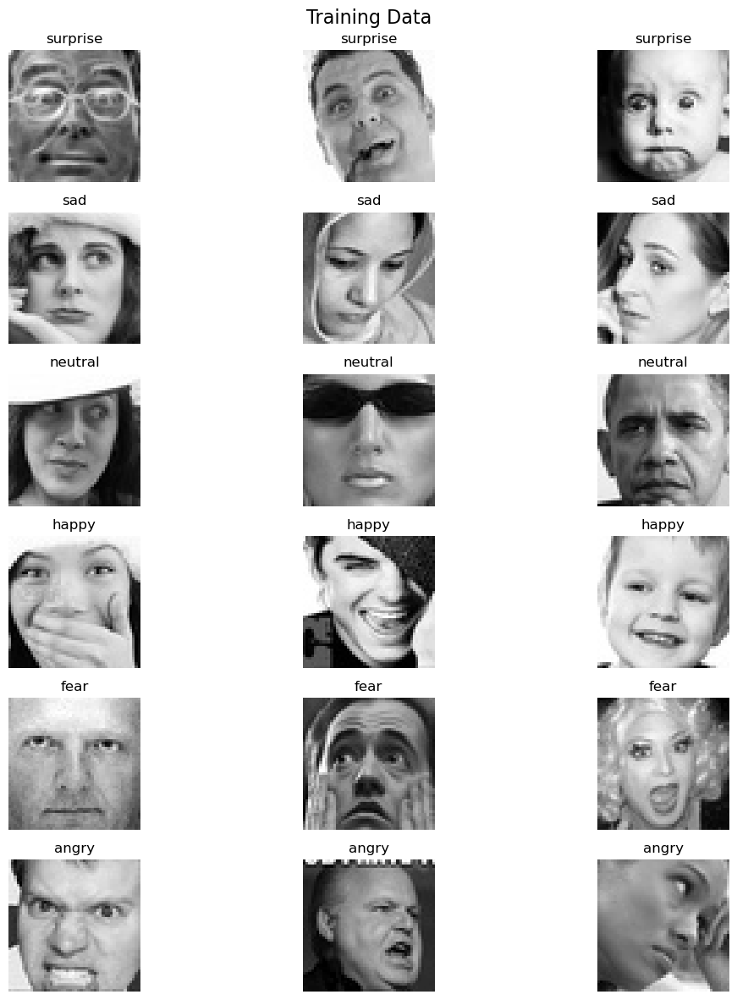

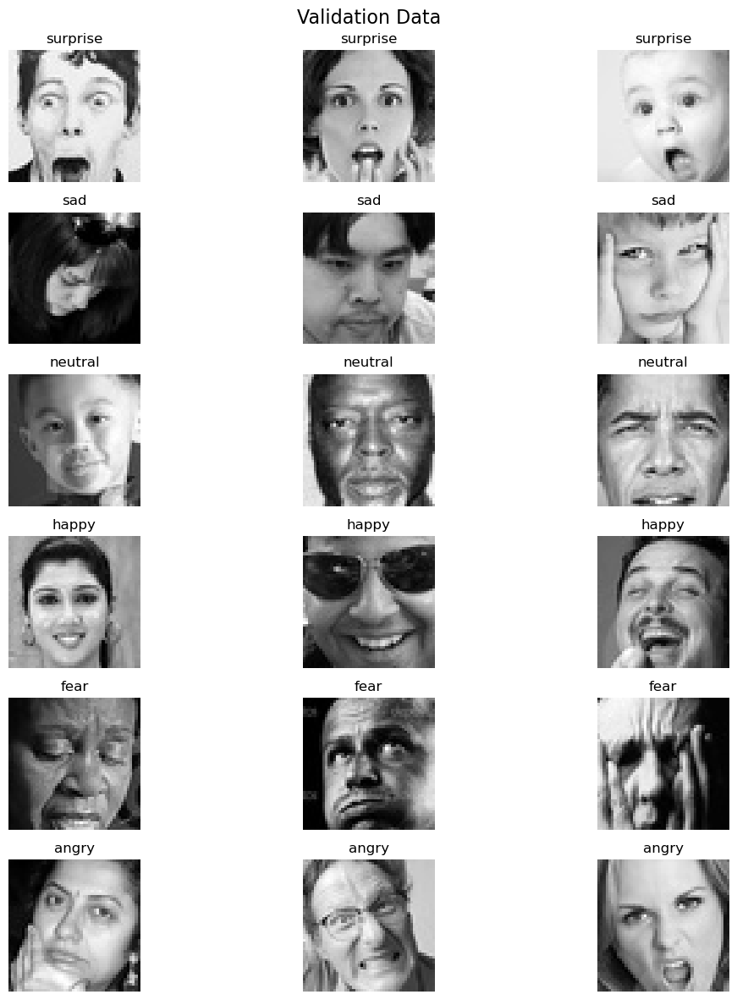

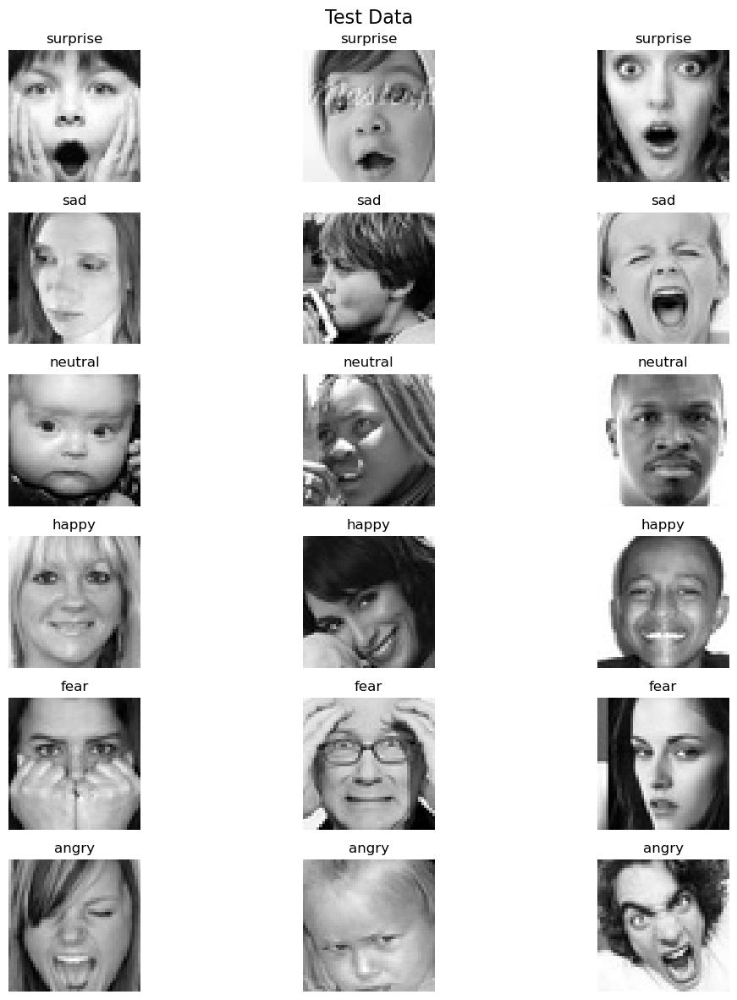

In [9]:
# Visualize images
target_classes = ["surprise", "sad", "neutral", "happy", "fear", "angry"]
visualize_images(train_data, "Training Data", target_classes)
visualize_images(val_data, "Validation Data", target_classes)
visualize_images(test_data, "Test Data", target_classes)

### Create DataLoader

In [ ]:
image_size = (48, 48)

In [ ]:
# Define custom Dataset class to handle image data from paths
class CustomDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths  # List of image file paths
        self.labels = labels  # List of labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]

        # Open image from path
        image = Image.open(img_path).convert("L")  # Ensure 3 channels (RGB)

        if self.transform:
            image = self.transform(image)

        # Flatten the image into a vector
        image = image.view(-1)  # Flatten from [C, H, W] to [C * H * W]

        # Convert label to tensor
        label_tensor = torch.tensor(label, dtype=torch.long)  # Use dtype=torch.long for classification tasks

        return image, label_tensor

# Function to prepare dataloaders and make the data compatible with the model
def prepare_dataloaders(train_data, val_data, test_data, batch_size=32):
    # Define a transform to normalize images to a standard size and tensor
    transform = transforms.Compose([
        transforms.Resize(image_size),  # Resize image to 48x48
        transforms.Grayscale(),         # Ensure image is grayscale
        transforms.ToTensor(),          # Convert to tensor
        transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize for grayscale
    ])

    # Create custom datasets for train, validation, and test
    train_dataset = CustomDataset(train_data['image_path'].tolist(), train_data['label'].tolist(), transform=transform)
    val_dataset = CustomDataset(val_data['image_path'].tolist(), val_data['label'].tolist(), transform=transform)
    test_dataset = CustomDataset(test_data['image_path'].tolist(), test_data['label'].tolist(), transform=transform)

    # Create dataloaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader

# Create a mapping from labels to numerical indices
label_to_index = {label: idx for idx, label in enumerate(train_data['label'].unique())}

# Map the string labels to integers in all datasets
train_data['label'] = train_data['label'].map(label_to_index)
val_data['label'] = val_data['label'].map(label_to_index)
test_data['label'] = test_data['label'].map(label_to_index)

# Inspect the number of unique labels (number of classes)
num_classes = len(train_data['label'].unique())
print(f"Number of classes: {num_classes}")
print("Label to Index Mapping:", label_to_index)


### Model 

#### Introduction and Overview of the MLP Model
The Multi-Layer Perceptron (MLP) is a foundational neural network architecture widely used for supervised learning tasks, particularly classification and regression. Its modularity, defined by customizable hidden layers, activation functions, and optimization techniques, allows it to adapt to various problem domains.

In this analysis, we designed an MLP with configurable parameters to investigate the effect of key architectural and training choices, including the number of hidden layers, optimizer types, learning rates, and batch sizes, on the model’s performance. The study aims to derive insights into how these hyperparameters influence overall accuracy, the worst-class accuracy (i.e., performance on the most challenging class), and the confusion matrix distribution. 

The experiments were conducted using two configurations: one without hidden layers (essentially a logistic regression model) and another with three hidden layers of decreasing sizes (256, 128, and 64 neurons). These configurations were trained using two optimizers (SGD and Adam), two learning rates (0.01 and 0.001), and batch sizes of 64 and 128. Each combination was evaluated over 15 training epochs, and results were assessed using metrics such as overall accuracy and worst-class accuracy.


In [ ]:
# Define the MLP model
class MLP(nn.Module):
    def __init__(self, input_size, num_hidden_layers, hidden_width, num_output, activation_functions, dropouts):
        super(MLP, self).__init__()
        layers = [nn.Flatten()]  # Add a flattening layer as the first layer
        in_features = input_size

        # Add hidden layers
        for i in range(num_hidden_layers):
            layers.append(nn.Linear(in_features, hidden_width[i]))
            layers.append(activation_functions[i])
            if dropouts[i]:
                layers.append(nn.Dropout(0.5))  # Example dropout rate
            in_features = hidden_width[i]

        # Add output layer
        layers.append(nn.Linear(in_features, num_output))
        layers.append(nn.Softmax(dim=1))  # Add Softmax activation for the output

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

# Helper to create an MLP model
def create_mlp(input_size, num_hidden_layers, hidden_widths, num_output, activation_functions, dropouts):
    assert num_hidden_layers == len(hidden_widths), "Mismatch between hidden layers and widths."
    assert len(hidden_widths) == len(activation_functions), "Mismatch between layers and activation functions."
    assert len(hidden_widths) == len(dropouts), "Mismatch between layers and dropout flags."

    layers = []
    in_features = input_size  # Start with the input size

    for i in range(num_hidden_layers):
        layers.append(nn.Linear(in_features, hidden_widths[i]))
        layers.append(activation_functions[i])
        if dropouts[i]:
            layers.append(nn.Dropout(0.5))  # Example dropout rate
        in_features = hidden_widths[i]

    layers.append(nn.Linear(in_features, num_output))  # Final output layer
    return nn.Sequential(*layers)


### Learning

In [ ]:
# Training function with tqdm progress bars and confusion matrix saved in history
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, test_loader):
    history = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": [],
        "confusion_matrices": {},  # Store confusion matrices at specified epochs
    }

    model.to(device)

    for epoch in range(1, num_epochs + 1):
        print(f"Epoch {epoch}/{num_epochs}")

        # Training phase
        model.train()
        running_loss, correct_preds = 0.0, 0
        train_progress = tqdm(train_loader, desc="Training", leave=False)
        for images, labels in train_progress:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            correct_preds += (outputs.argmax(dim=1) == labels).sum().item()
            train_progress.set_postfix(loss=loss.item())

        train_loss = running_loss / len(train_loader.dataset)
        train_acc = correct_preds / len(train_loader.dataset)

        # Validation phase
        model.eval()
        val_loss, val_correct_preds = 0.0, 0
        val_progress = tqdm(val_loader, desc="Validating", leave=False)
        with torch.no_grad():
            for images, labels in val_progress:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                val_correct_preds += (outputs.argmax(dim=1) == labels).sum().item()
                val_progress.set_postfix(loss=loss.item())

        val_loss /= len(val_loader.dataset)
        val_acc = val_correct_preds / len(val_loader.dataset)

        # Log results
        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} - "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        # Save confusion matrix in history every 5 epochs
        if epoch % 5 == 0:
            cm = evaluate_model(model, test_loader, device)
            print(f"Epoch {epoch}: Confusion Matrix:\n{cm}")
            history["confusion_matrices"][epoch] = cm.tolist()  # Convert to list for JSON serialization

    return history


def evaluate_model(model, data_loader, device):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in tqdm(data_loader, desc="Testing", leave=False):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            all_preds.extend(outputs.argmax(dim=1).cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    cm = confusion_matrix(all_labels, all_preds)
    return cm


In [ ]:
# Define parameters
optimizers = [optim.SGD, optim.Adam]
learning_rates = [0.01, 0.001]
batch_sizes = [64, 128]
epoch_numbers = 15
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
# Model configurations with different numbers of hidden layers
hidden_configs = [
    {"num_hidden_layers": 0, "hidden_widths": []},
    {"num_hidden_layers": 3, "hidden_widths": [256, 128, 64]},
]

results = []  # To store results for all configurations

# Iterate through all combinations
for opt_fn in optimizers:
    for lr in learning_rates:
        for batch_size in batch_sizes:
            print(f"Running experiment: Optimizer={opt_fn.__name__}, LR={lr}, Batch Size={batch_size}")

            # Prepare dataloaders
            train_loader, val_loader, test_loader = prepare_dataloaders(
                train_data, val_data, test_data, batch_size
            )

            for config in hidden_configs:
                print(f"Training model with config: {config}")

                # Create MLP model
                model = create_mlp(
                    input_size=image_size[0] * image_size[1] * 1,  # Flattened input size gray
                    **config,
                    num_output=num_classes,
                    activation_functions=[nn.ReLU()] * config["num_hidden_layers"],
                    dropouts=[False] * config["num_hidden_layers"],
                )


                # Define loss and optimizer
                criterion = nn.CrossEntropyLoss()
                optimizer = opt_fn(model.parameters(), lr=lr)

                # Train the model
                history = train_model(
                    model,
                    train_loader,
                    val_loader,
                    criterion,
                    optimizer,
                    epoch_numbers,  # Train for the maximum epoch number
                    device,
                    test_loader,
                )

                # Save results for this configuration
                results.append({
                    "optimizer": opt_fn.__name__,
                    "lr": lr,
                    "batch_size": batch_size,
                    "model_config": config,
                    "history": history,
                })

In [ ]:
# Define a helper function to make results JSON serializable
def serialize_results(results):
    def serialize_obj(obj):
        if isinstance(obj, np.ndarray):  # Convert numpy arrays to lists
            return obj.tolist()
        elif isinstance(obj, torch.Tensor):  # Convert tensors to lists
            return obj.cpu().tolist()
        elif isinstance(obj, dict):  # Recursively process dictionaries
            return {k: serialize_obj(v) for k, v in obj.items()}
        elif isinstance(obj, list):  # Recursively process lists
            return [serialize_obj(v) for v in obj]
        else:  # Default: Return the object as is
            return obj

    return [serialize_obj(result) for result in results]

# Serialize and save results
serialized_results = serialize_results(results)
with open("mlp_results.json", "w") as f:
    json.dump(serialized_results, f)

### Analysis

Visualizing for:  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Hidden Layers: 0


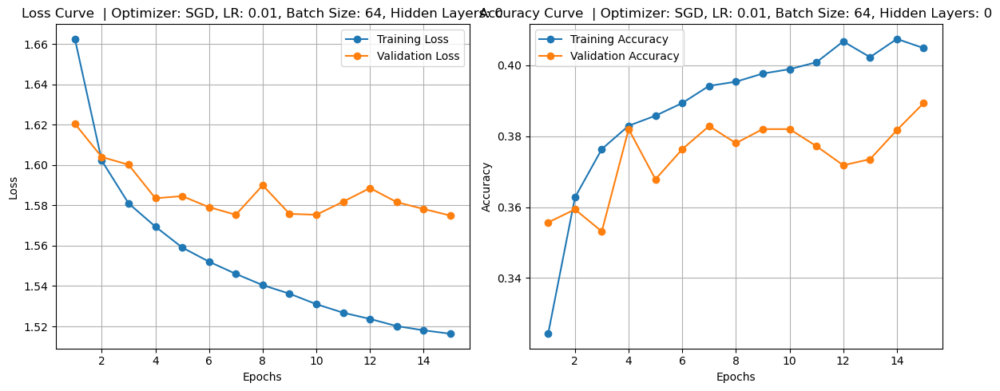

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Hidden Layers: 0


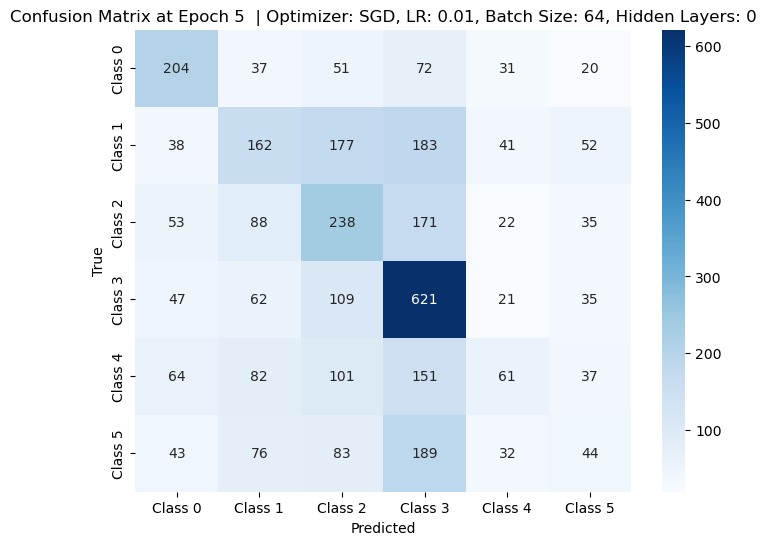

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Hidden Layers: 0


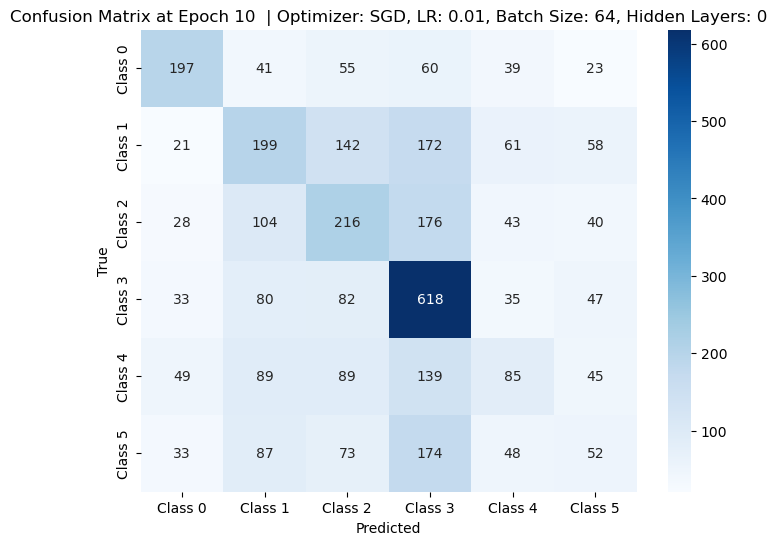

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Hidden Layers: 0


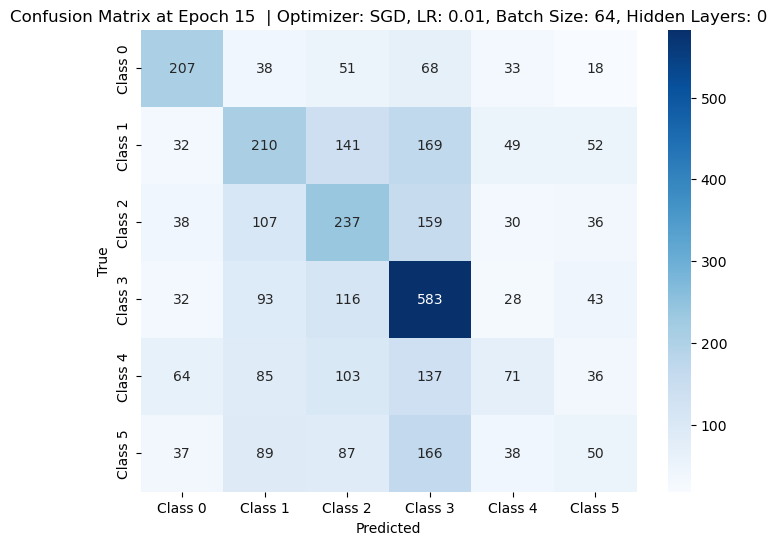

Visualizing for:  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Hidden Layers: 3


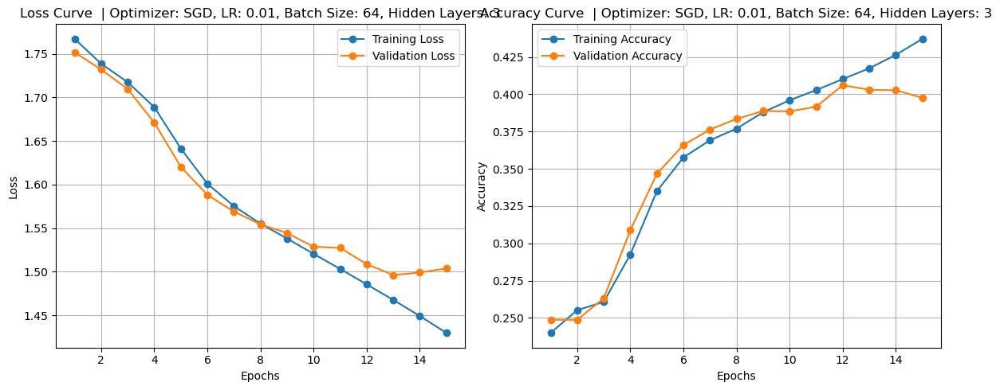

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Hidden Layers: 3


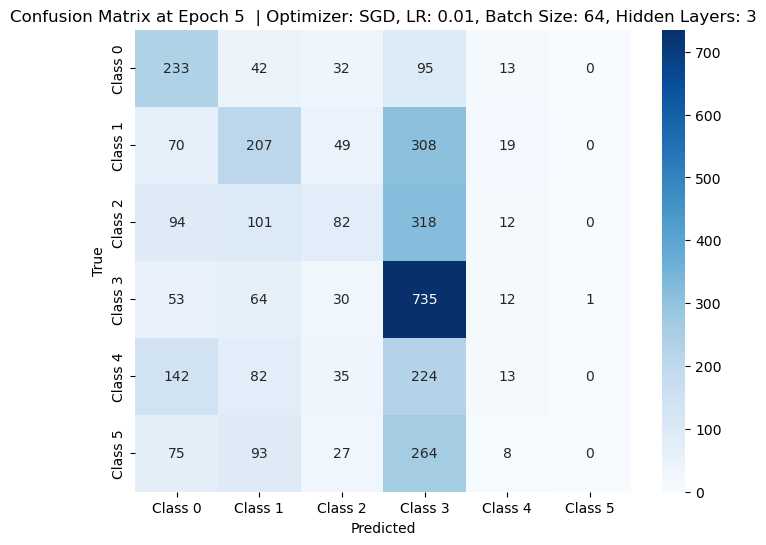

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Hidden Layers: 3


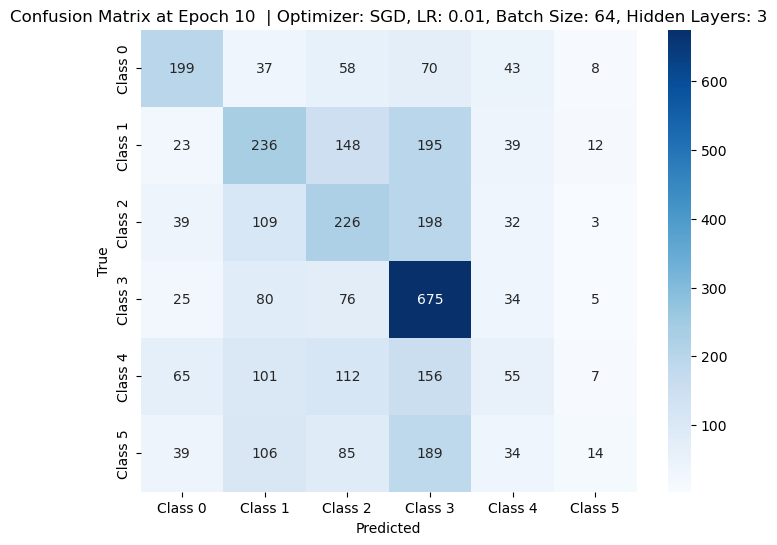

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Hidden Layers: 3


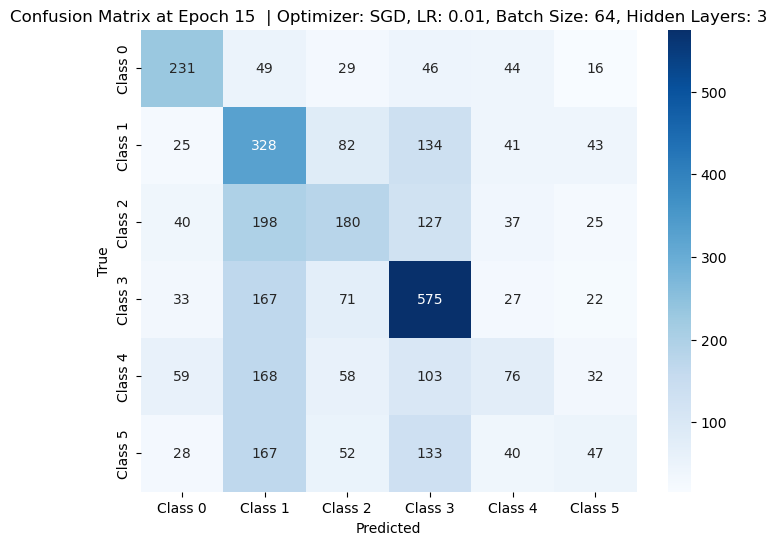

Visualizing for:  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Hidden Layers: 0


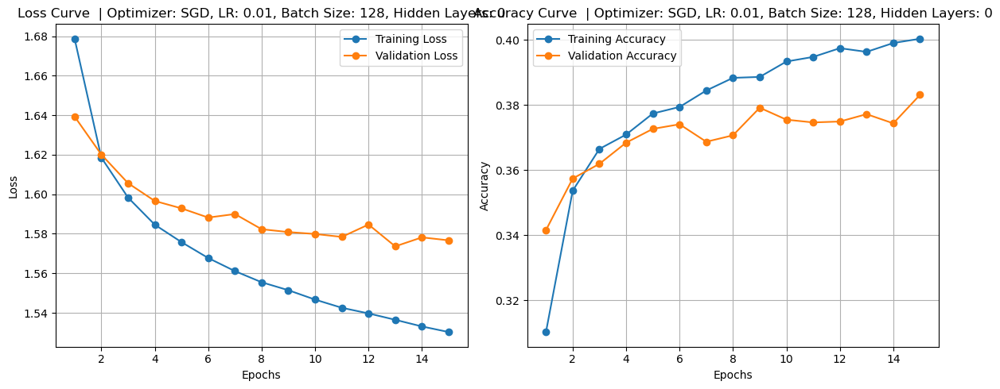

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Hidden Layers: 0


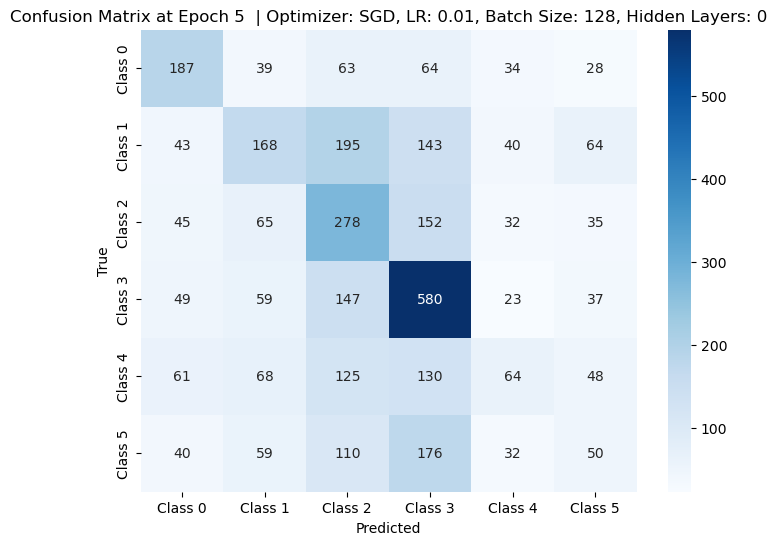

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Hidden Layers: 0


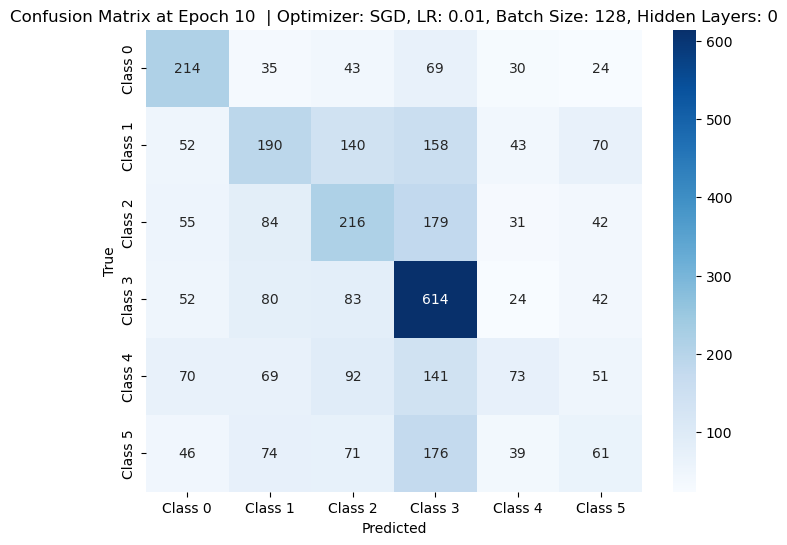

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Hidden Layers: 0


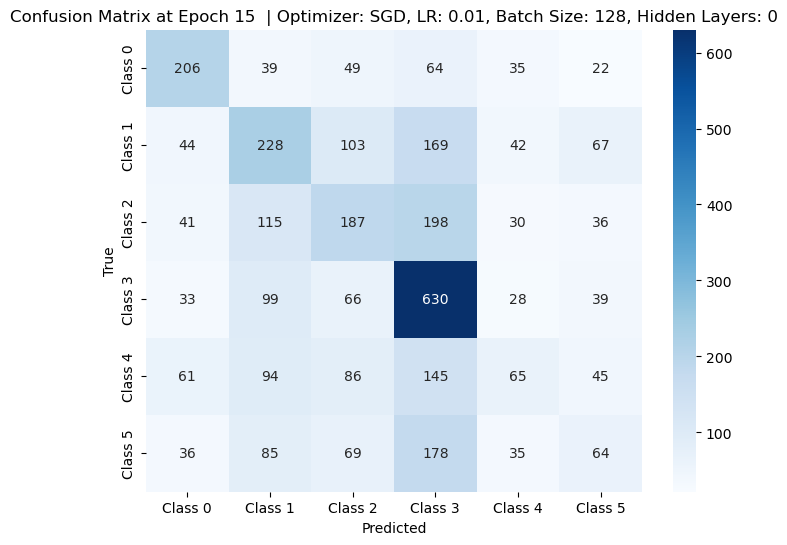

Visualizing for:  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Hidden Layers: 3


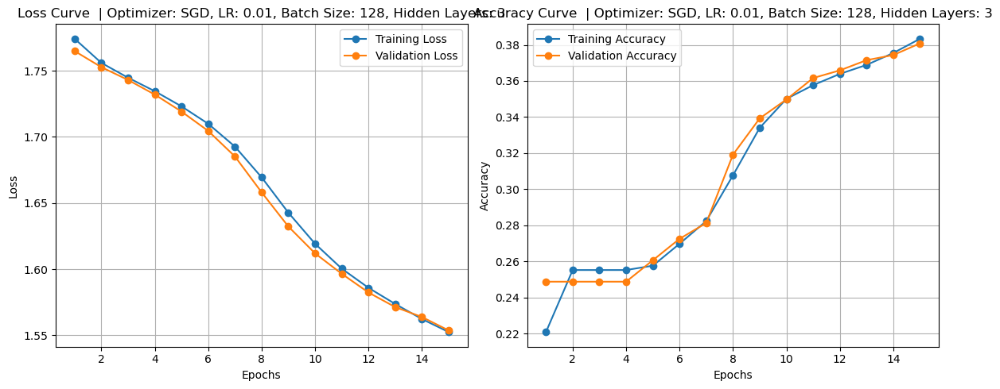

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Hidden Layers: 3


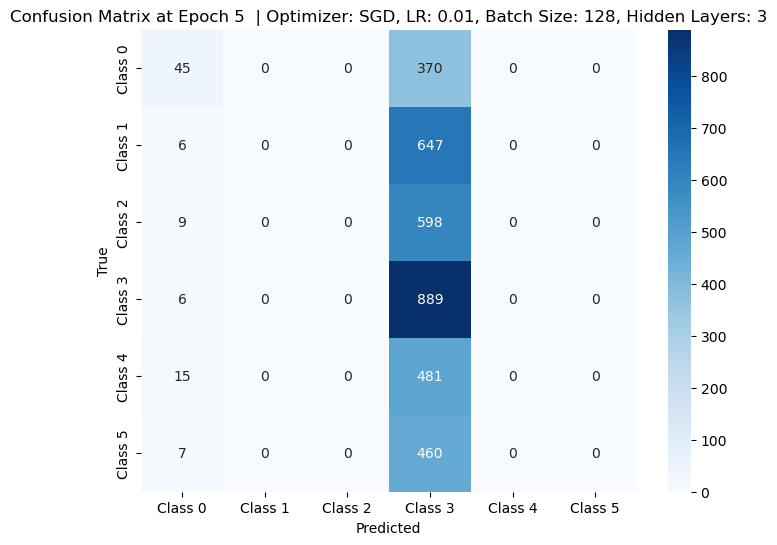

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Hidden Layers: 3


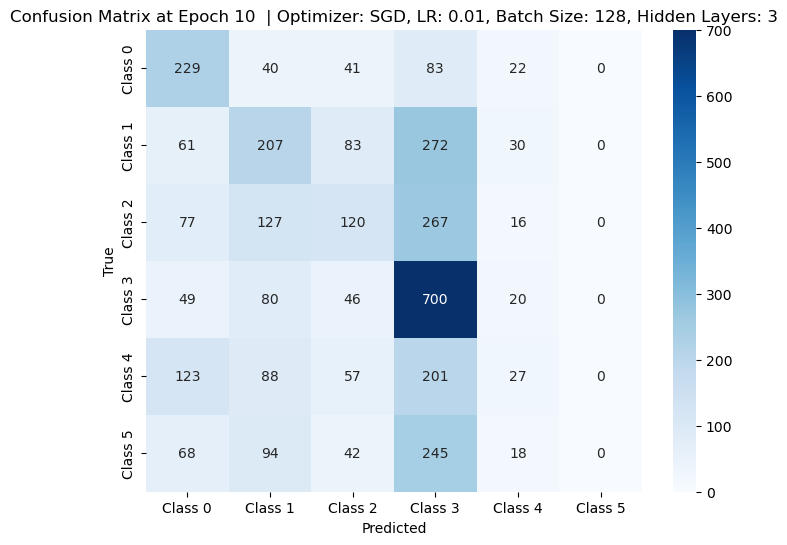

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Hidden Layers: 3


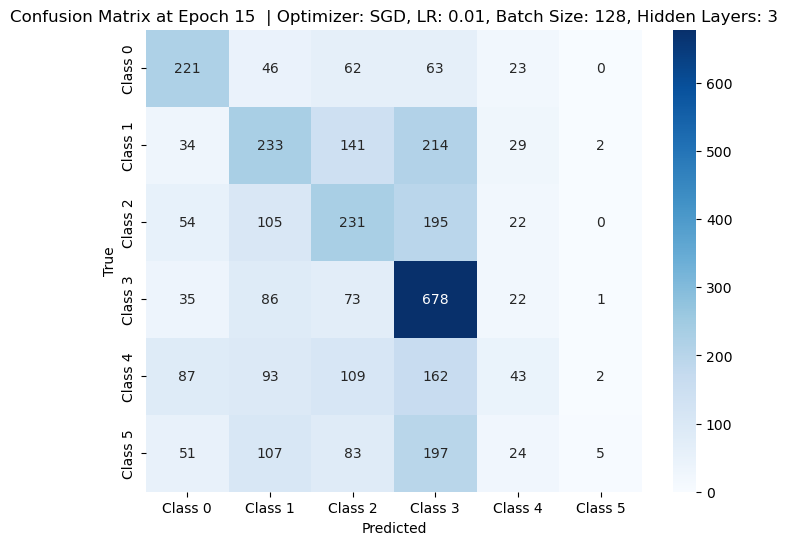

Visualizing for:  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Hidden Layers: 0


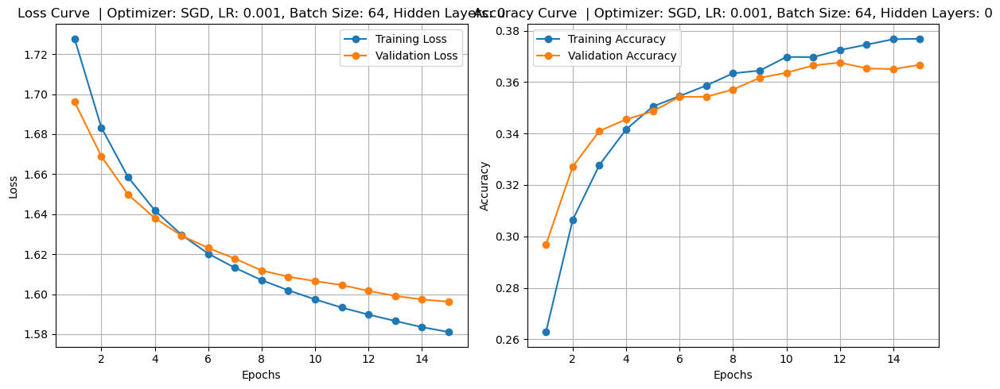

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Hidden Layers: 0


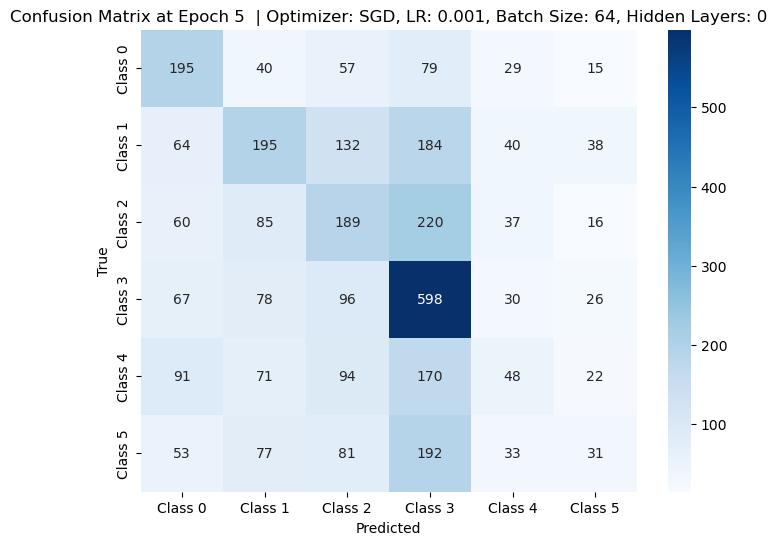

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Hidden Layers: 0


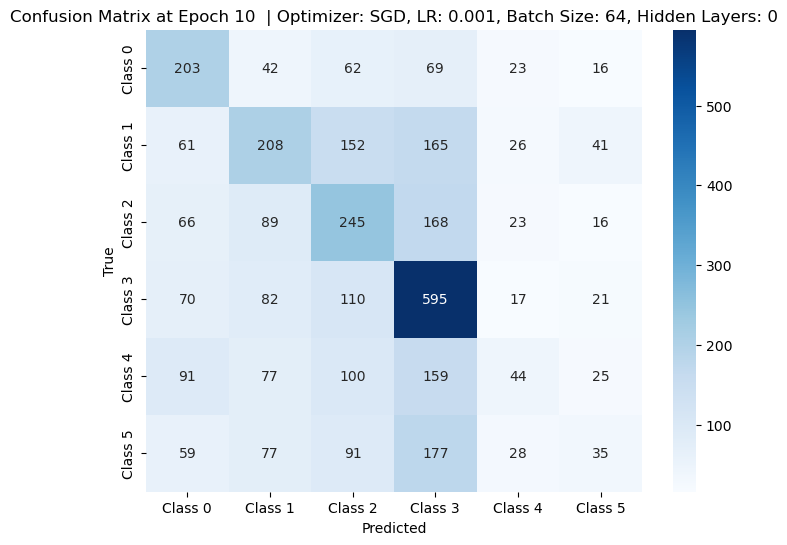

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Hidden Layers: 0


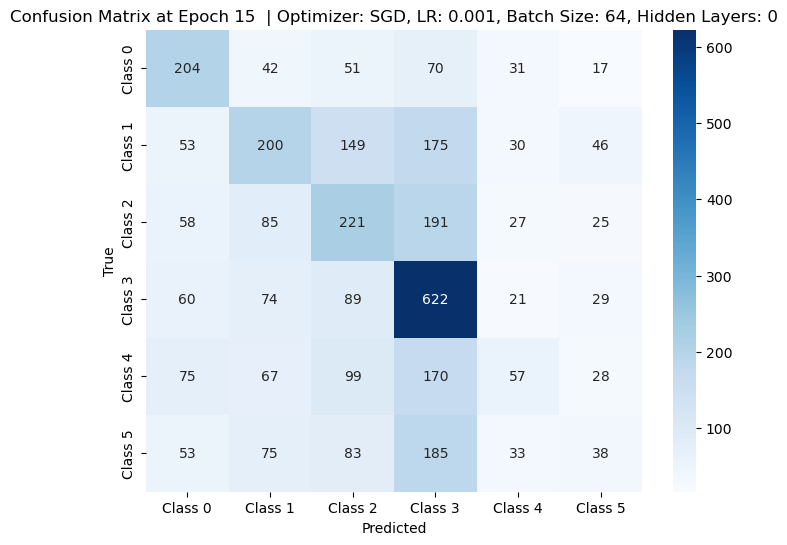

Visualizing for:  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Hidden Layers: 3


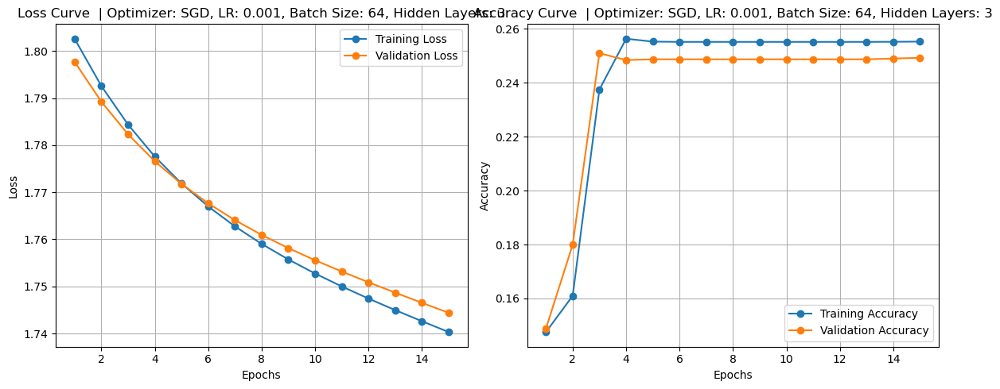

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Hidden Layers: 3


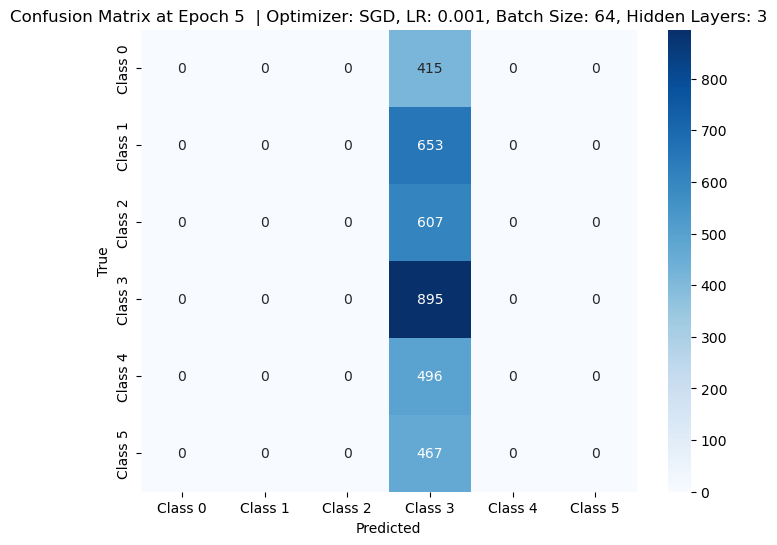

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Hidden Layers: 3


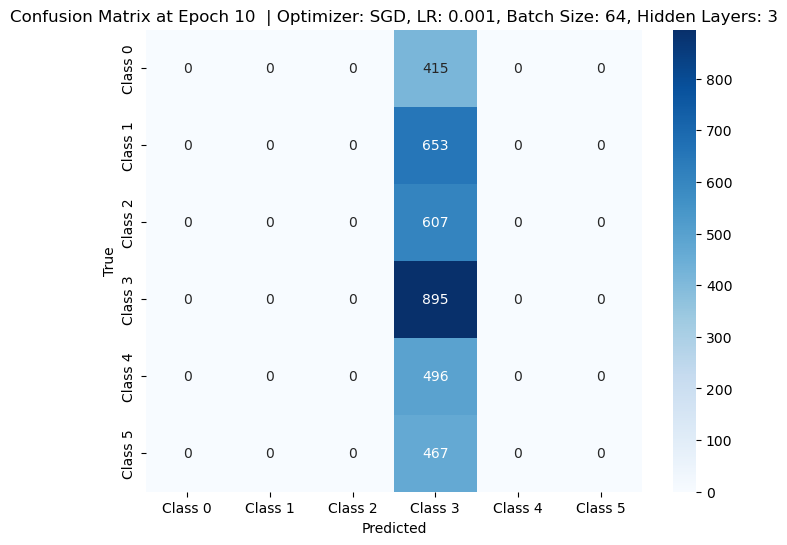

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Hidden Layers: 3


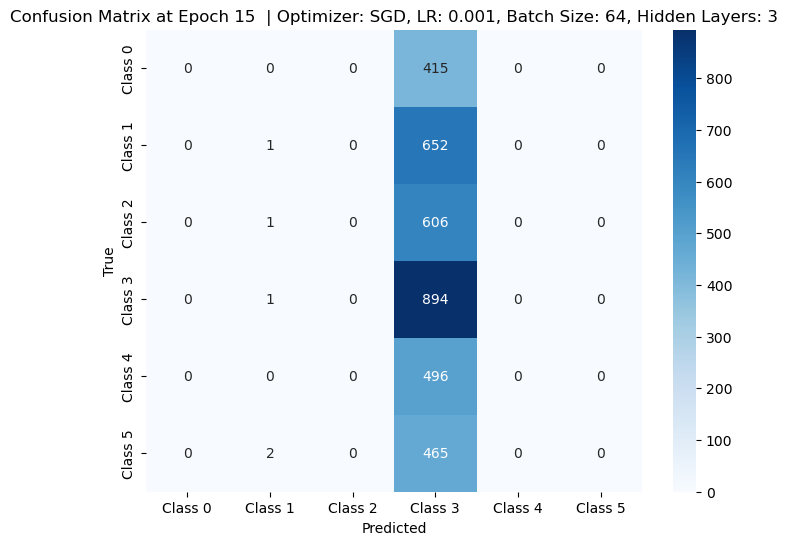

Visualizing for:  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Hidden Layers: 0


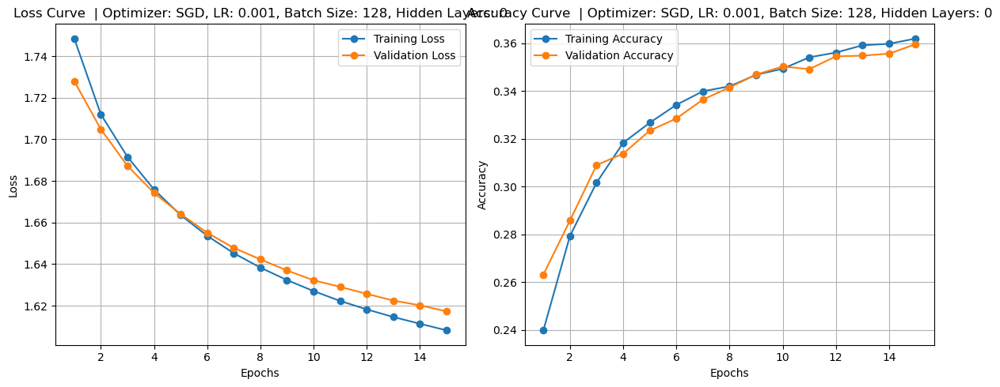

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Hidden Layers: 0


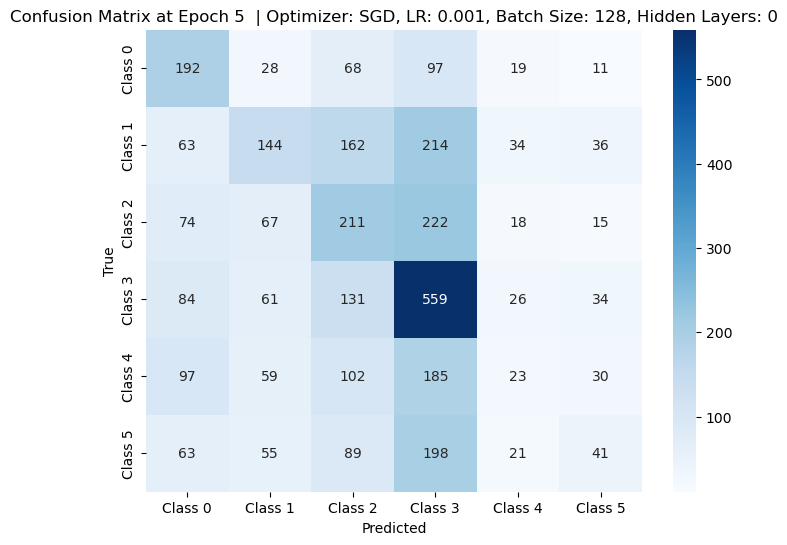

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Hidden Layers: 0


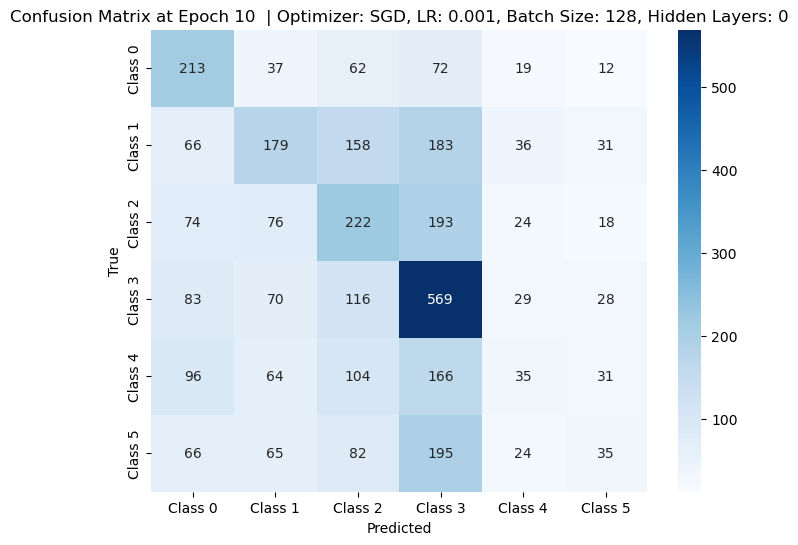

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Hidden Layers: 0


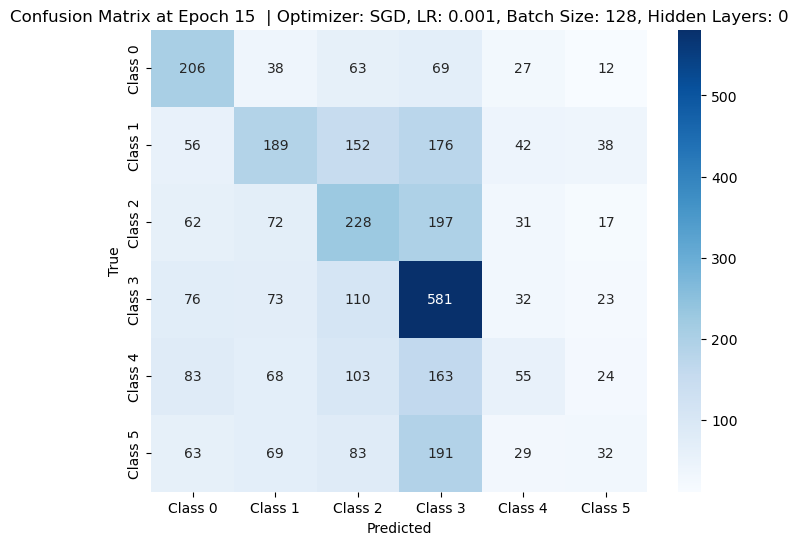

Visualizing for:  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Hidden Layers: 3


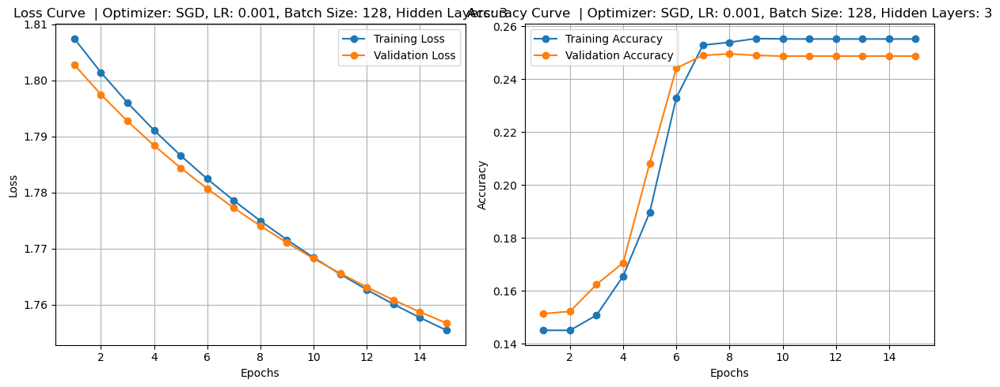

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Hidden Layers: 3


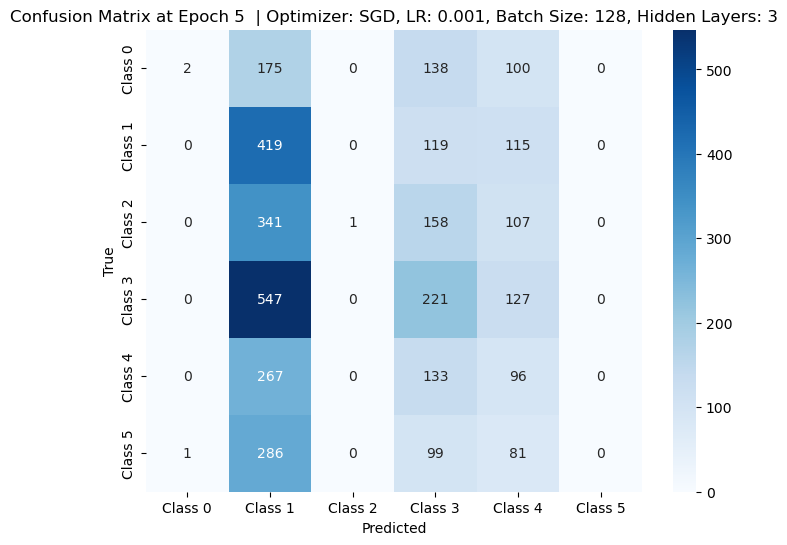

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Hidden Layers: 3


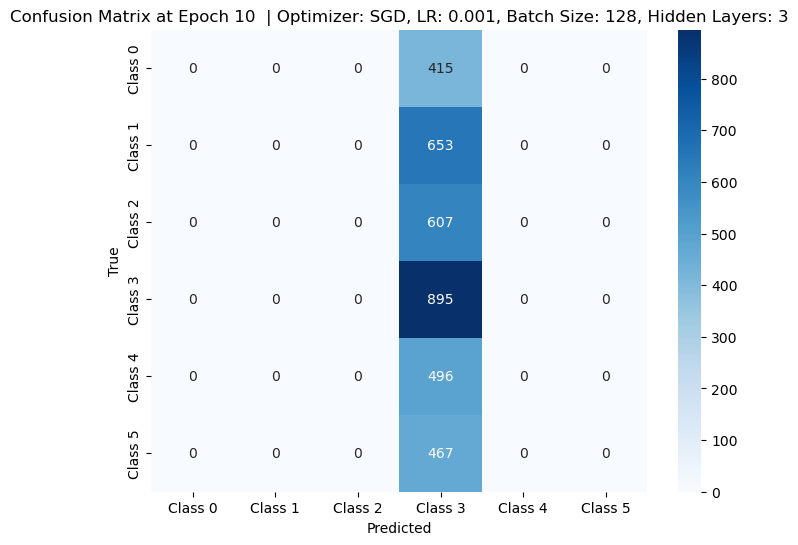

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Hidden Layers: 3


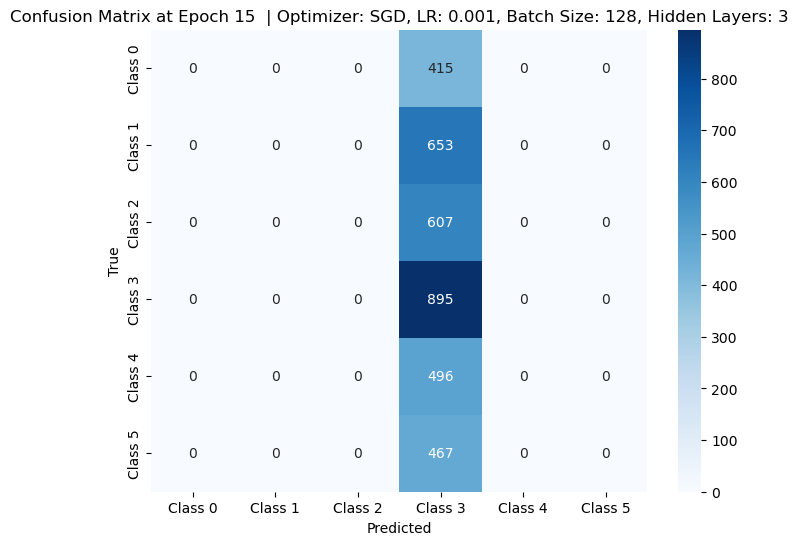

Visualizing for:  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Hidden Layers: 0


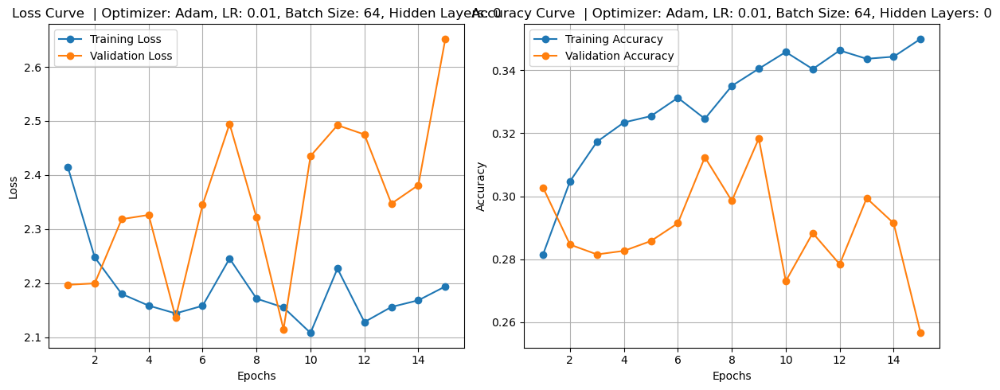

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Hidden Layers: 0


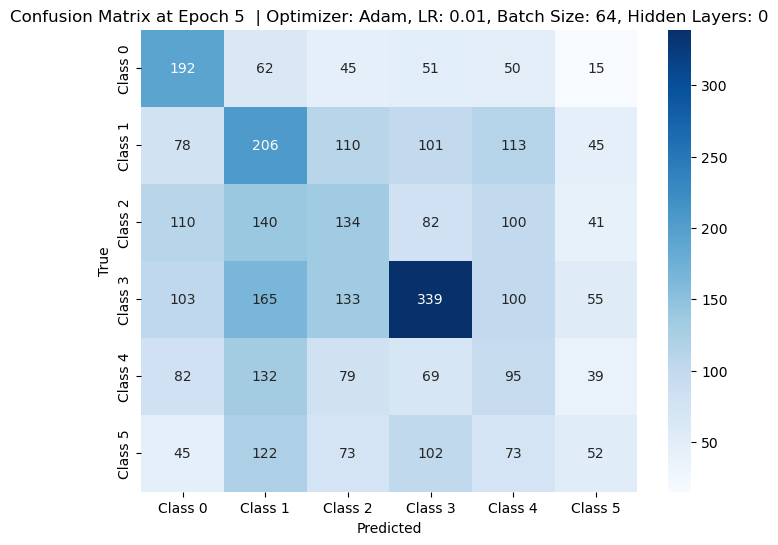

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Hidden Layers: 0


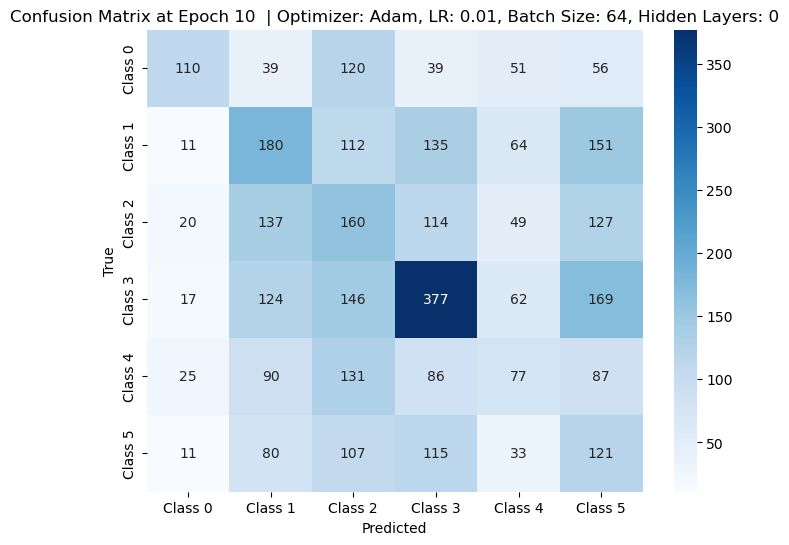

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Hidden Layers: 0


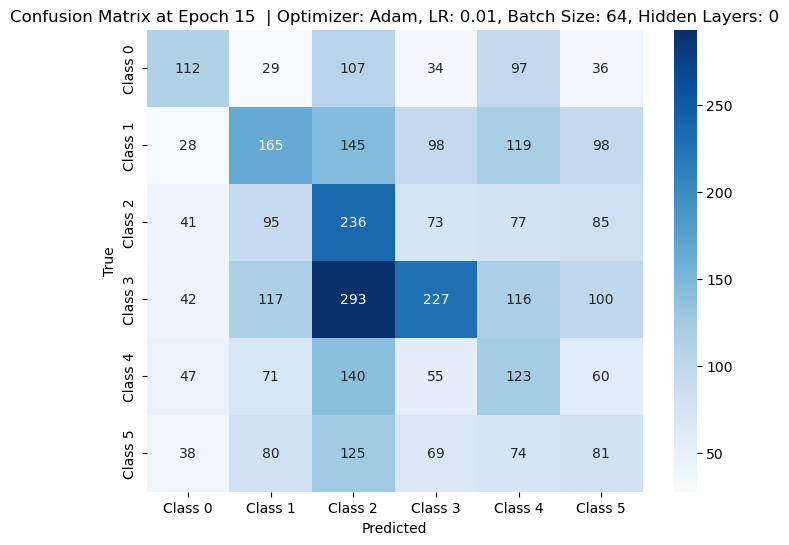

Visualizing for:  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Hidden Layers: 3


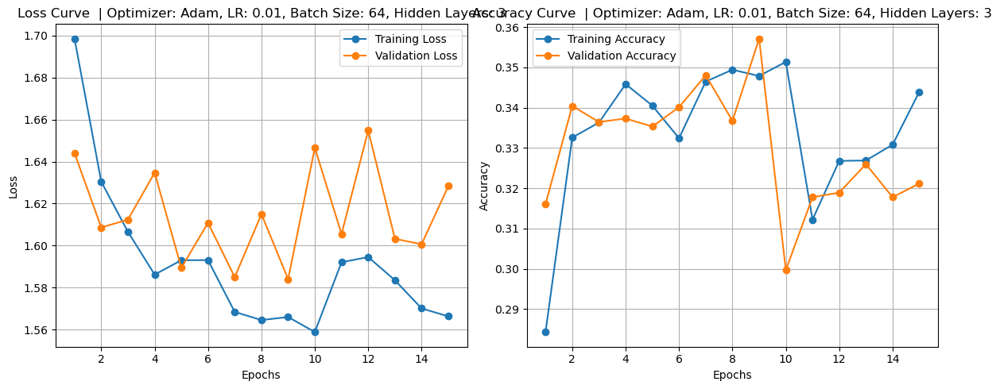

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Hidden Layers: 3


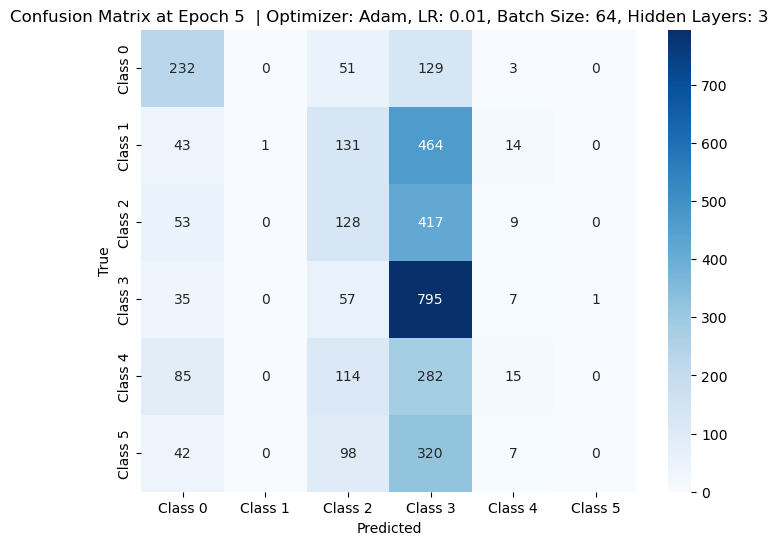

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Hidden Layers: 3


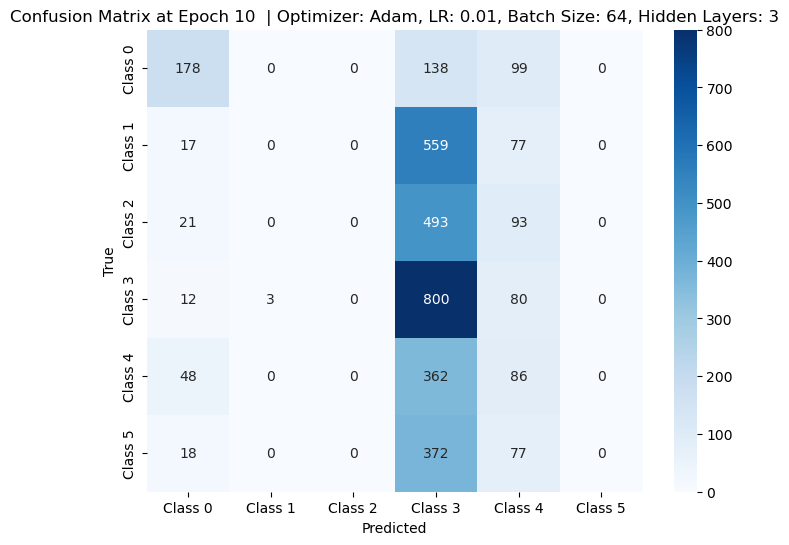

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Hidden Layers: 3


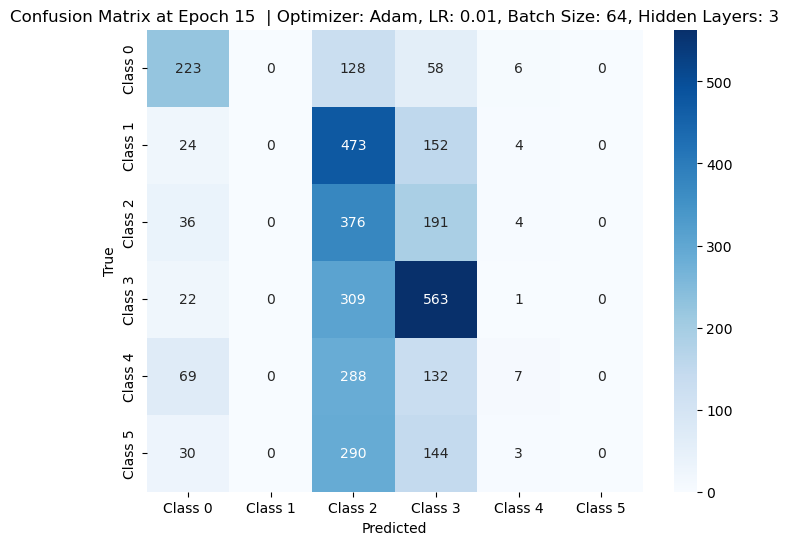

Visualizing for:  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Hidden Layers: 0


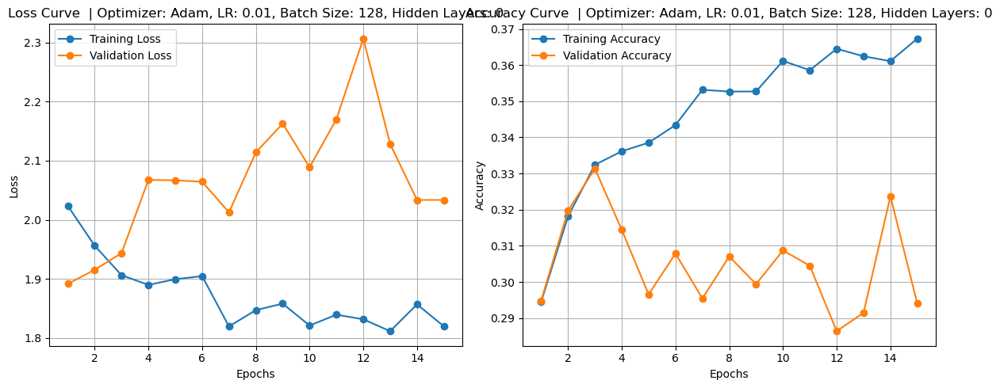

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Hidden Layers: 0


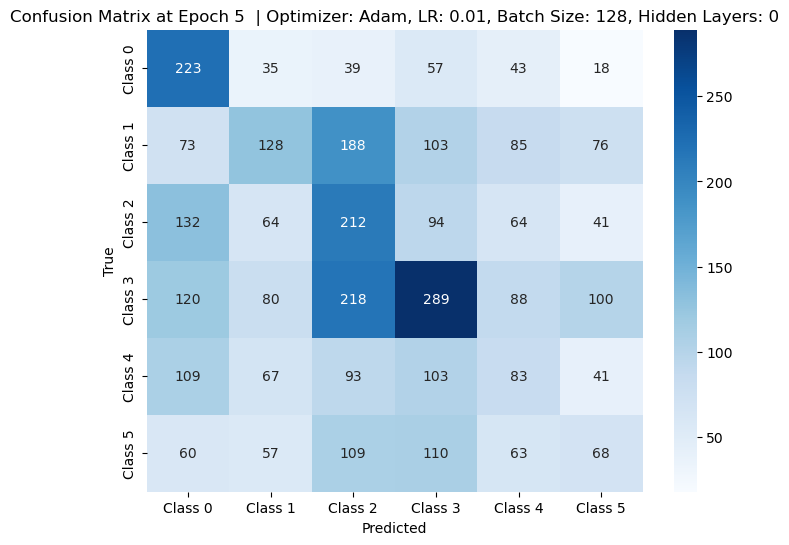

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Hidden Layers: 0


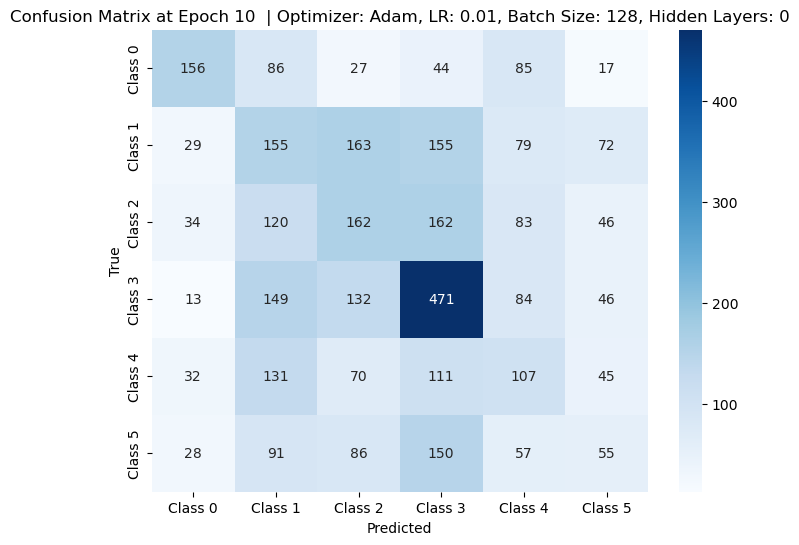

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Hidden Layers: 0


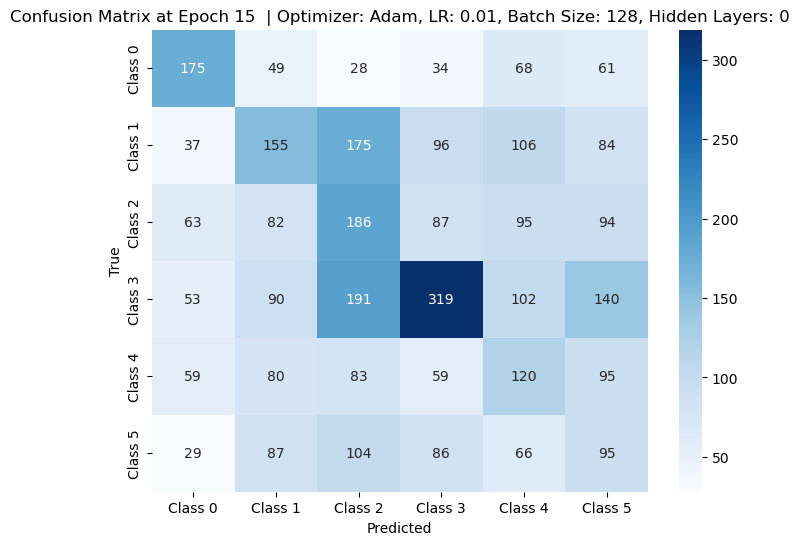

Visualizing for:  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Hidden Layers: 3


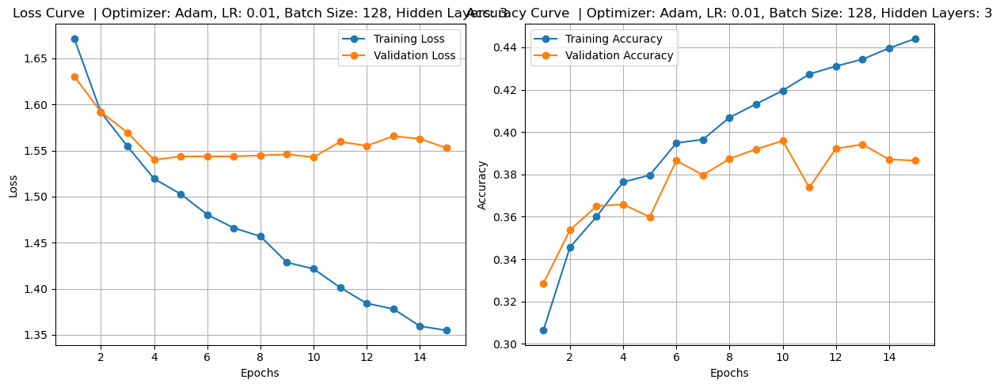

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Hidden Layers: 3


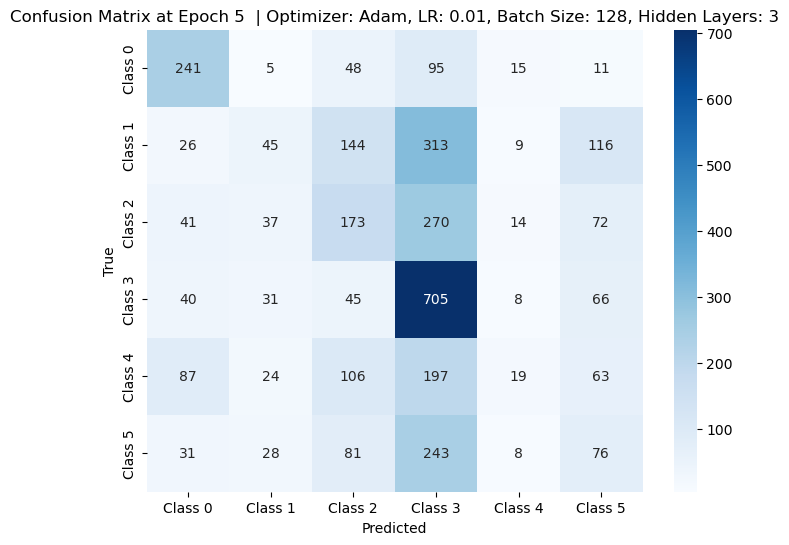

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Hidden Layers: 3


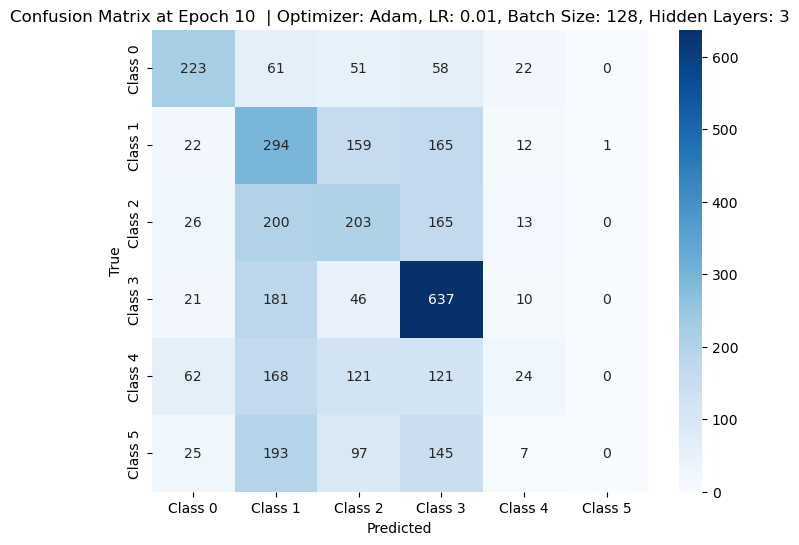

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Hidden Layers: 3


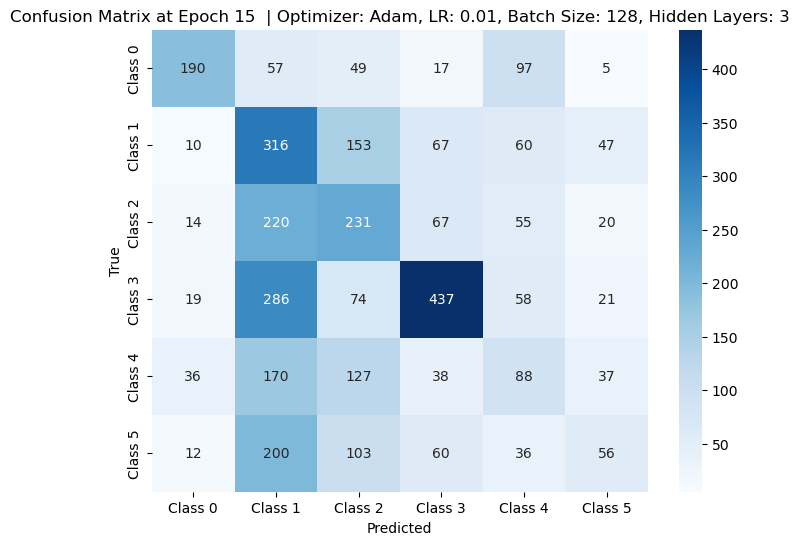

Visualizing for:  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Hidden Layers: 0


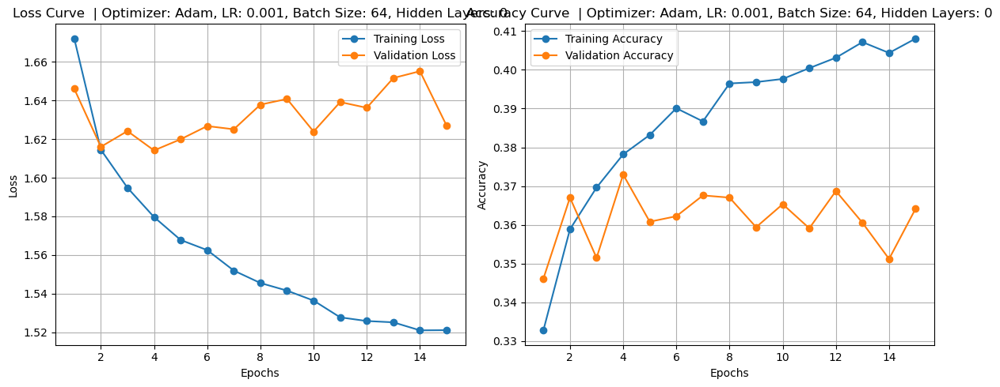

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Hidden Layers: 0


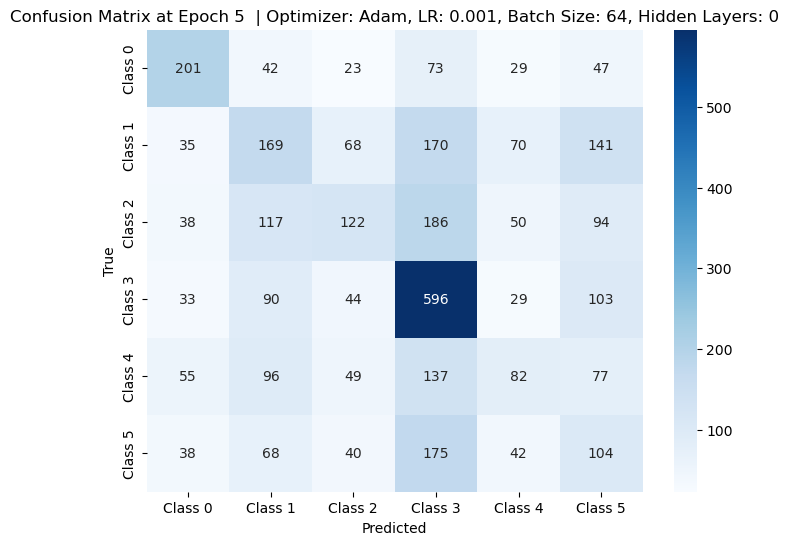

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Hidden Layers: 0


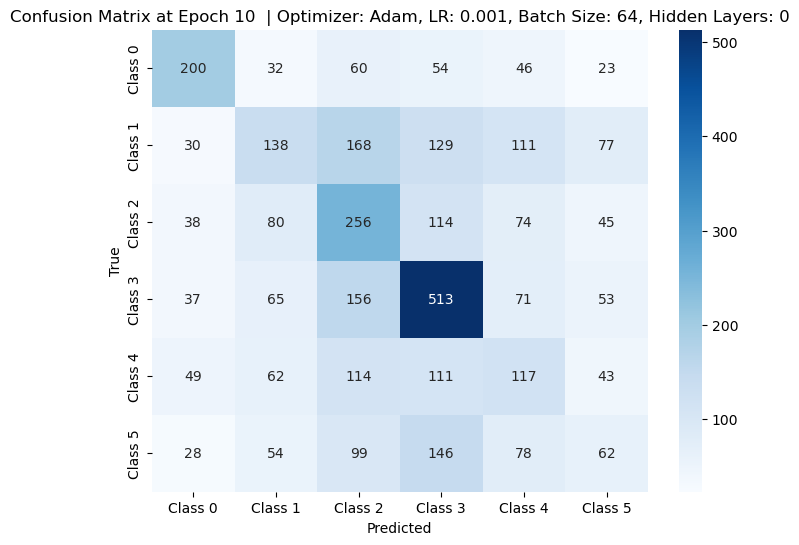

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Hidden Layers: 0


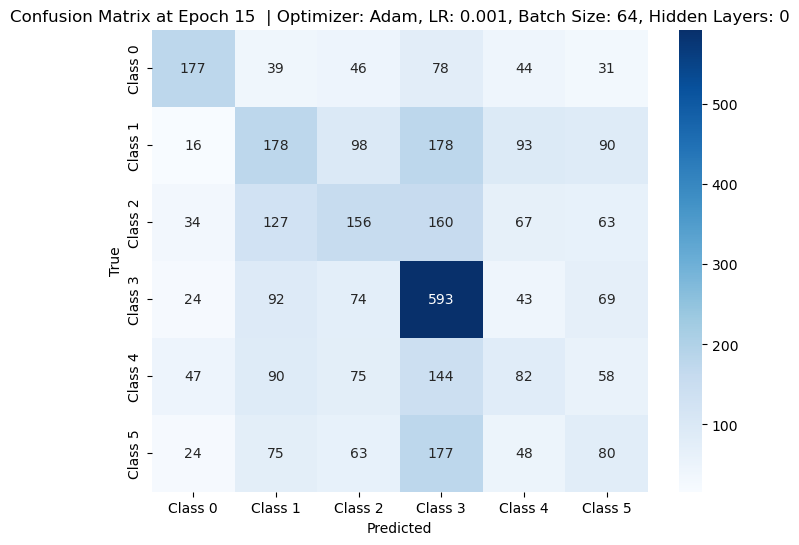

Visualizing for:  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Hidden Layers: 3


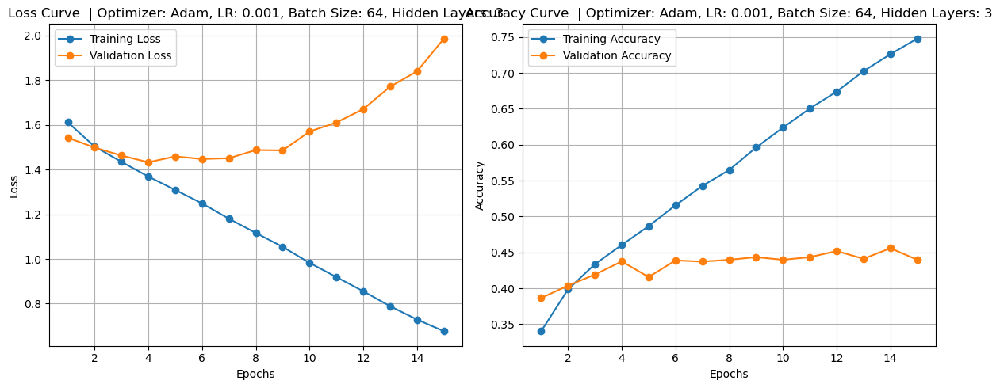

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Hidden Layers: 3


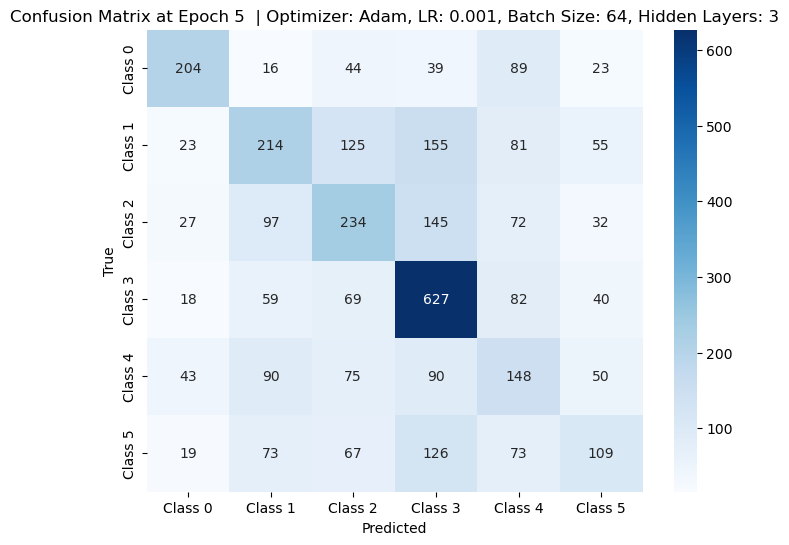

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Hidden Layers: 3


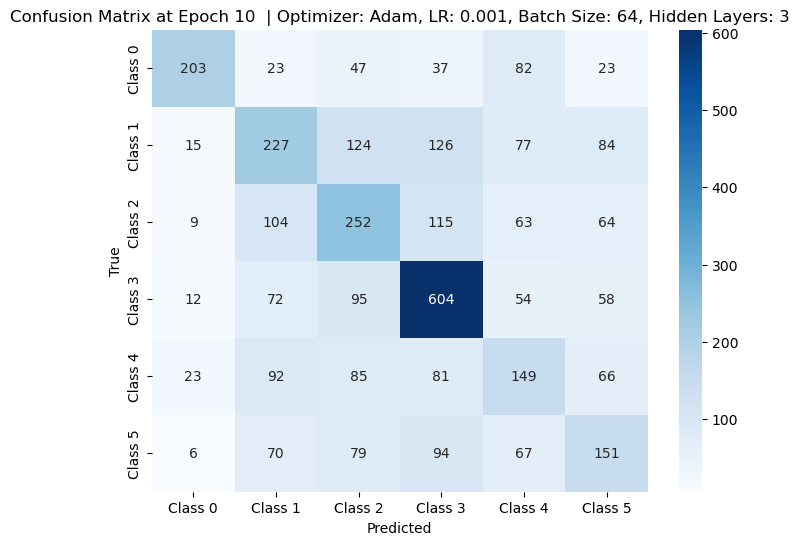

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Hidden Layers: 3


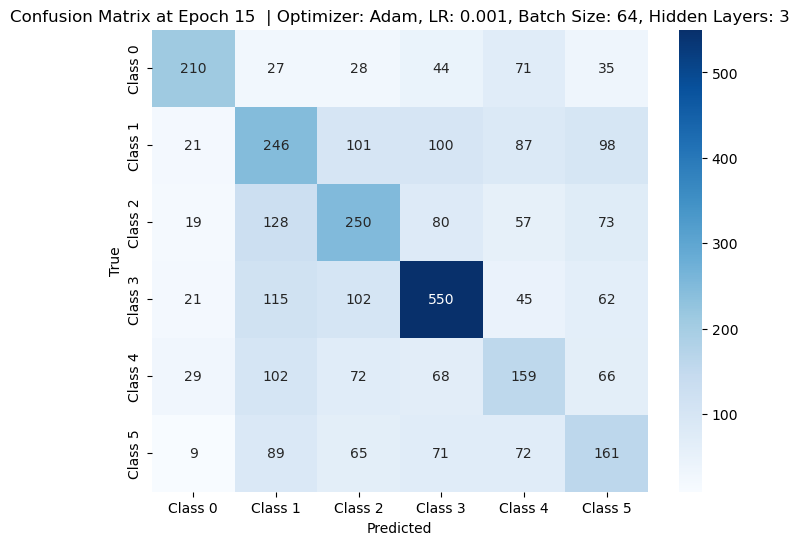

Visualizing for:  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Hidden Layers: 0


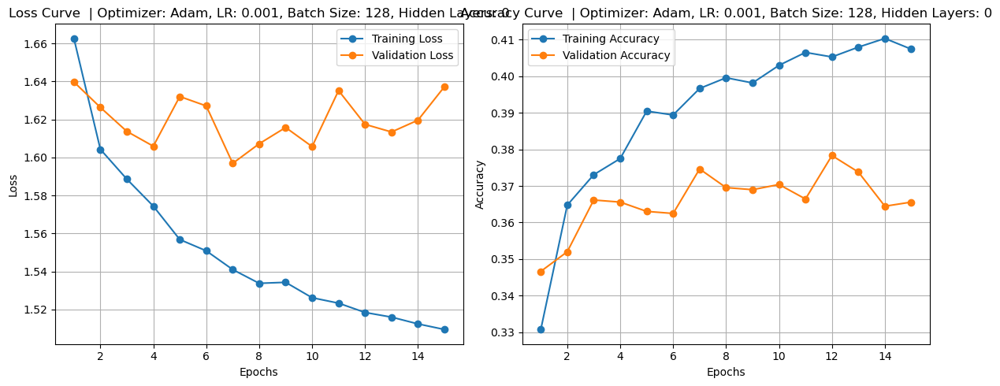

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Hidden Layers: 0


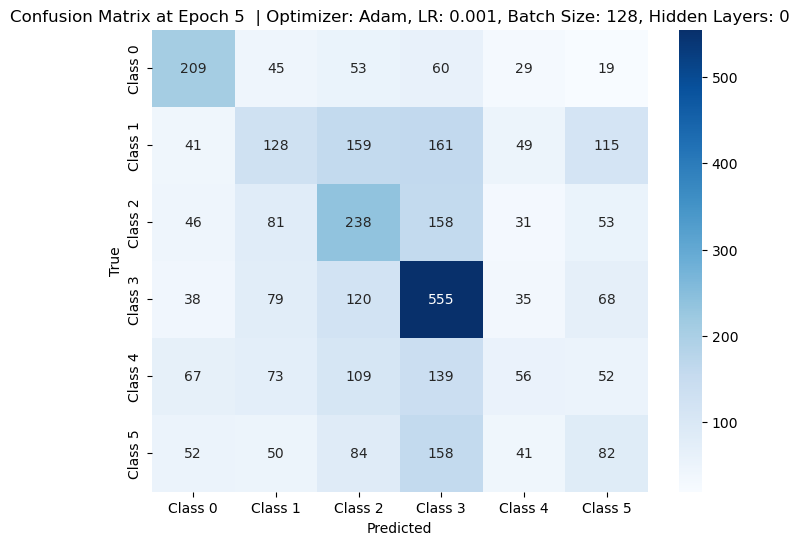

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Hidden Layers: 0


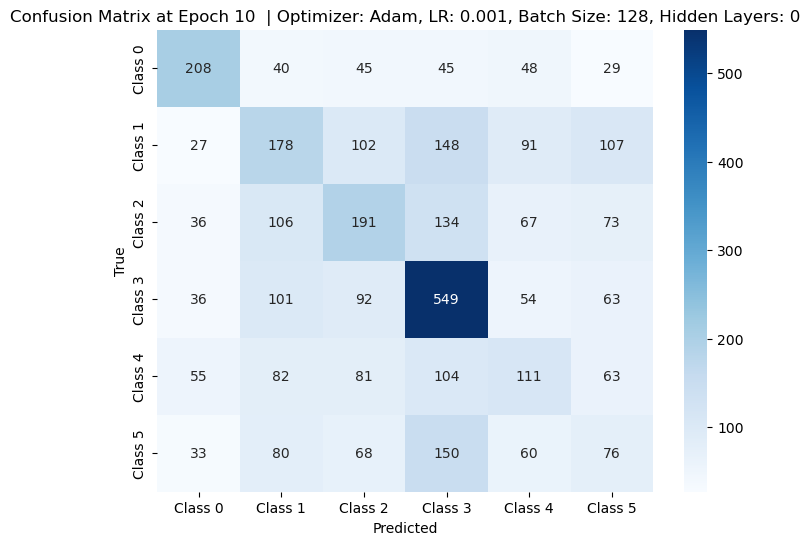

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Hidden Layers: 0


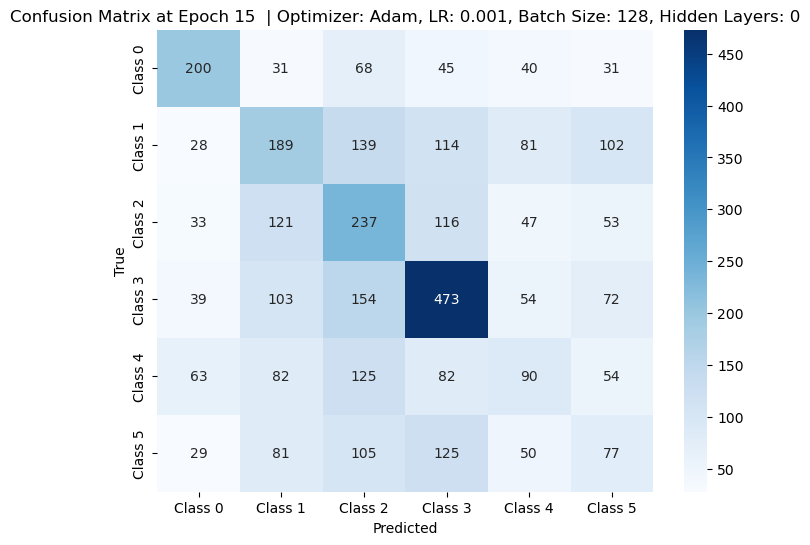

Visualizing for:  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Hidden Layers: 3


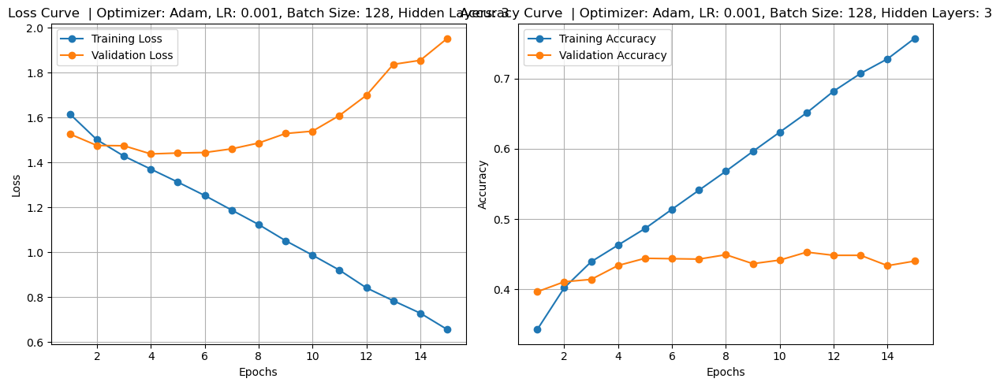

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Hidden Layers: 3


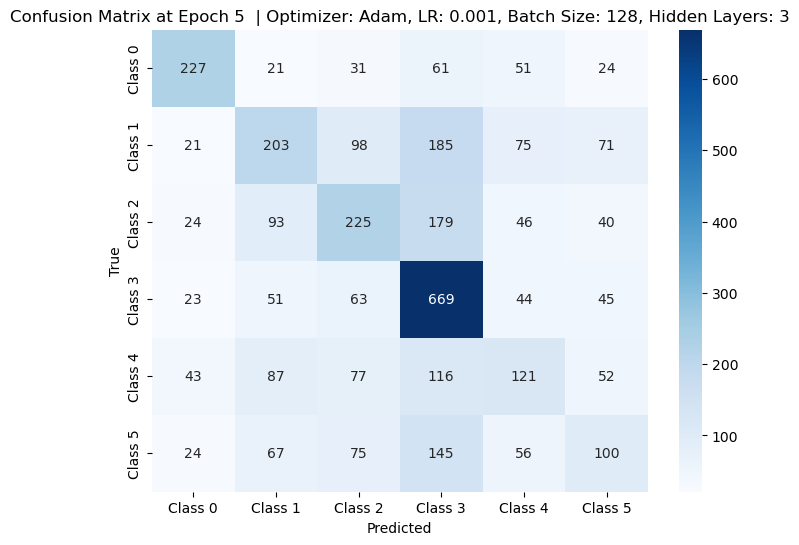

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Hidden Layers: 3


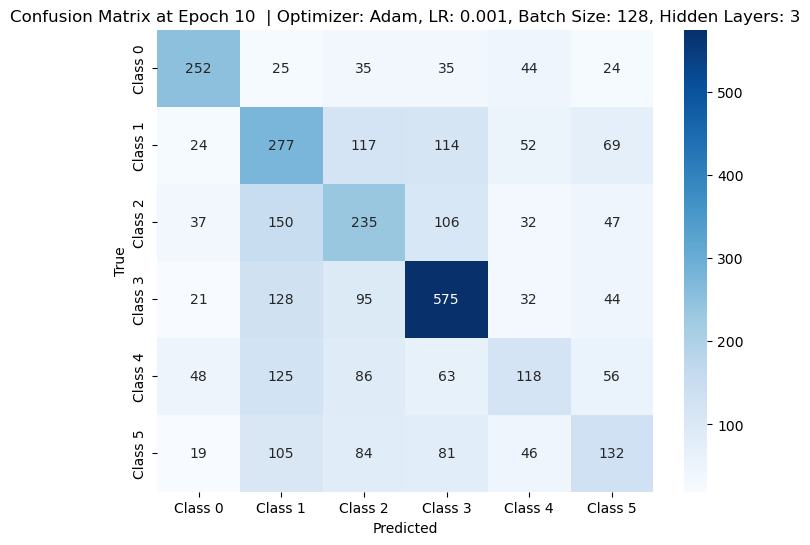

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Hidden Layers: 3


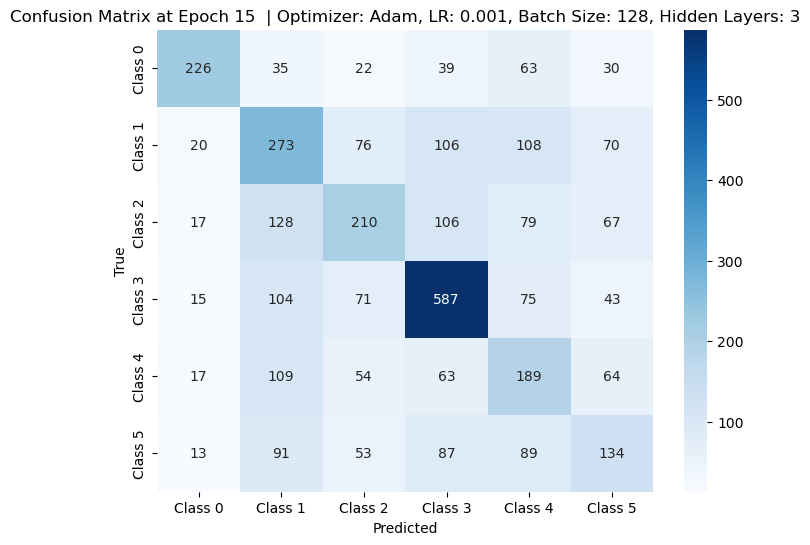

In [5]:
# Load the results from the JSON file
with open("./New Folder/mlp_results.json", "r") as f:
    results = json.load(f)

# Function to plot accuracy and loss curves
def plot_training_history(history, title_suffix=""):
    epochs = range(1, len(history["train_loss"]) + 1)

    # Plot loss
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_loss"], label="Training Loss", marker='o')
    plt.plot(epochs, history["val_loss"], label="Validation Loss", marker='o')
    plt.title(f"Loss Curve {title_suffix}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_acc"], label="Training Accuracy", marker='o')
    plt.plot(epochs, history["val_acc"], label="Validation Accuracy", marker='o')
    plt.title(f"Accuracy Curve {title_suffix}")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

# Function to plot confusion matrices
def plot_confusion_matrix(conf_matrix, epoch, title_suffix=""):
    classes = [f"Class {i}" for i in range(len(conf_matrix))]
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
    plt.title(f"Confusion Matrix at Epoch {epoch} {title_suffix}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# Iterate through results and visualize
for result in results:
    title_suffix = (f" | Optimizer: {result['optimizer']}, LR: {result['lr']}, "
                    f"Batch Size: {result['batch_size']}, Hidden Layers: {result['model_config']['num_hidden_layers']}")
    print(f"Visualizing for: {title_suffix}")

    # Plot training and validation curves
    plot_training_history(result["history"], title_suffix)

    # Plot confusion matrices at saved epochs
    for epoch, conf_matrix in result["history"]["confusion_matrices"].items():
        print(f"Confusion Matrix at Epoch {epoch} for {title_suffix}")
        plot_confusion_matrix(np.array(conf_matrix), epoch, title_suffix)

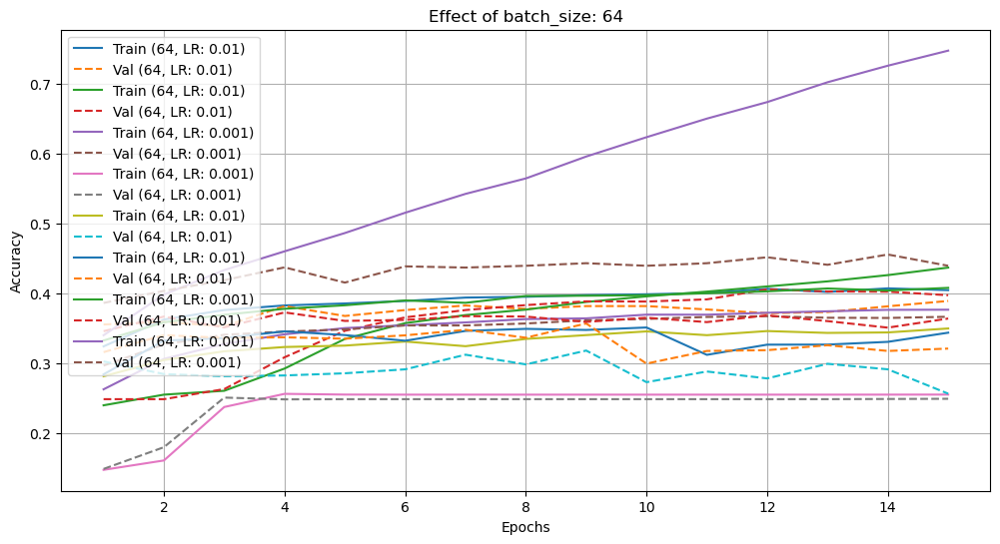

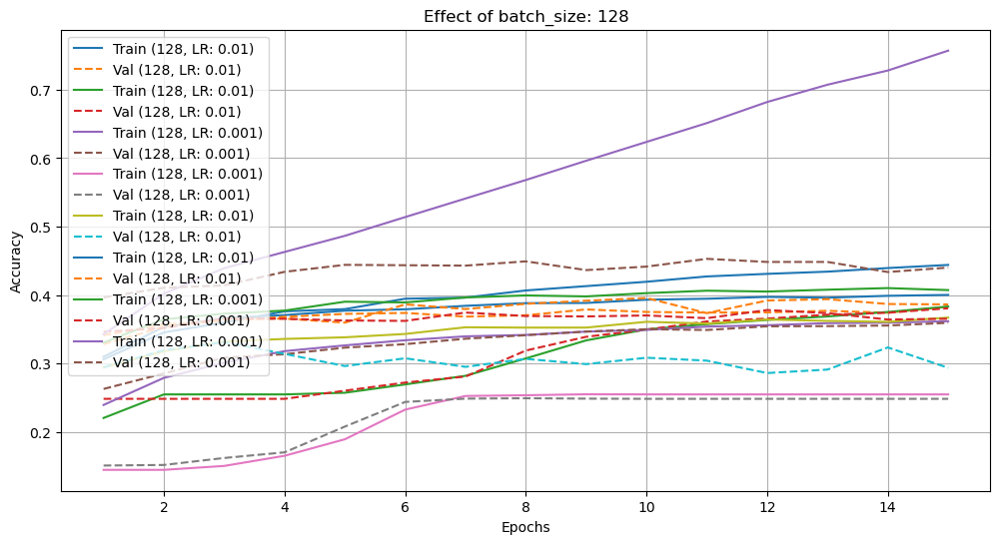

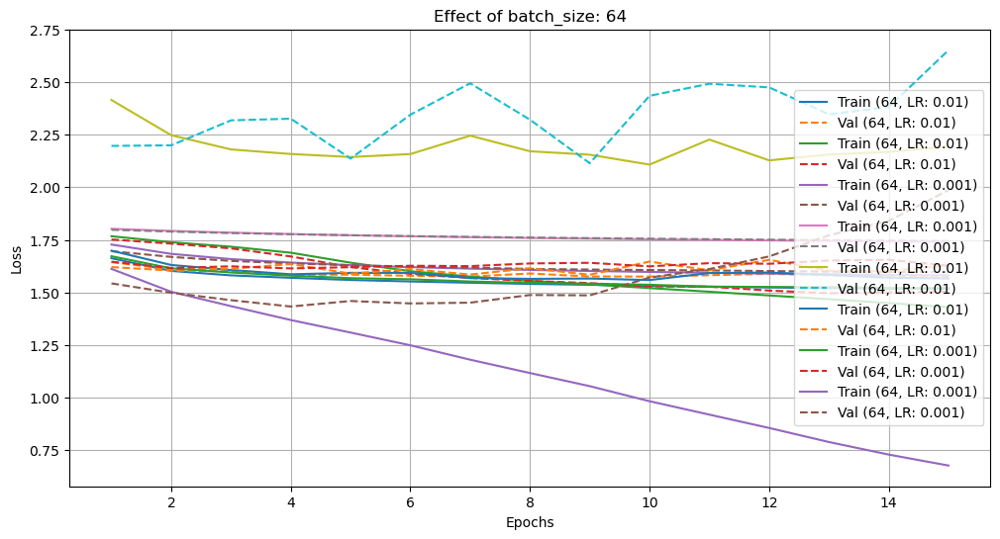

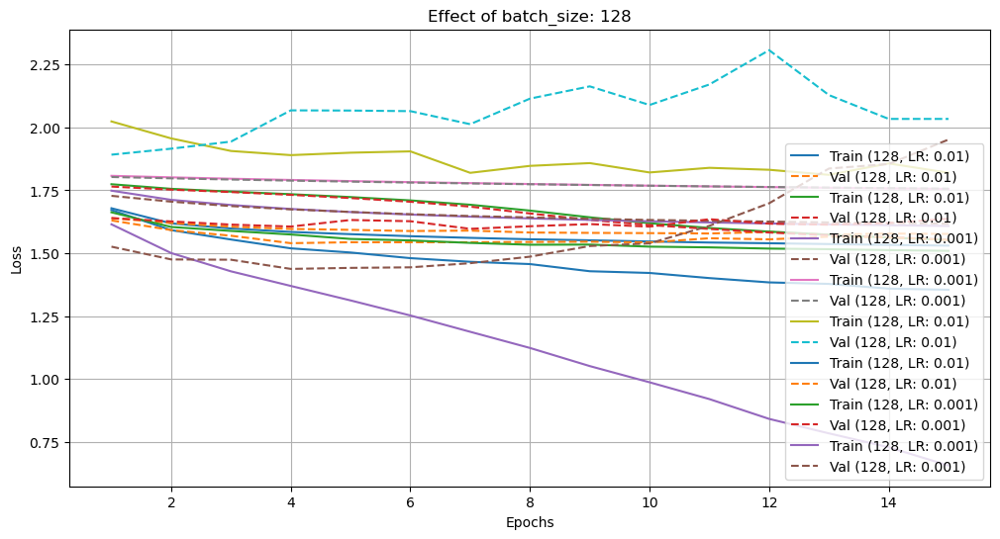

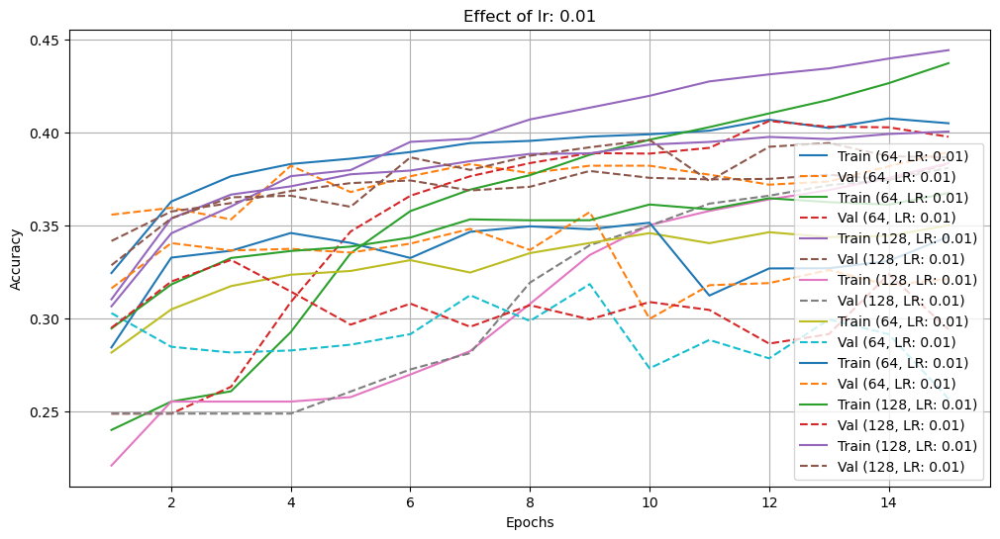

...

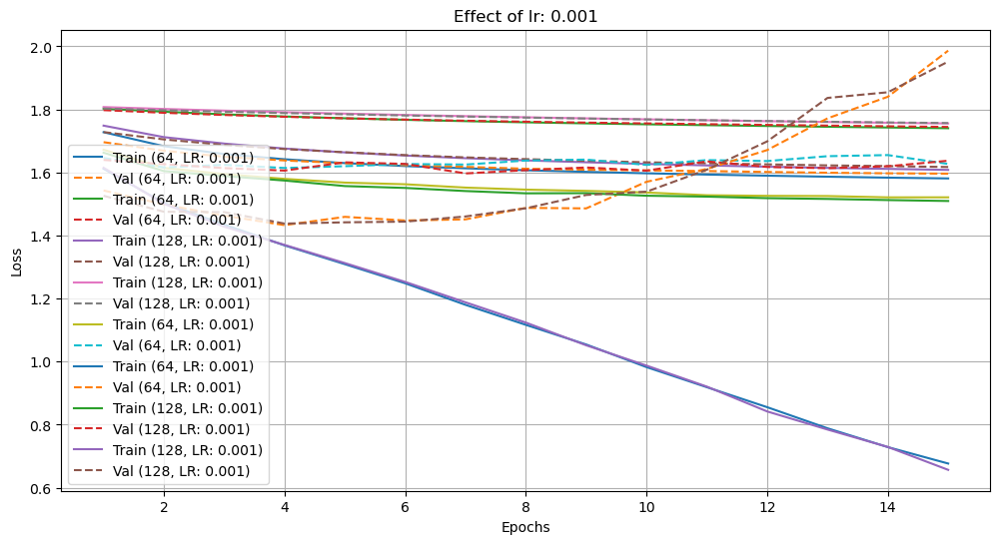

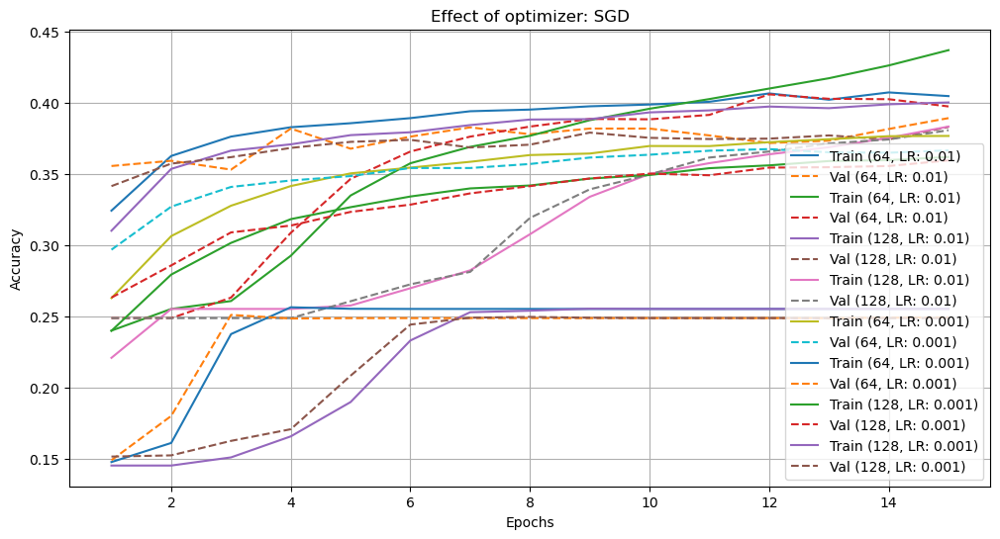

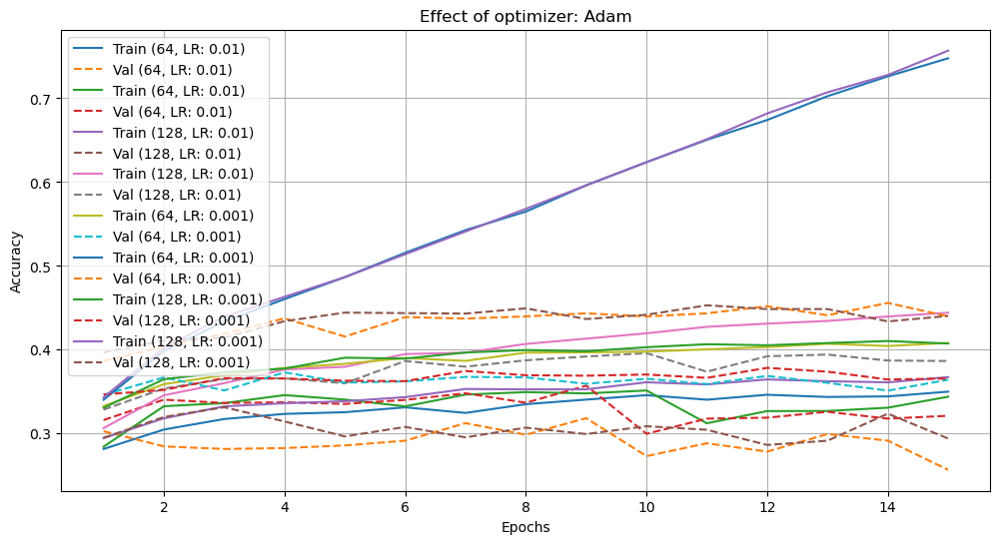

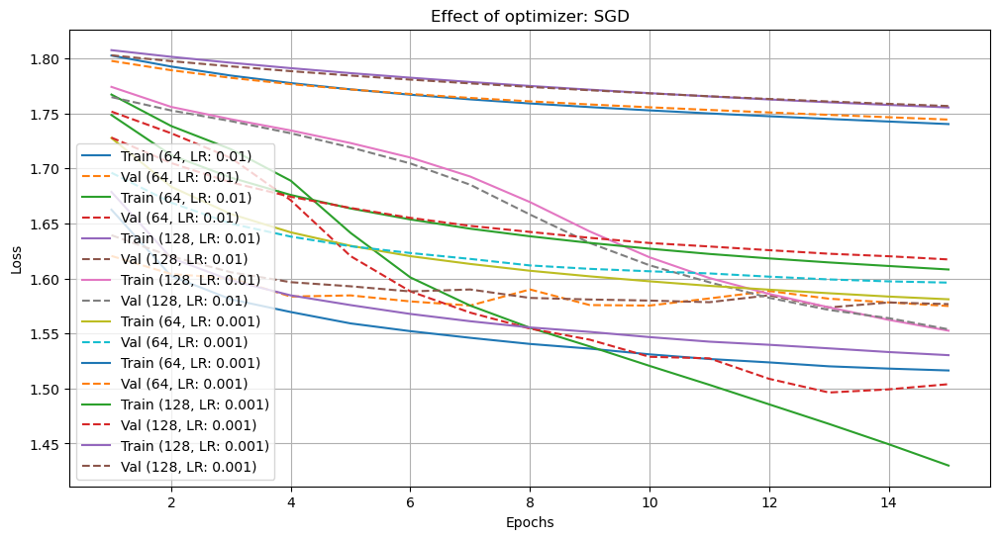

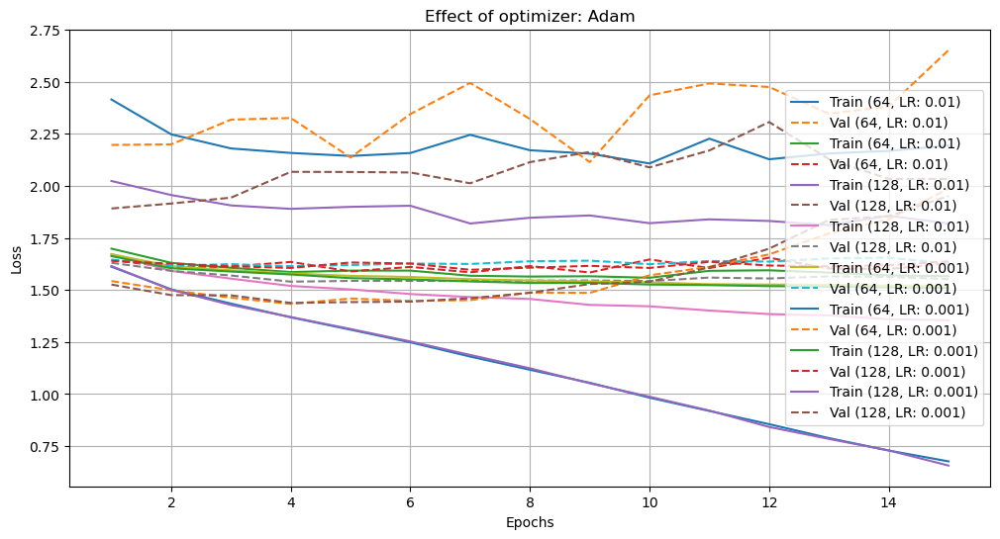

In [6]:
# Function to group results by a specific parameter
def group_by_parameter(results, parameter):
    grouped = {}
    for result in results:
        key = result.get(parameter, "N/A")  # Use "N/A" if the parameter is missing
        grouped[key] = grouped.get(key, []) + [result]
    return grouped

# Function to compare training/validation progress
def compare_learning_curves(grouped_results, parameter_name, metric="accuracy"):
    for group, scenarios in grouped_results.items():
        plt.figure(figsize=(12, 6))
        for scenario in scenarios:
            history = scenario["history"]
            epochs = range(1, len(history["train_loss"]) + 1)

            # Determine which metric to plot
            if metric == "accuracy":
                train_metric = history["train_acc"]
                val_metric = history["val_acc"]
                ylabel = "Accuracy"
            elif metric == "loss":
                train_metric = history["train_loss"]
                val_metric = history["val_loss"]
                ylabel = "Loss"
            else:
                raise ValueError("Metric must be 'accuracy' or 'loss'.")

            # Plot training and validation curves
            plt.plot(epochs, train_metric, label=f"Train ({scenario.get('batch_size', 'N/A')}, LR: {scenario.get('lr', 'N/A')})")
            plt.plot(epochs, val_metric, linestyle="--", label=f"Val ({scenario.get('batch_size', 'N/A')}, LR: {scenario.get('lr', 'N/A')})")

        plt.title(f"Effect of {parameter_name}: {group}")
        plt.xlabel("Epochs")
        plt.ylabel(ylabel)
        plt.legend()
        plt.grid()
        plt.show()

# Analyze the effect of parameters
parameters = ["batch_size", "lr", "optimizer"]
for param in parameters:
    grouped_results = group_by_parameter(results, param)
    compare_learning_curves(grouped_results, param, metric="accuracy")
    compare_learning_curves(grouped_results, param, metric="loss")

In [ ]:
# Function to calculate class-wise accuracy
def calculate_class_accuracies(conf_matrix):
    return [row[i] / sum(row) if sum(row) > 0 else 0 for i, row in enumerate(conf_matrix)]

# Summarize performance for each model
performance_data = []
for result in results:
    title_suffix = (f"Optimizer: {result['optimizer']}, LR: {result['lr']}, "
                    f"Batch Size: {result['batch_size']}, Hidden Layers: {result['model_config']['num_hidden_layers']}")
    last_epoch = max(map(int, result["history"]["confusion_matrices"].keys()))
    conf_matrix = np.array(result["history"]["confusion_matrices"][str(last_epoch)])
    overall_acc = np.trace(conf_matrix) / np.sum(conf_matrix)
    class_accuracies = calculate_class_accuracies(conf_matrix)
    worst_group_acc = min(class_accuracies)
    performance_data.append({
        "Model Config": title_suffix,
        "Overall Accuracy": overall_acc,
        "Worst Class Accuracy": worst_group_acc,
        "Confusion Matrix": conf_matrix.tolist(),
    })

# Convert to DataFrame
performance_df = pd.DataFrame(performance_data)
performance_df = performance_df.sort_values(by="Overall Accuracy", ascending=False)

# Adjust display settings for Pandas
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', 1000)  # Increase width to avoid line wrapping
pd.set_option('display.max_colwidth', None)  # Show full content of each cell

print(performance_df[["Model Config", "Overall Accuracy","Worst Class Accuracy"]])

                                                     Model Config  Overall Accuracy  Worst Class Accuracy
15  Optimizer: Adam, LR: 0.001, Batch Size: 128, Hidden Layers: 3          0.458251              0.286938
13   Optimizer: Adam, LR: 0.001, Batch Size: 64, Hidden Layers: 3          0.446080              0.320565
1      Optimizer: SGD, LR: 0.01, Batch Size: 64, Hidden Layers: 3          0.406736              0.100642
3     Optimizer: SGD, LR: 0.01, Batch Size: 128, Hidden Layers: 3          0.399377              0.010707
2     Optimizer: SGD, LR: 0.01, Batch Size: 128, Hidden Layers: 0          0.390603              0.131048
0      Optimizer: SGD, LR: 0.01, Batch Size: 64, Hidden Layers: 0          0.384376              0.107066
4     Optimizer: SGD, LR: 0.001, Batch Size: 64, Hidden Layers: 0          0.379847              0.081370
11   Optimizer: Adam, LR: 0.01, Batch Size: 128, Hidden Layers: 3          0.373054              0.119914
6    Optimizer: SGD, LR: 0.001, Batch Size: 12

### Analysis of Parameter Effects
#### 1. **Number of Hidden Layers**
   - **General Impact**: Hidden layers are the core of an MLP's expressive power. They enable the network to capture complex, non-linear patterns in the data, which a model without hidden layers cannot achieve. However, adding hidden layers also increases the risk of overfitting and computational cost.
   - **Results Justification**: 
     - The model with three hidden layers outperformed the one without hidden layers in terms of overall accuracy, indicating that deeper architectures are better suited for capturing the underlying patterns of the dataset.
     - However, for some configurations, the worst-class accuracy did not improve as significantly, suggesting that the network may still struggle with minority or difficult classes despite increased depth.

#### 2. **Optimizer**
   - **General Impact**: The choice of optimizer affects how efficiently and effectively the model converges. 
     - **SGD** (Stochastic Gradient Descent) is simpler and often requires carefully tuned learning rates. It converges slower but can generalize better under certain conditions.
     - **Adam** combines adaptive learning rates with momentum, often leading to faster convergence and better results on complex datasets.
   - **Results Justification**:
     - Across most configurations, Adam outperformed SGD in terms of both overall and worst-class accuracy. This can be attributed to its ability to dynamically adjust learning rates, making it more robust in training deep networks with varied gradients.

#### 3. **Learning Rate**
   - **General Impact**: The learning rate determines the step size during gradient descent.
     - A high learning rate (e.g., 0.01) facilitates faster convergence but risks overshooting the optimal solution, leading to instability.
     - A low learning rate (e.g., 0.001) provides more stability and finer convergence but requires longer training times.
   - **Results Justification**:
     - Models trained with a learning rate of 0.001 consistently showed higher overall and worst-class accuracy compared to those trained with 0.01. This suggests that the higher learning rate may have caused instability during training, preventing the network from reaching the optimal solution.

#### 4. **Batch Size**
   - **General Impact**: The batch size controls the number of samples used to compute the gradient for each optimization step.
     - Smaller batch sizes (e.g., 64) provide more frequent updates, introducing noise that can improve generalization but may slow down convergence.
     - Larger batch sizes (e.g., 128) result in smoother gradients, which can speed up convergence but may lead to poorer generalization.
   - **Results Justification**:
     - Batch size 64 often performed better than 128, particularly in worst-class accuracy, which suggests that the noise introduced by smaller batches helped the model generalize better to harder classes.

---

### Summary

This experiment highlights the sensitivity of MLP performance to architectural and training choices. Increasing the number of hidden layers significantly enhances the model's capacity to capture complex data patterns, though care must be taken to prevent overfitting. The Adam optimizer consistently outperforms SGD, making it a preferred choice for training deep MLPs, especially with challenging datasets. Learning rates and batch sizes exhibit a trade-off between stability, convergence speed, and generalization.

These findings underline the importance of carefully selecting hyperparameters to optimize MLP performance for specific tasks, particularly when targeting improvements in minority-class accuracy or addressing challenging datasets.

## part B

### Libraries

In [ ]:
import os
import zipfile
from PIL import Image, ImageDraw
import random
from sklearn.model_selection import train_test_split
import cv2
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from tqdm import tqdm
import json

### Creating dataLoader

In [ ]:
image_size = (48, 48)

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths  # List of image file paths
        self.labels = labels  # List of labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]

        # Open image from path
        image = Image.open(img_path).convert("L")  # Convert to grayscale (1 channel)

        if self.transform:
            image = self.transform(image)

        # Do NOT flatten the image; keep as [1, H, W] for CNNs
        label_tensor = torch.tensor(label, dtype=torch.long)  # Use dtype=torch.long for classification tasks

        return image, label_tensor

# Updated function for CNN-compatible dataloaders
def prepare_dataloaders(train_data, val_data, test_data, batch_size=32):
    # Define a transform to normalize images to a standard size and tensor
    transform = transforms.Compose([
        transforms.Resize(image_size),  # Resize image to a fixed size (H, W)
        transforms.ToTensor(),          # Convert to tensor with shape [1, H, W]
        transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize grayscale
    ])

    # Create custom datasets for train, validation, and test
    train_dataset = CustomDataset(train_data['image_path'].tolist(), train_data['label'].tolist(), transform=transform)
    val_dataset = CustomDataset(val_data['image_path'].tolist(), val_data['label'].tolist(), transform=transform)
    test_dataset = CustomDataset(test_data['image_path'].tolist(), test_data['label'].tolist(), transform=transform)

    # Create dataloaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader

### Model

#### Introduction and Overview of the CNN Model

Convolutional Neural Networks (CNNs) are a class of deep learning architectures particularly effective for image processing tasks due to their ability to automatically learn spatial hierarchies of features. In this study, we designed a CNN with dynamically configurable convolutional and fully connected layers to explore how hyperparameter and architectural choices influence classification performance.

The experiment included two convolutional configurations with varying numbers of layers and pooling operations and one fully connected configuration with two dense layers. We evaluated these setups using multiple optimizers (SGD and Adam), learning rates (0.01 and 0.001), and batch sizes (64 and 128). Performance metrics included overall accuracy, macro F1-score, macro recall, and worst-class accuracy, emphasizing the model's ability to generalize to harder classes.


In [ ]:
# Function to create CNN model dynamically
class CustomCNN(nn.Module):
    def __init__(self, input_shape, num_classes, conv_config, fc_config, dropout_rates=None):
        super(CustomCNN, self).__init__()

        layers = []
        in_channels = 1  # Grayscale image has 1 channel
        H, W = input_shape

        # Add convolutional layers
        for i, out_channels in enumerate(conv_config["conv_channels"]):
            layers.append(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1))
            layers.append(nn.ReLU())
            if conv_config["pooling_layers"][i]:
                layers.append(nn.MaxPool2d(kernel_size=2, stride=2))
                H, W = H // 2, W // 2  # Adjust dimensions after pooling
            in_channels = out_channels

        self.conv = nn.Sequential(*layers)

        # Calculate the flattened size after convolution layers
        flattened_size = in_channels * H * W

        # Add fully connected layers
        fc_layers = []
        in_features = flattened_size
        for i, out_features in enumerate(fc_config["fc_widths"]):
            fc_layers.append(nn.Linear(in_features, out_features))
            fc_layers.append(nn.ReLU())
            if dropout_rates and i < len(dropout_rates):
                fc_layers.append(nn.Dropout(dropout_rates[i]))
            in_features = out_features

        fc_layers.append(nn.Linear(in_features, num_classes))  # Output layer
        self.fc = nn.Sequential(*fc_layers)

        # Add softmax as a separate module for interpretability
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.conv(x)
        x = x.view(x.size(0), -1)  # Flatten for fully connected layers
        x = self.fc(x)
        x = self.softmax(x)  # Apply softmax to output layer
        return x

### Training

In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs, device, test_loader=None):
    model.to(device)
    history = {
        "train_loss": [],
        "val_loss": [],
        "train_acc": [],
        "val_acc": [],
        "confusion_matrices": {},
    }

    for epoch in range(1, epochs + 1):
        print(f"Epoch {epoch}/{epochs}")

        # Training phase
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        train_loader_tqdm = tqdm(train_loader, desc="Training", leave=False)
        for inputs, labels in train_loader_tqdm:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

            # Update tqdm bar description
            train_loader_tqdm.set_postfix(loss=loss.item())

        train_loss = running_loss / total
        train_acc = correct / total

        # Validation phase
        model.eval()
        running_loss, correct, total = 0.0, 0, 0
        val_loader_tqdm = tqdm(val_loader, desc="Validation", leave=False)
        with torch.no_grad():
            for inputs, labels in val_loader_tqdm:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                running_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs, 1)
                correct += (predicted == labels).sum().item()
                total += labels.size(0)

                # Update tqdm bar description
                val_loader_tqdm.set_postfix(loss=loss.item())

        val_loss = running_loss / total
        val_acc = correct / total

        # Log metrics
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_acc"].append(train_acc)
        history["val_acc"].append(val_acc)

        # Save confusion matrix every 5 epochs
        if epoch % 5 == 0 and test_loader:
            y_true, y_pred = [], []
            with torch.no_grad():
                for inputs, labels in test_loader:
                    inputs, labels = inputs.to(device), labels.to(device)
                    outputs = model(inputs)
                    _, predicted = torch.max(outputs, 1)
                    y_true.extend(labels.cpu().numpy())
                    y_pred.extend(predicted.cpu().numpy())

            cm = confusion_matrix(y_true, y_pred)
            history["confusion_matrices"][epoch] = cm  # Save confusion matrix for this epoch

            print(f"Epoch {epoch}: Confusion Matrix:\n{cm}")

        print(f"Epoch {epoch}/{epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

    return history

In [ ]:
# Define hyperparameters and configurations
batch_sizes = [64, 128]
learning_rates = [0.01, 0.001]
optimizers = [optim.SGD, optim.Adam]
epoch_numbers = 15
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

# Simplified configurations
conv_configs = [
    {"conv_channels": [16, 32, 64], "pooling_layers": [True, True, True]},  # Model 1
    {"conv_channels": [32, 64], "pooling_layers": [True, True]},  # Model 2
]

fc_configs = [
    {"fc_widths": [128, 64]},  # Model 1 fully connected layers
]

# Results storage
results = []

# Loop through hyperparameter combinations
for batch_size in batch_sizes:
    for lr in learning_rates:
        for opt_fn in optimizers:
            for conv_config in conv_configs:
                for fc_config in fc_configs:
                    print(f"Running: Batch Size={batch_size}, LR={lr}, Optimizer={opt_fn.__name__}")

                    # Prepare dataloaders
                    train_loader, val_loader, test_loader = prepare_dataloaders(
                        train_data, val_data, test_data, batch_size=batch_size
                    )

                    # Create model
                    model = CustomCNN(
                        input_shape=image_size,  # Assuming grayscale images of size 48x48
                        num_classes=num_classes,
                        conv_config=conv_config,
                        fc_config=fc_config,
                    )

                    # Optimizer and criterion
                    optimizer = opt_fn(model.parameters(), lr=lr)
                    criterion = nn.CrossEntropyLoss()

                    # Train model
                    history = train_model(
                        model,
                        train_loader,
                        val_loader,
                        criterion,
                        optimizer,
                        epochs=epoch_numbers,  # Training for 15 epochs
                        device=device,
                        test_loader=test_loader
                    )

                    # Save results
                    results.append({
                        "batch_size": batch_size,
                        "lr": lr,
                        "optimizer": opt_fn.__name__,
                        "conv_config": conv_config,
                        "fc_config": fc_config,
                        "history": history,
                    })

In [ ]:
# Define a helper function to make results JSON serializable
def serialize_results(results):
    def serialize_obj(obj):
        if isinstance(obj, np.ndarray):  # Convert numpy arrays to lists
            return obj.tolist()
        elif isinstance(obj, torch.Tensor):  # Convert tensors to lists
            return obj.cpu().tolist()
        elif isinstance(obj, dict):  # Recursively process dictionaries
            return {k: serialize_obj(v) for k, v in obj.items()}
        elif isinstance(obj, list):  # Recursively process lists
            return [serialize_obj(v) for v in obj]
        else:  # Default: Return the object as is
            return obj

    return [serialize_obj(result) for result in results]

# Serialize and save results
serialized_results = serialize_results(results)
with open("cnn_results.json", "w") as f:
    json.dump(serialized_results, f)

### Analysis

In [1]:
import json
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report

Visualizing for:  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


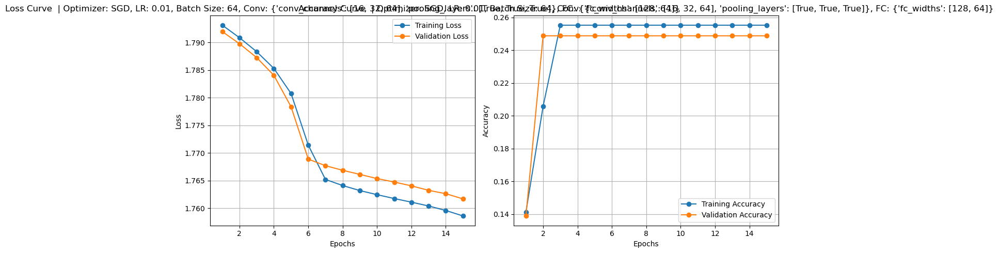

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


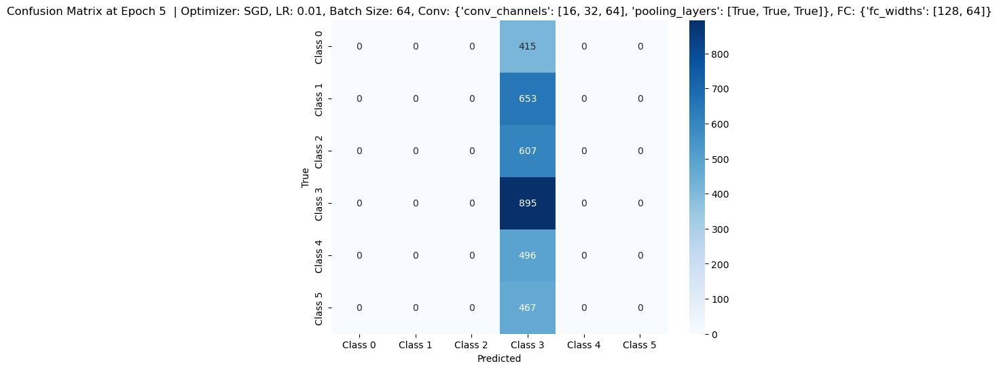

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


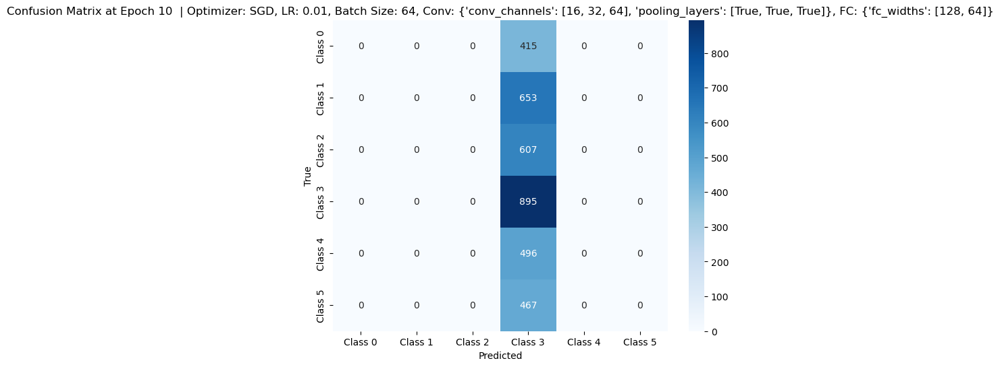

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


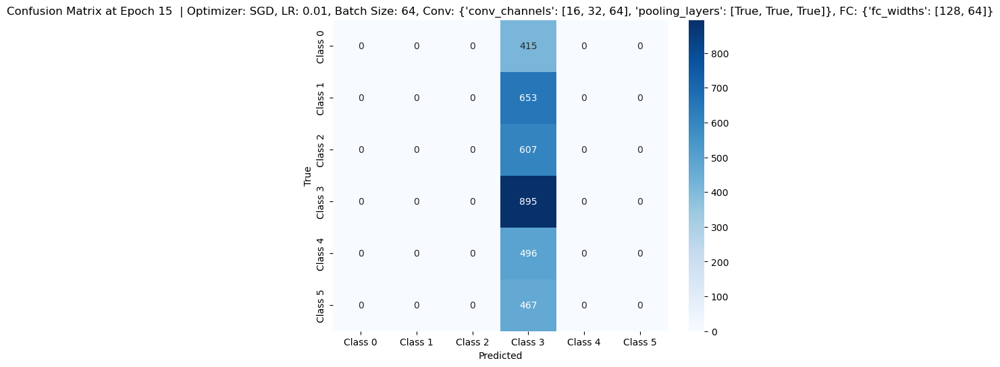

Visualizing for:  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


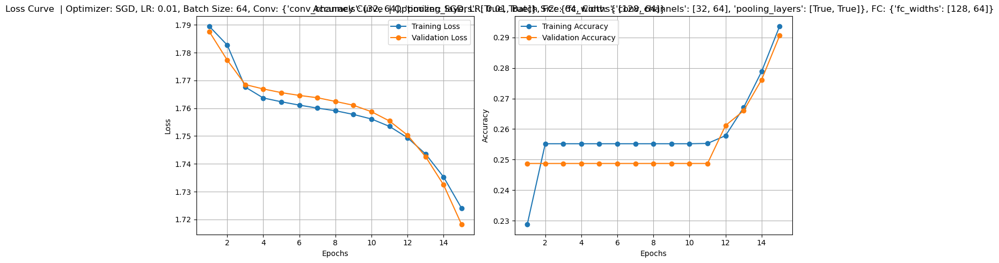

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


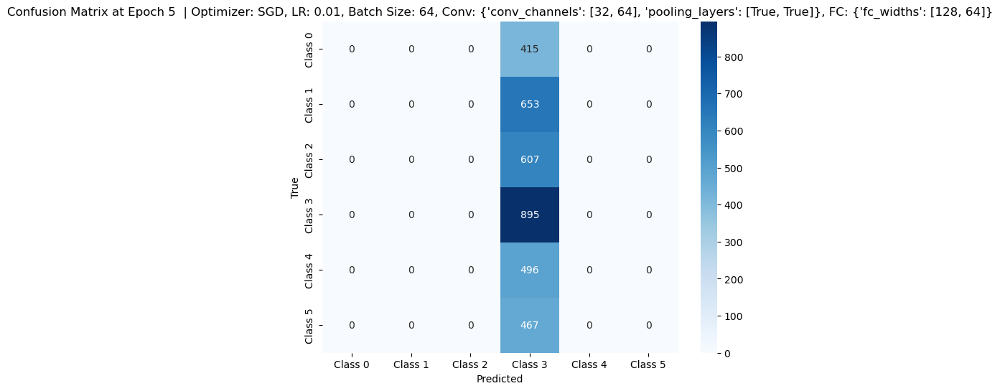

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


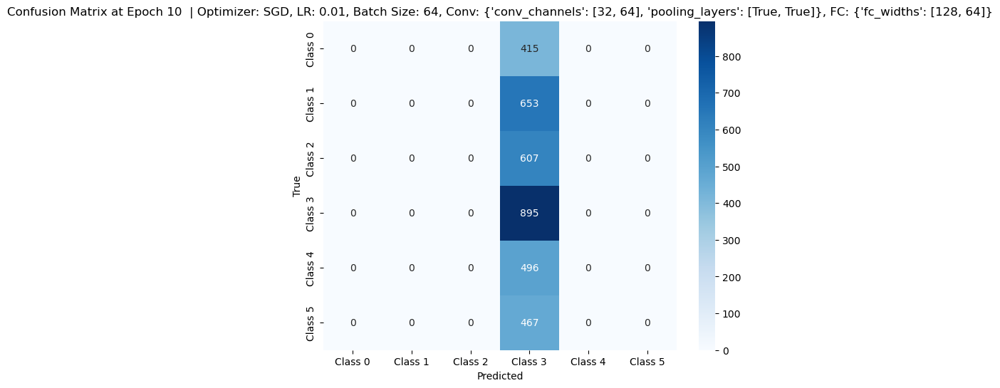

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


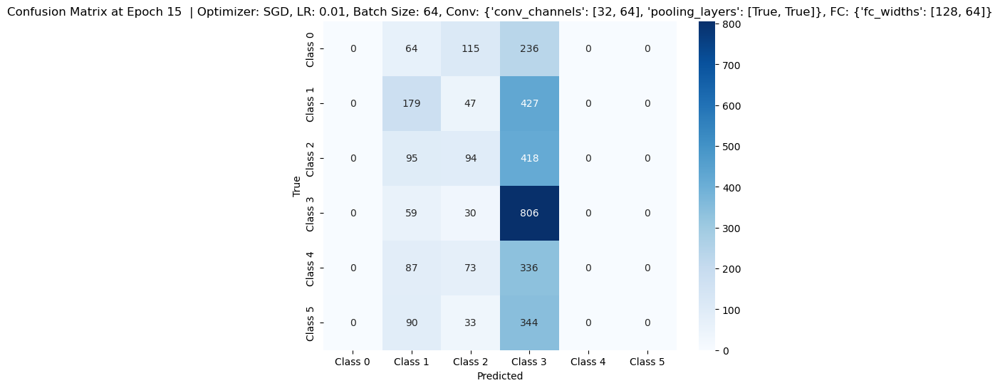

Visualizing for:  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


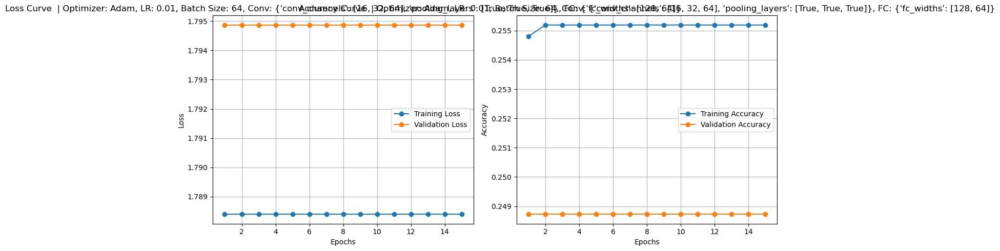

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


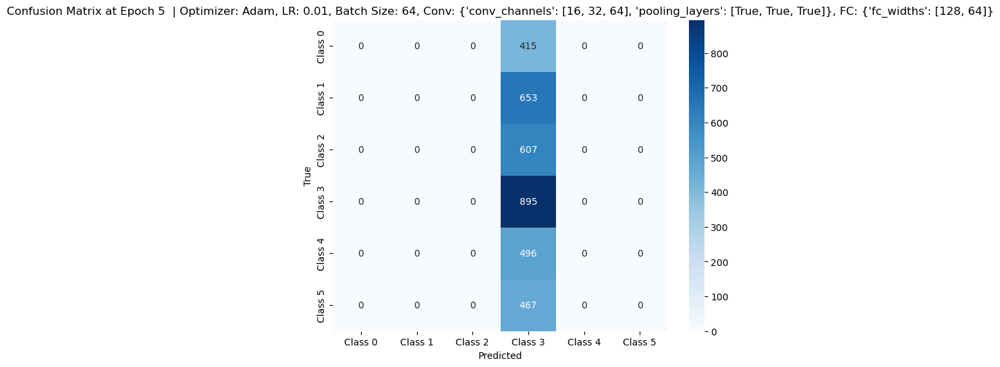

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


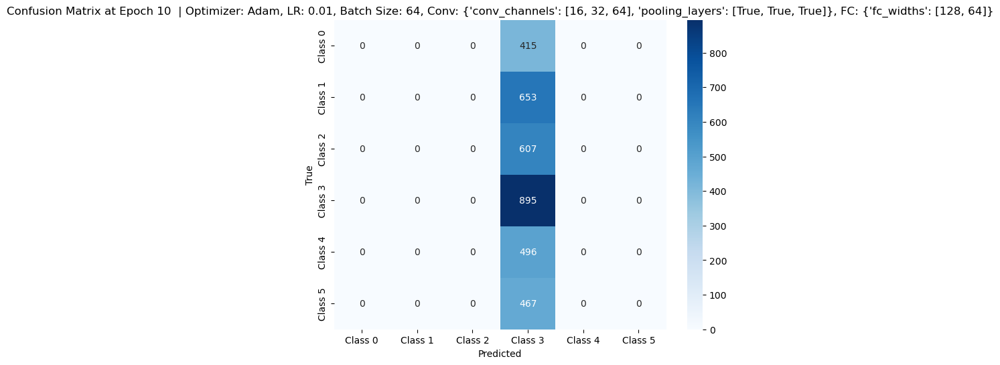

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


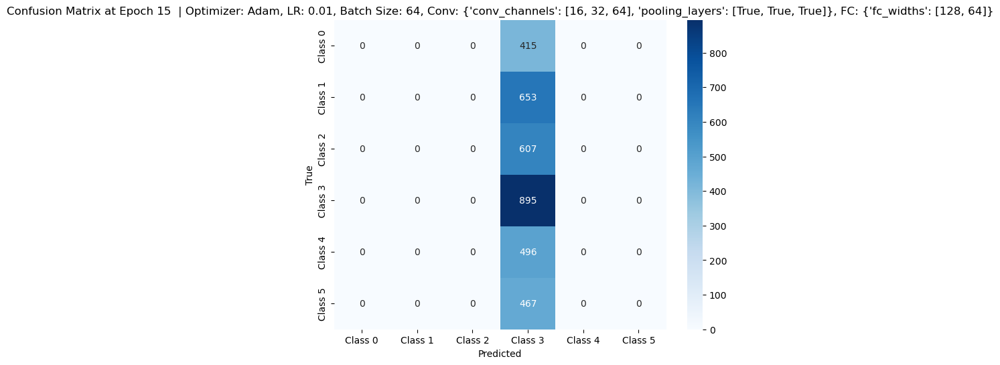

Visualizing for:  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


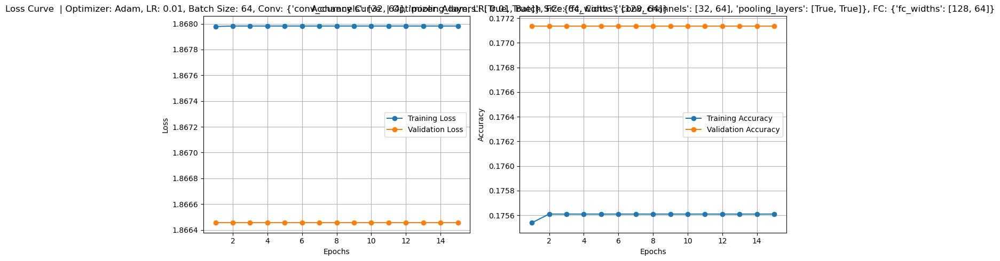

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


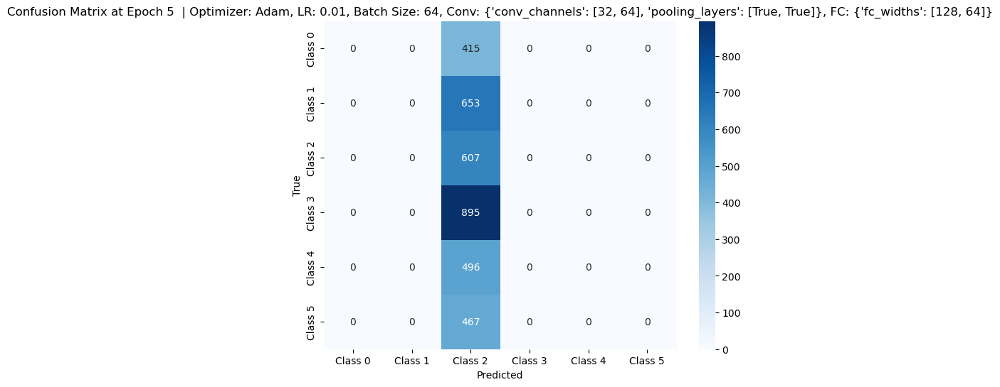

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


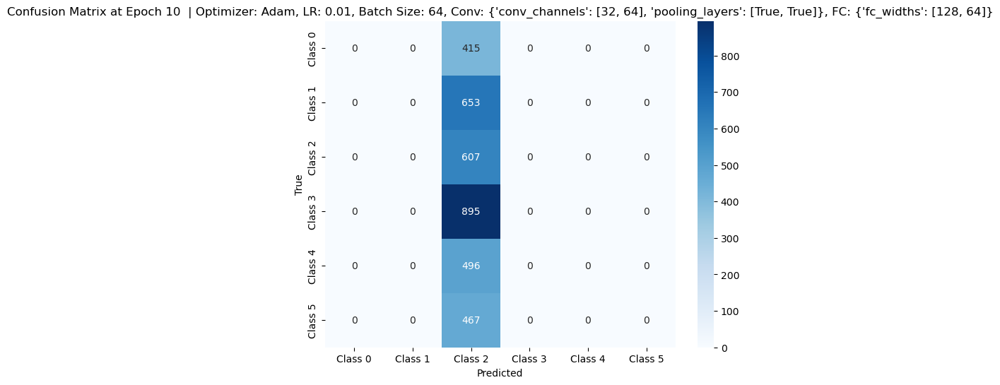

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.01, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


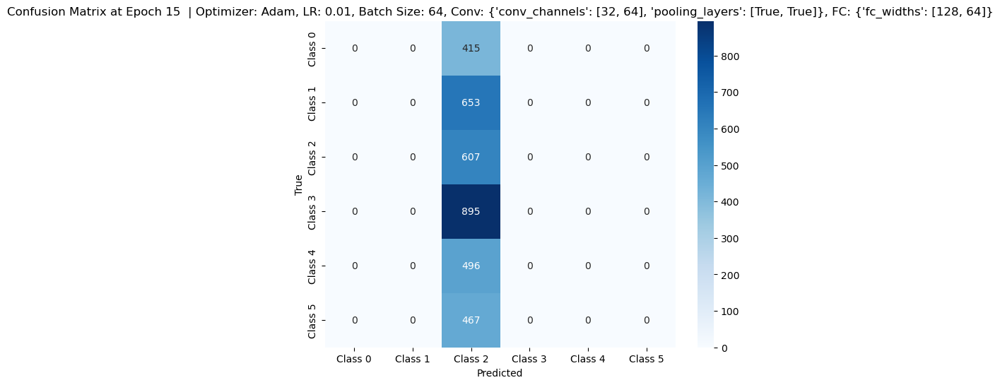

Visualizing for:  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


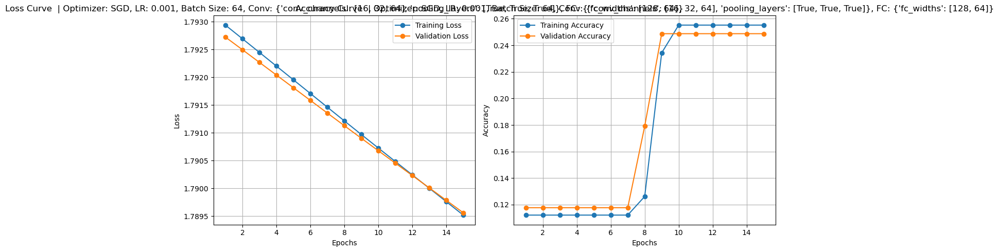

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


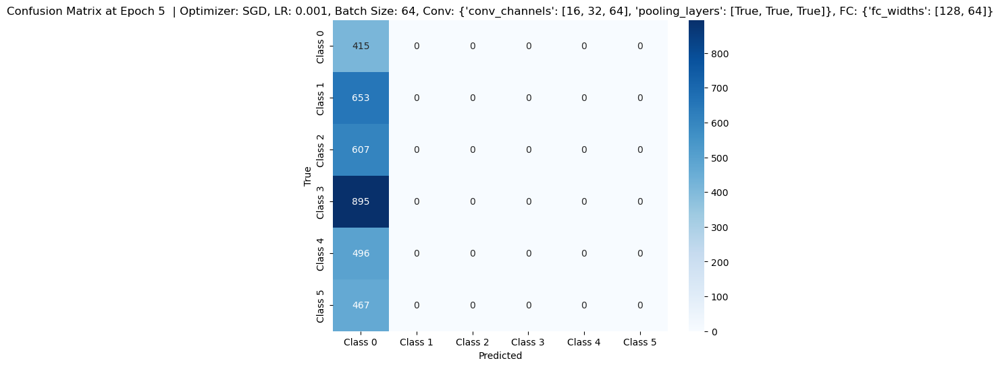

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


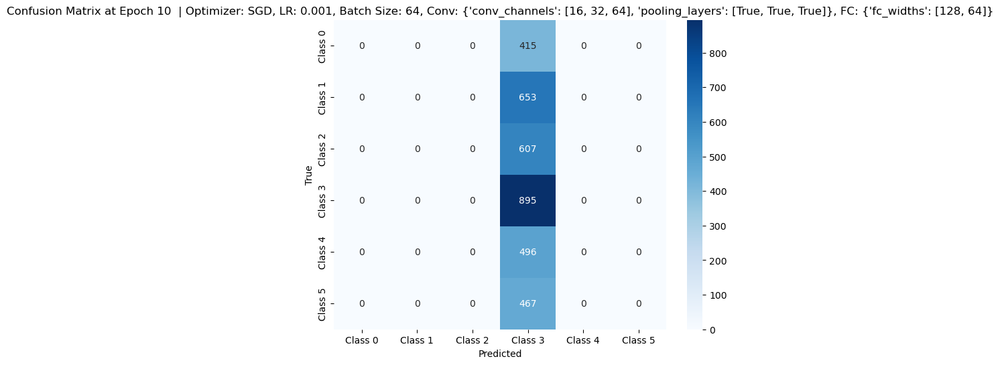

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


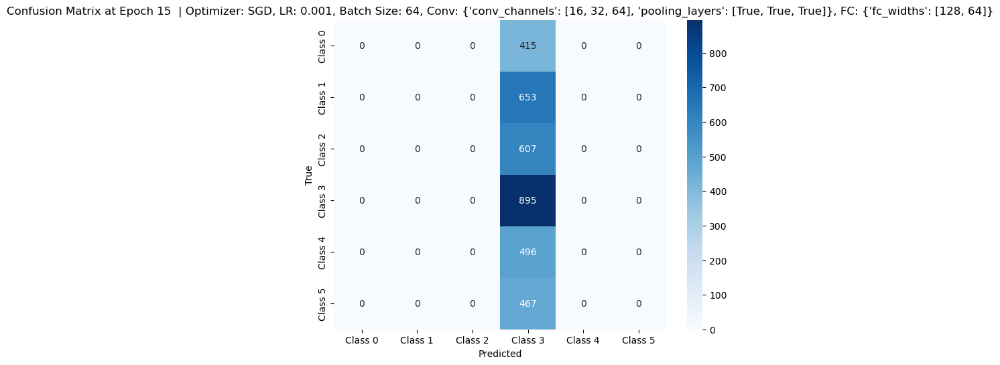

Visualizing for:  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


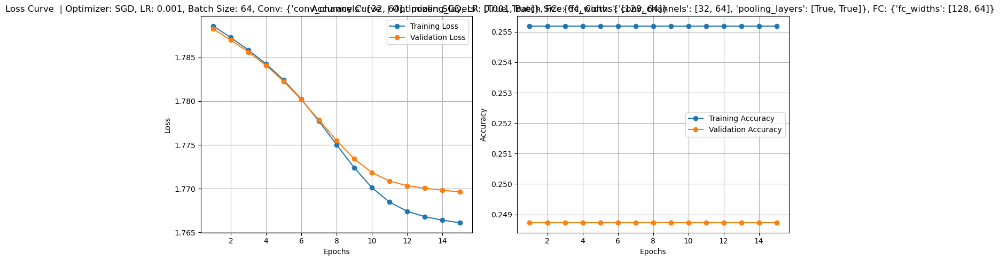

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


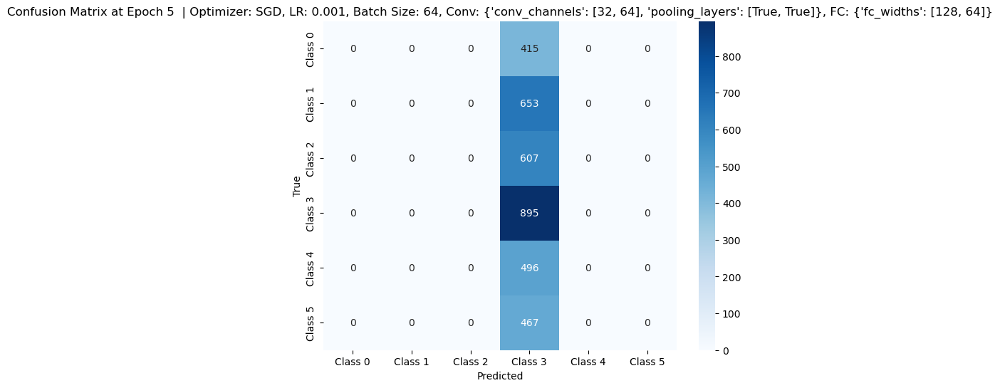

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


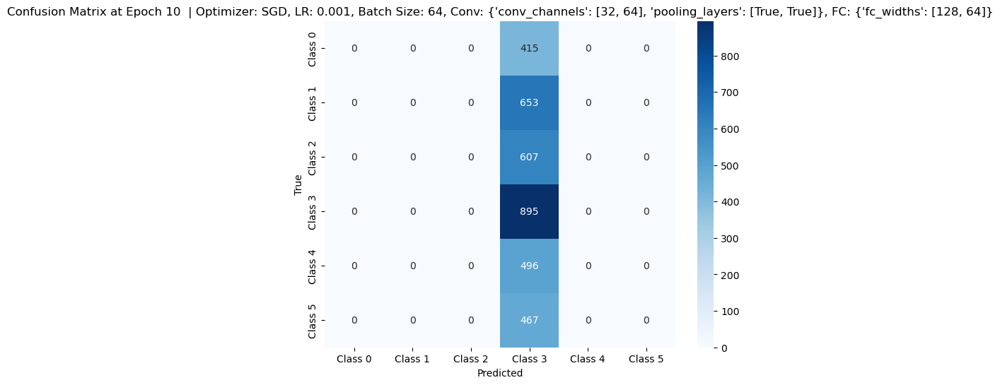

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


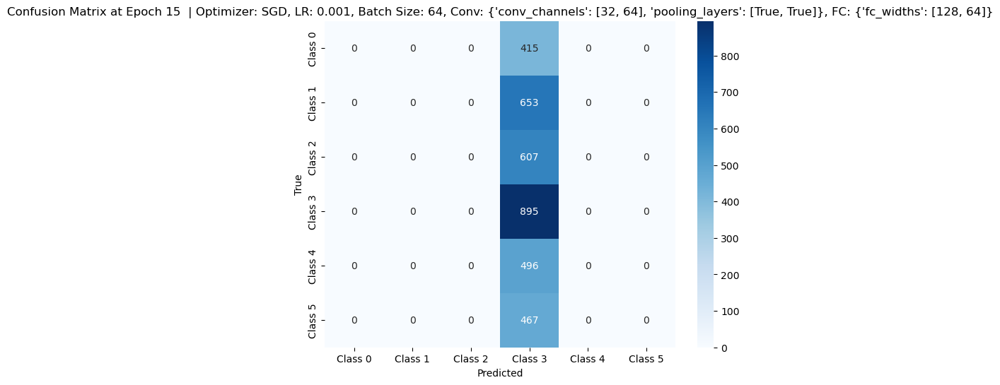

Visualizing for:  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


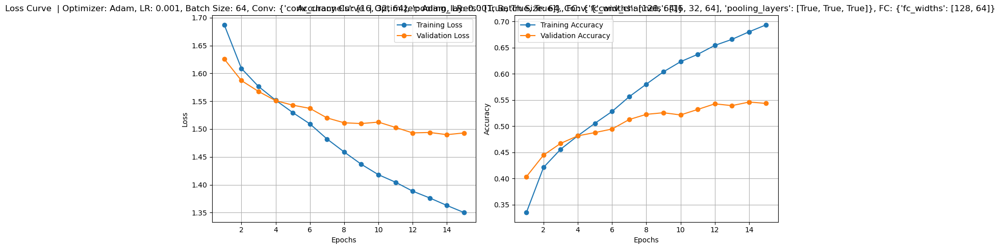

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


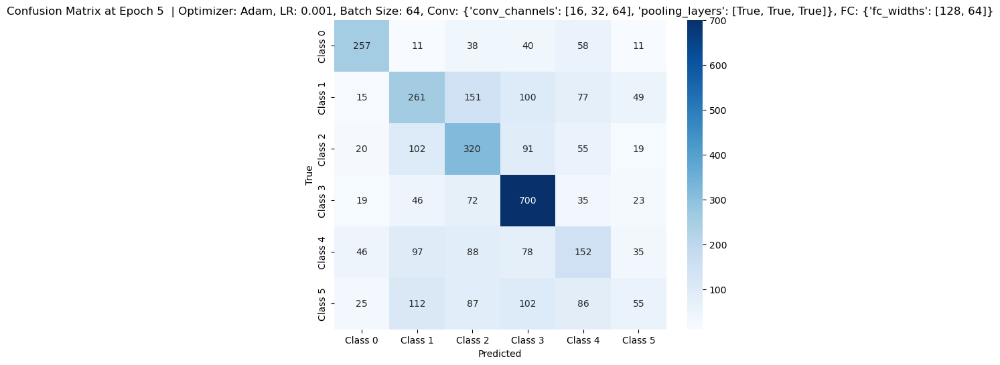

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


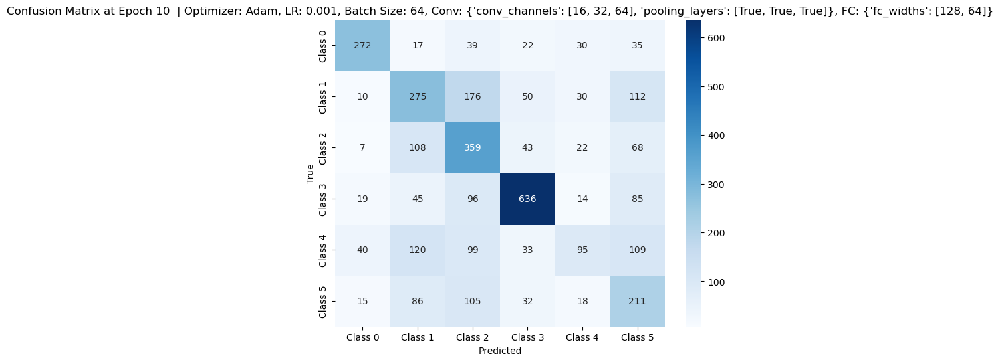

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


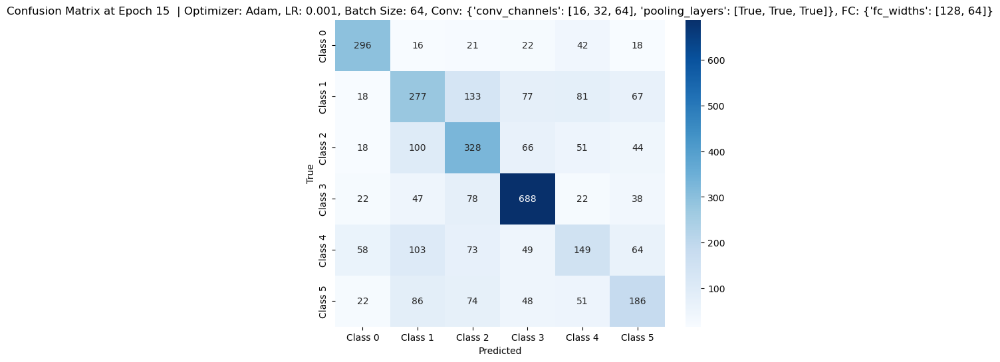

Visualizing for:  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


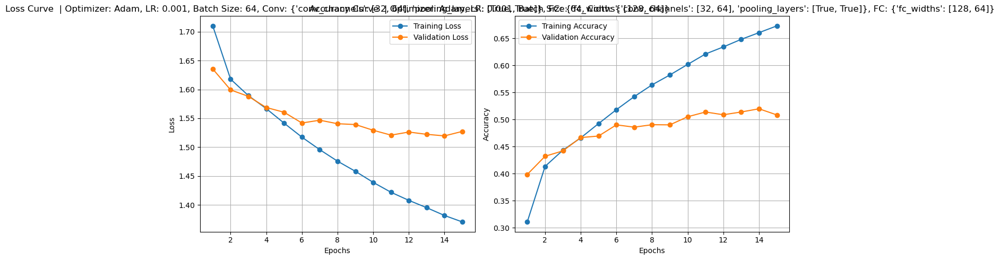

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


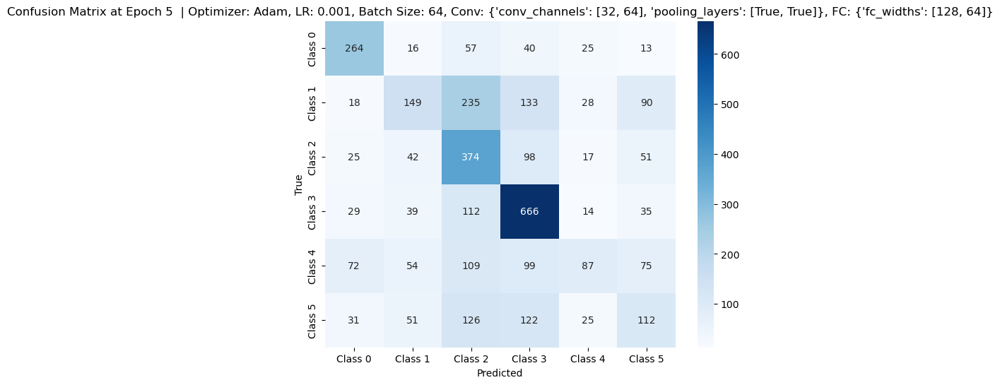

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


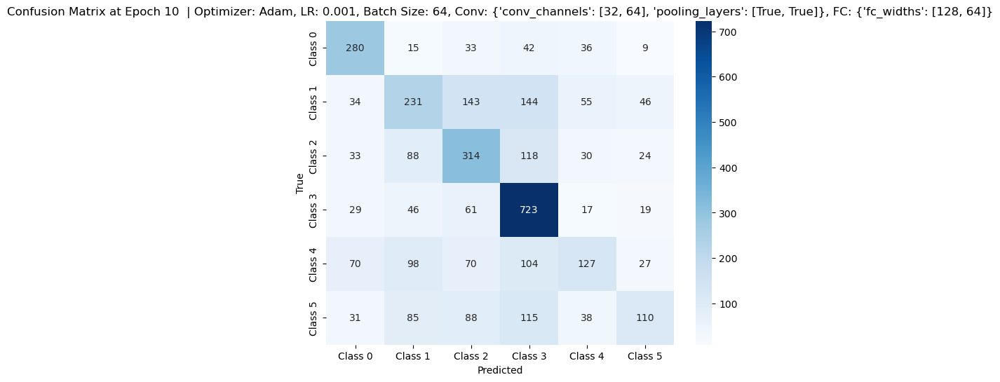

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


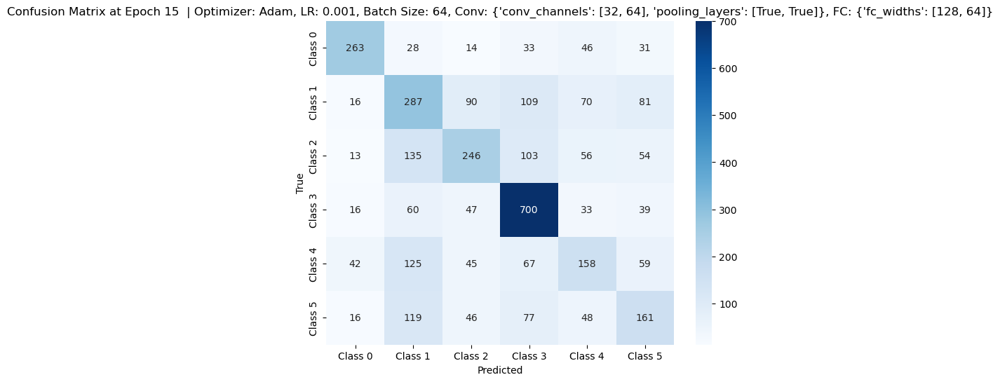

Visualizing for:  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


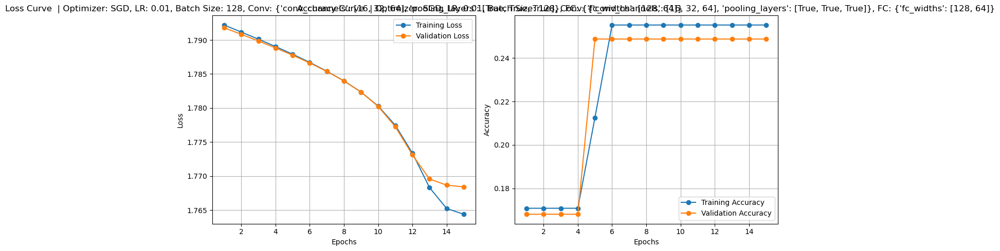

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


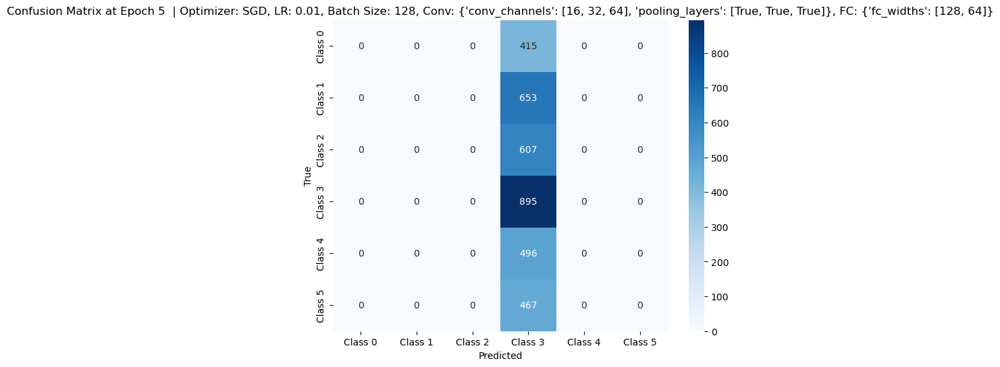

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


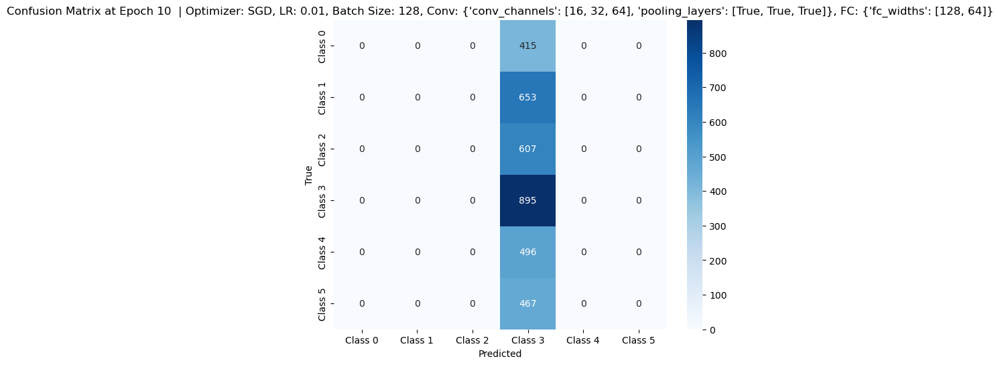

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


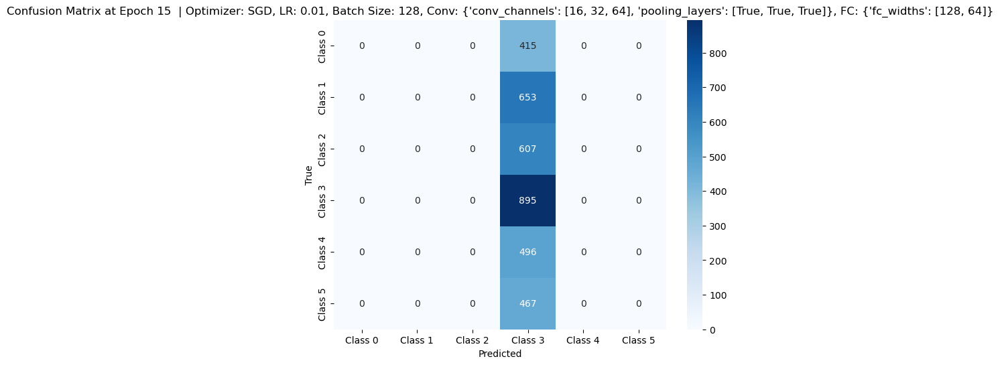

Visualizing for:  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


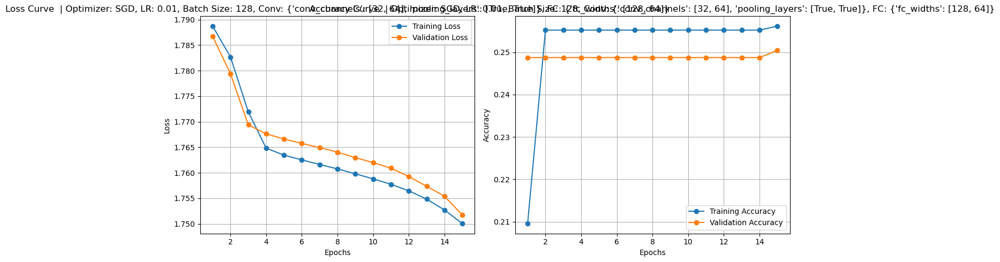

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


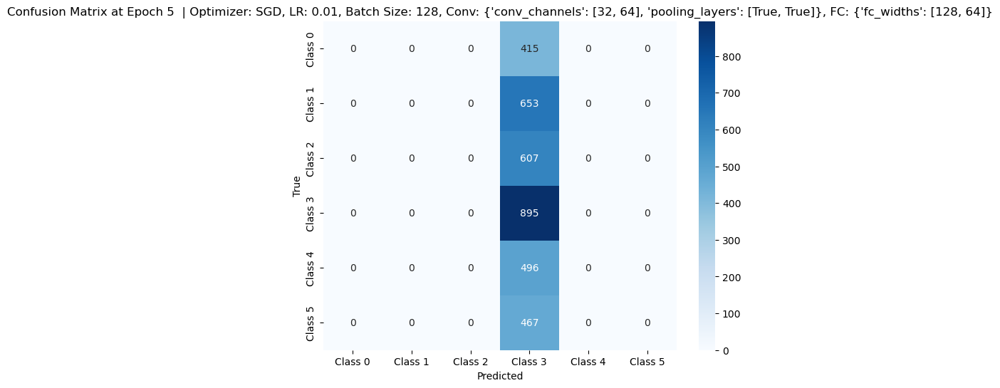

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


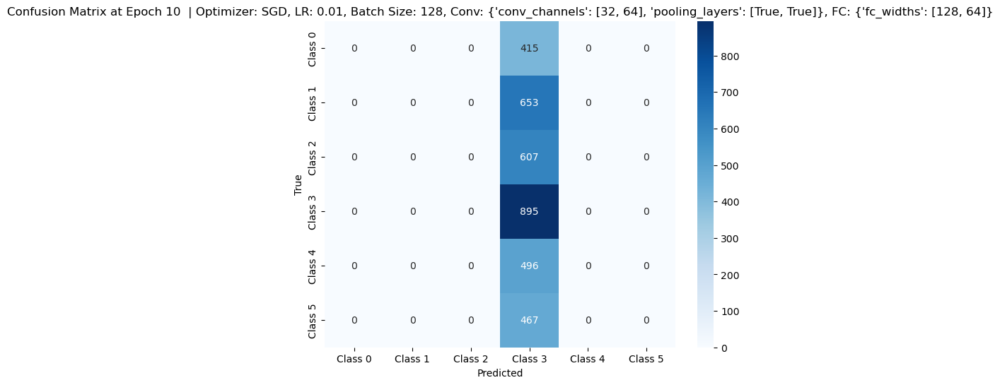

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


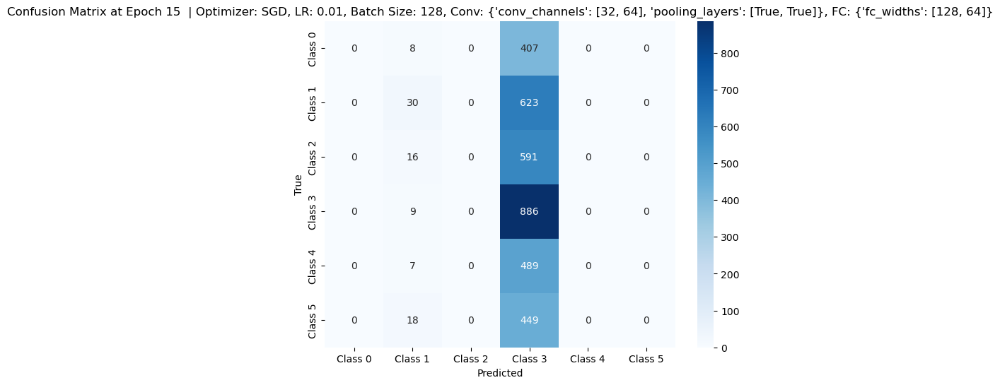

Visualizing for:  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


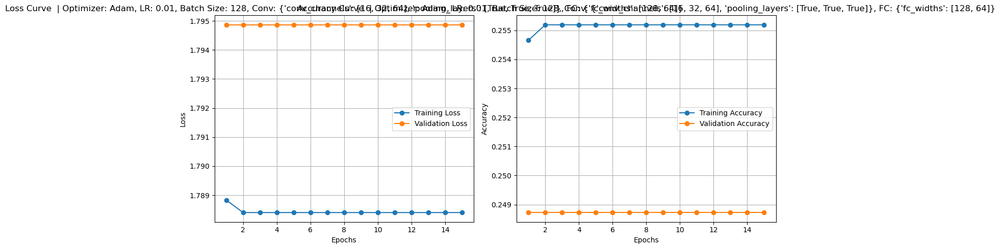

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


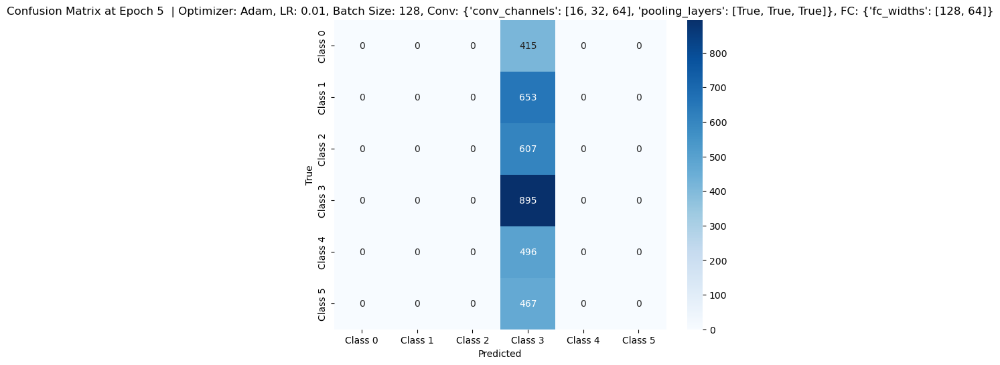

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


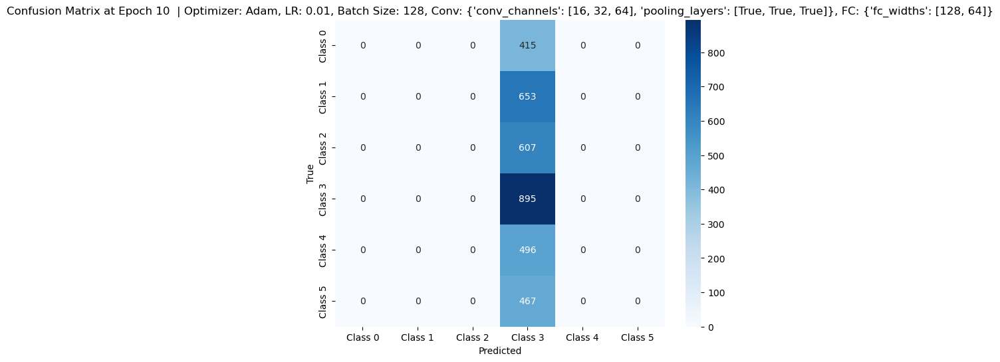

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


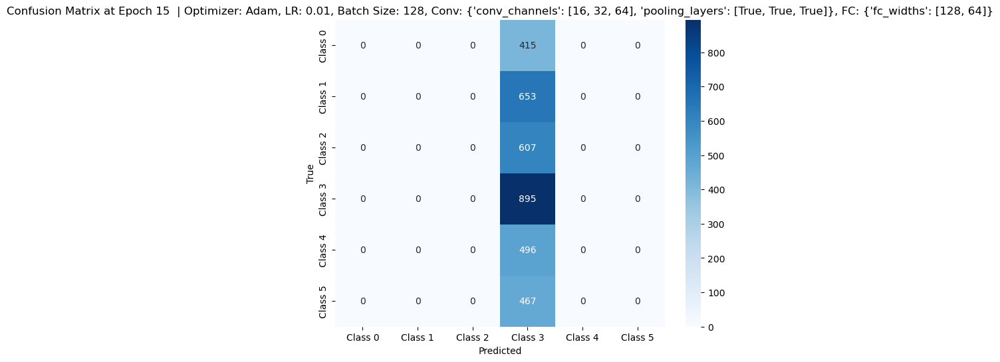

Visualizing for:  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


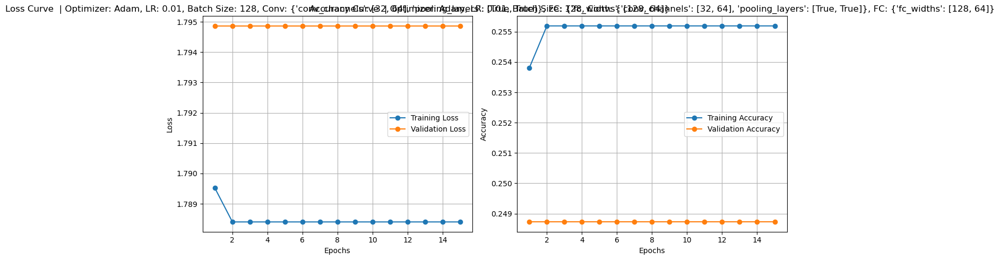

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


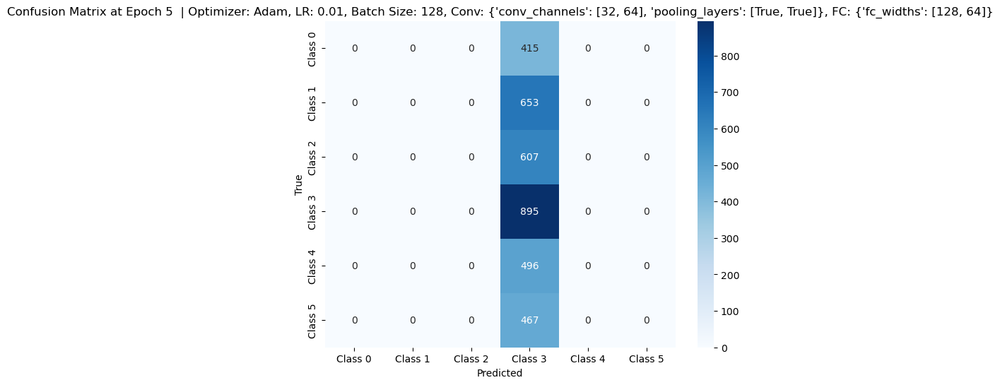

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


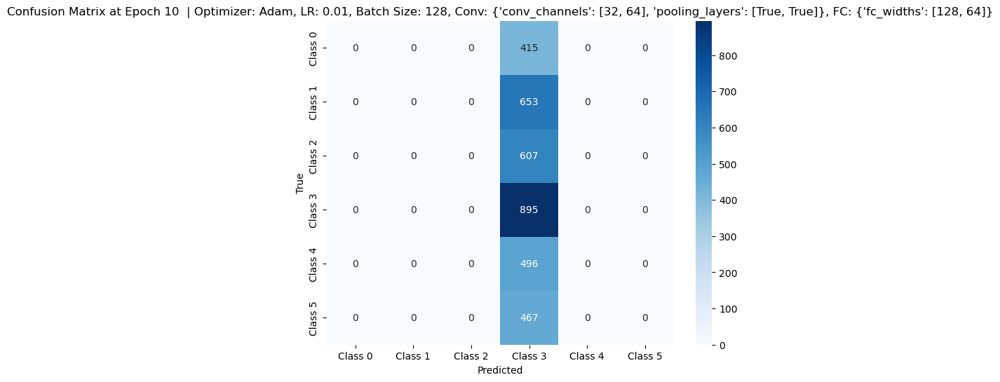

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.01, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


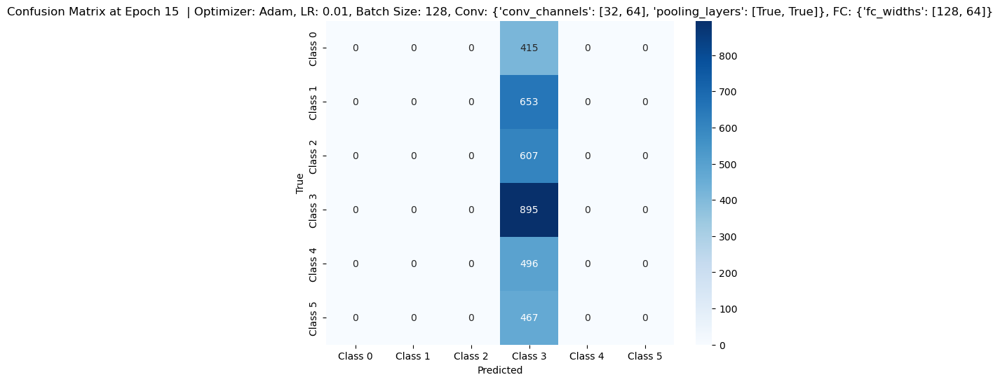

Visualizing for:  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


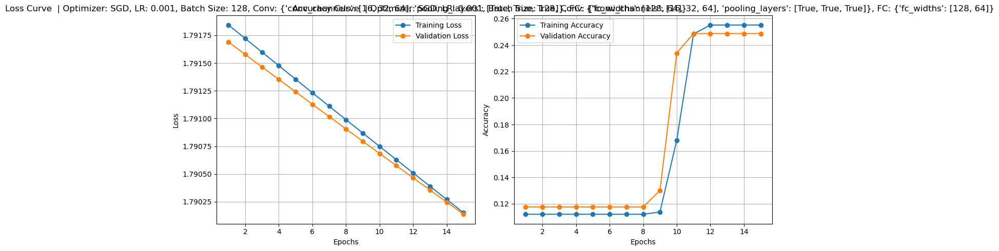

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


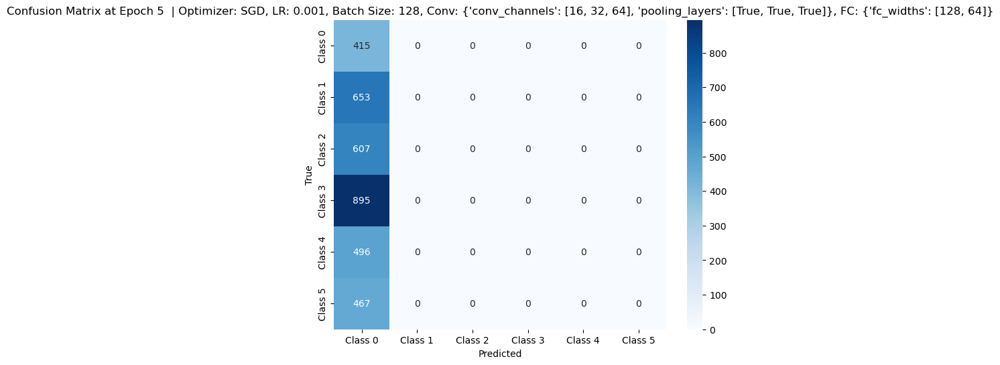

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


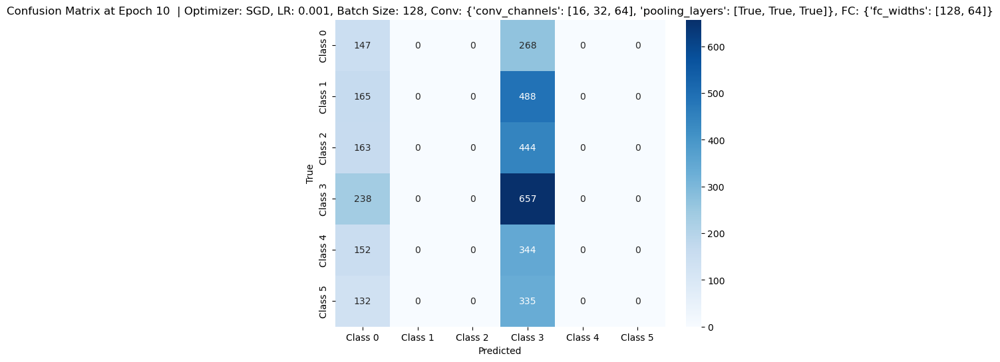

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


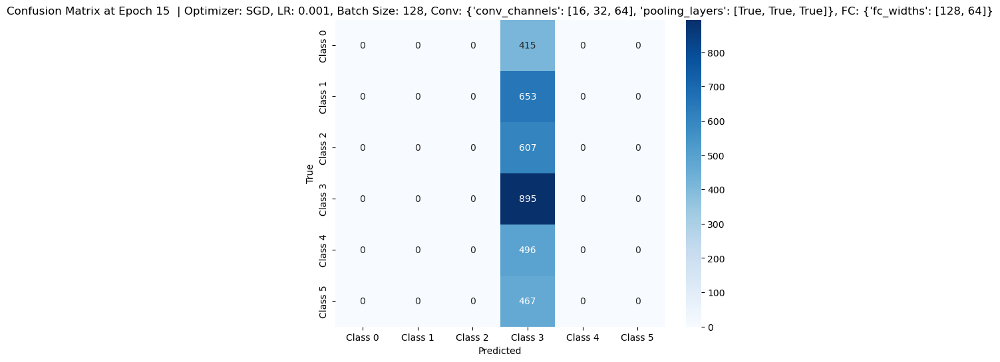

Visualizing for:  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


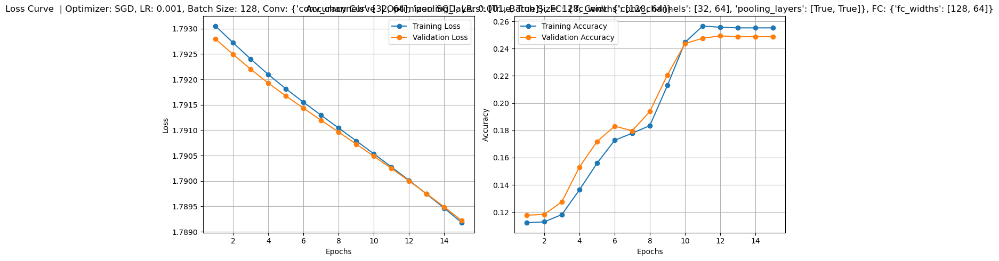

Confusion Matrix at Epoch 5 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


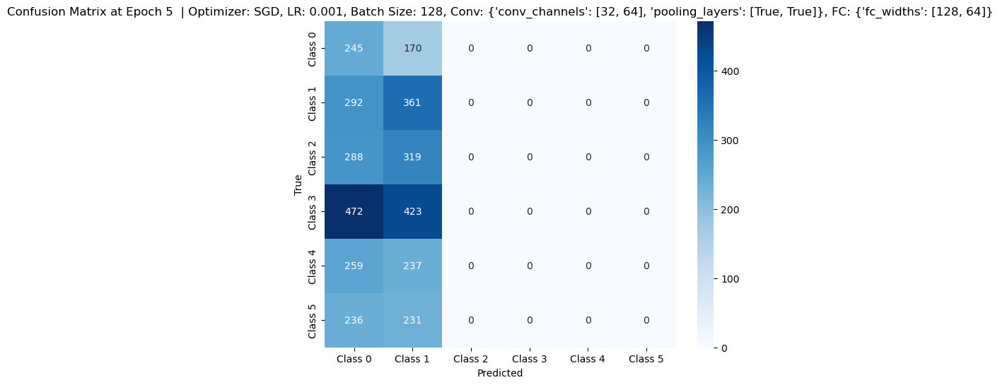

Confusion Matrix at Epoch 10 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


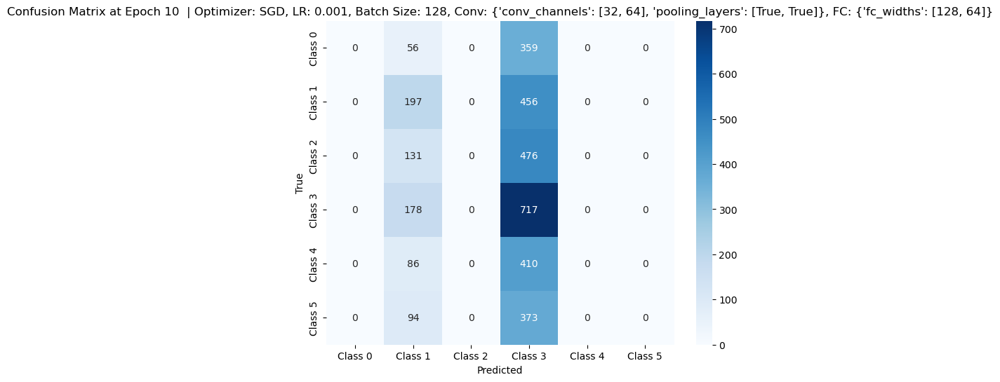

Confusion Matrix at Epoch 15 for  | Optimizer: SGD, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


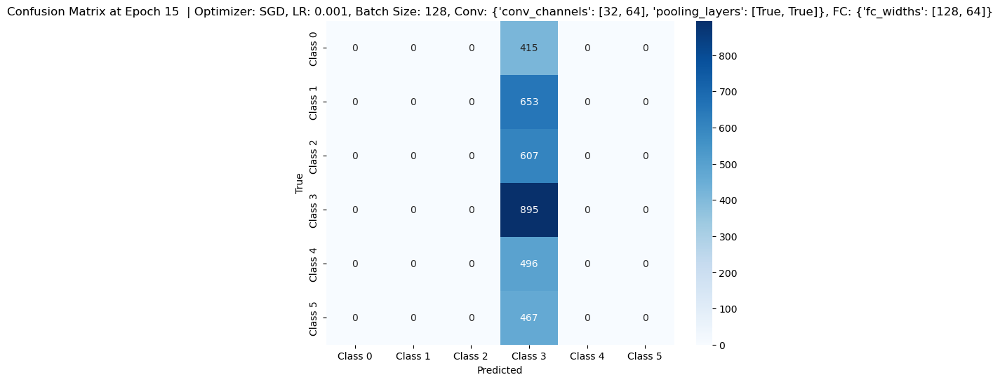

Visualizing for:  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


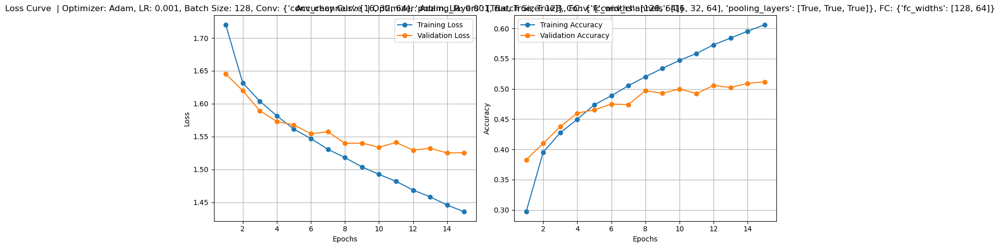

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


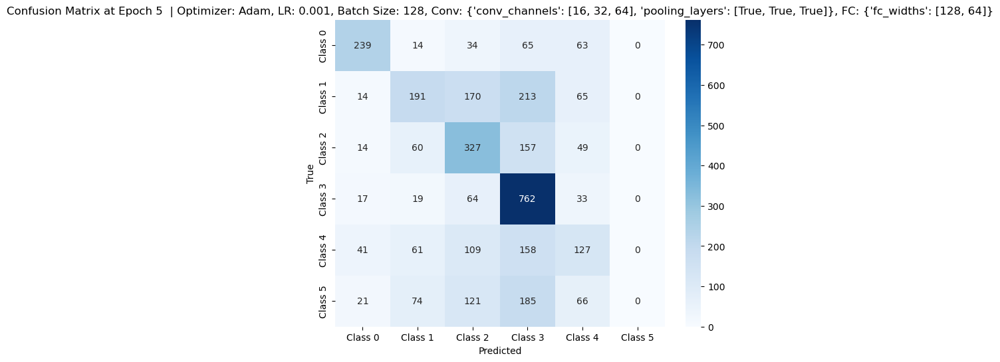

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


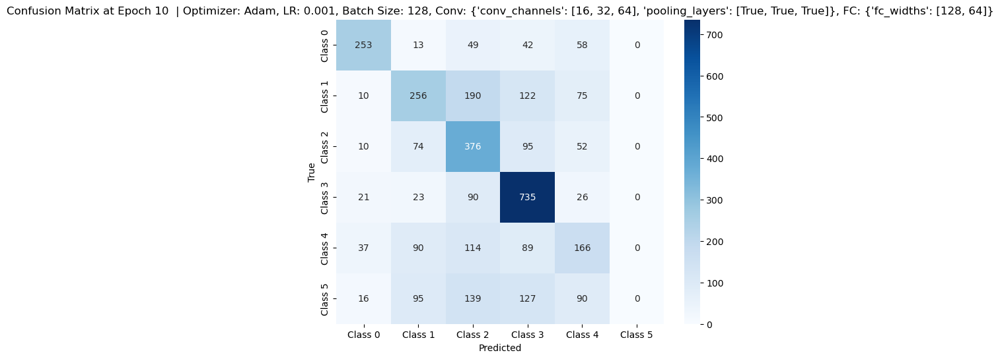

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}


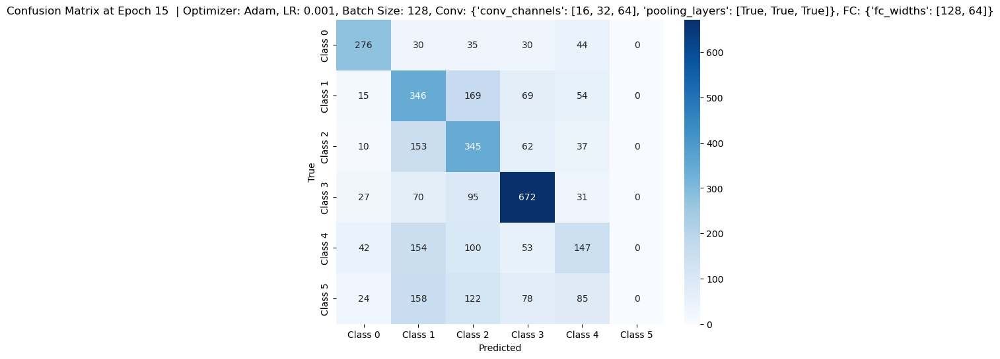

Visualizing for:  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


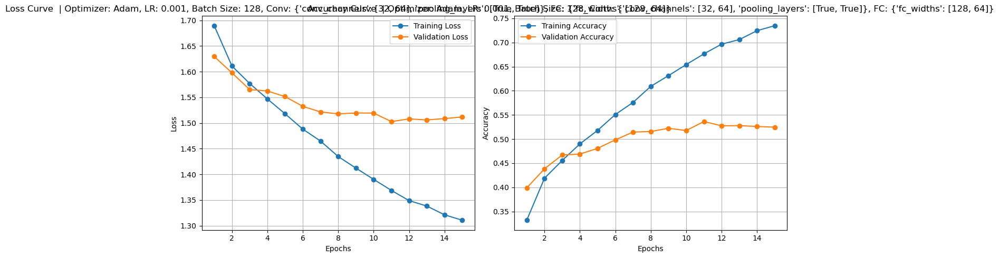

Confusion Matrix at Epoch 5 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


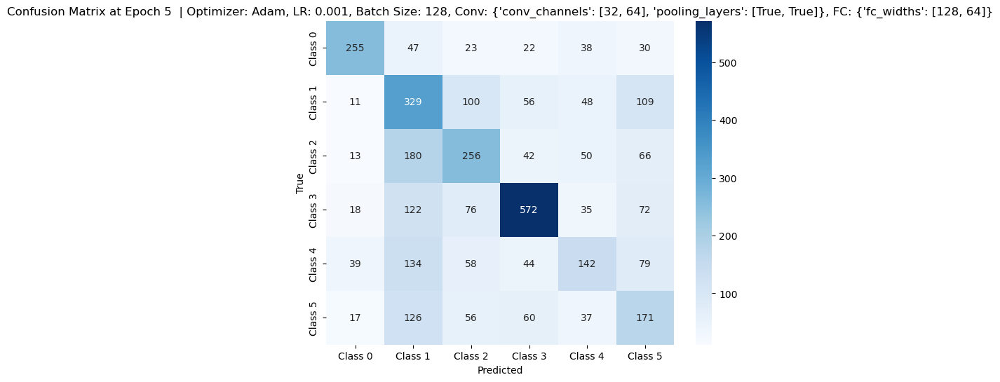

Confusion Matrix at Epoch 10 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


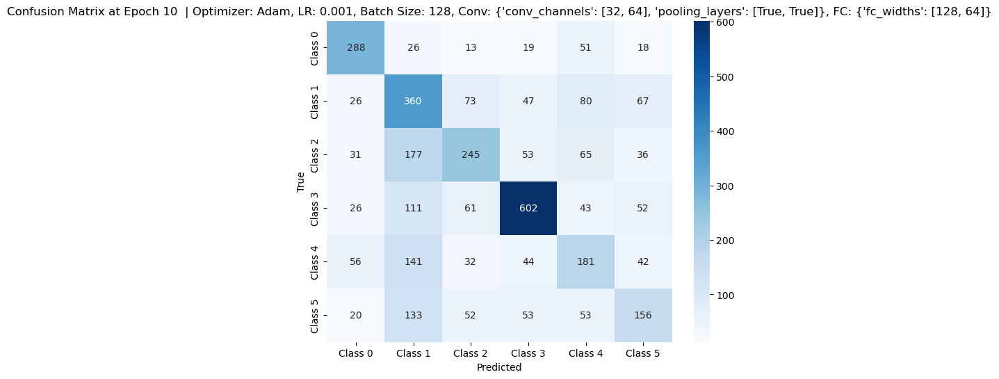

Confusion Matrix at Epoch 15 for  | Optimizer: Adam, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}


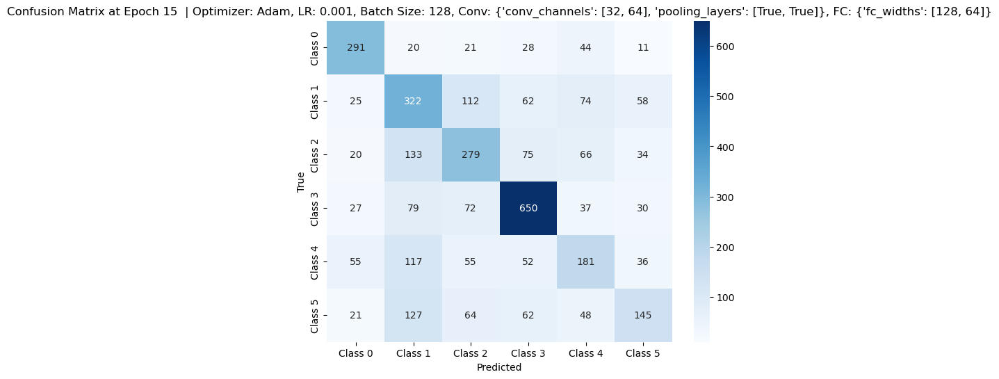

In [3]:
# Load the results from the JSON file
with open("./New Folder/cnn_results.json", "r") as f:
    results = json.load(f)

# Function to plot accuracy and loss curves
def plot_training_history(history, title_suffix=""):
    epochs = range(1, len(history["train_loss"]) + 1)

    # Plot loss
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_loss"], label="Training Loss", marker='o')
    plt.plot(epochs, history["val_loss"], label="Validation Loss", marker='o')
    plt.title(f"Loss Curve {title_suffix}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_acc"], label="Training Accuracy", marker='o')
    plt.plot(epochs, history["val_acc"], label="Validation Accuracy", marker='o')
    plt.title(f"Accuracy Curve {title_suffix}")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

# Function to plot confusion matrices
def plot_confusion_matrix(conf_matrix, epoch, title_suffix=""):
    classes = [f"Class {i}" for i in range(len(conf_matrix))]
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
    plt.title(f"Confusion Matrix at Epoch {epoch} {title_suffix}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# Iterate through results and visualize
for result in results:
    title_suffix = (f" | Optimizer: {result['optimizer']}, LR: {result['lr']}, "
                    f"Batch Size: {result['batch_size']}, Conv: {result['conv_config']}, FC: {result['fc_config']}")

    # Plot training and validation curves
    print(f"Visualizing for: {title_suffix}")
    plot_training_history(result["history"], title_suffix)

    # Plot confusion matrices at saved epochs
    for epoch, conf_matrix in result["history"]["confusion_matrices"].items():
        print(f"Confusion Matrix at Epoch {epoch} for {title_suffix}")
        plot_confusion_matrix(np.array(conf_matrix), epoch, title_suffix)


Analyzing the effect of batch_size...


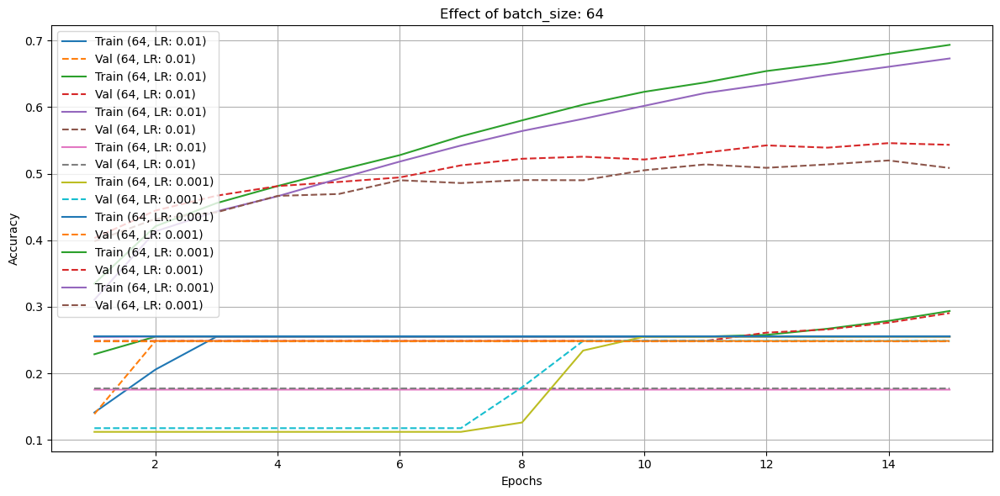

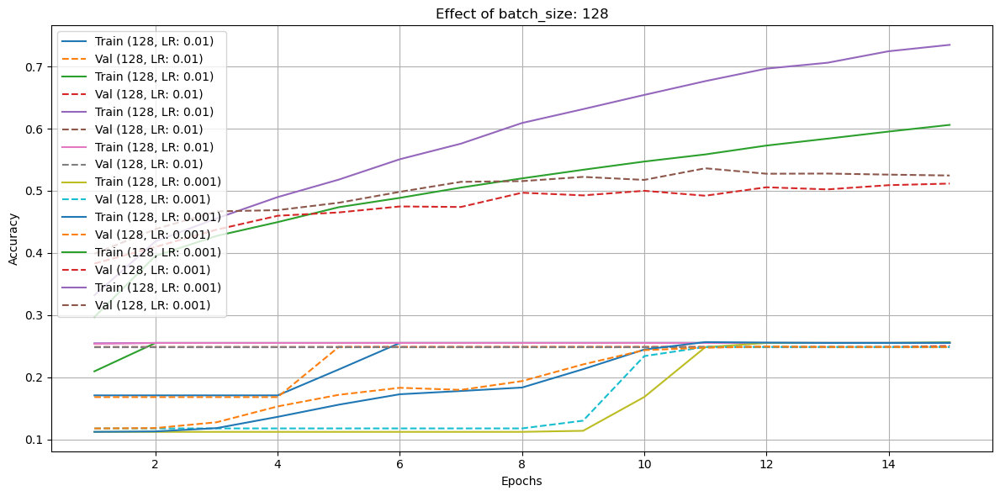

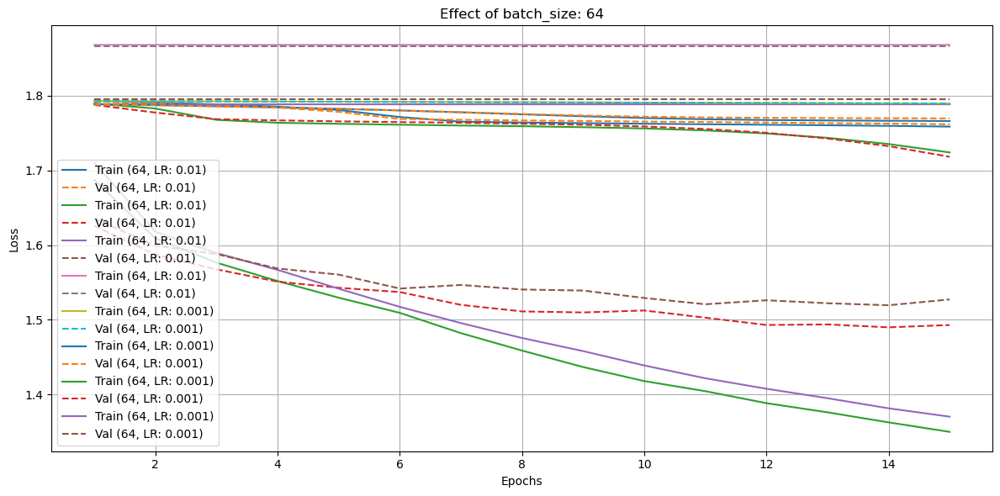

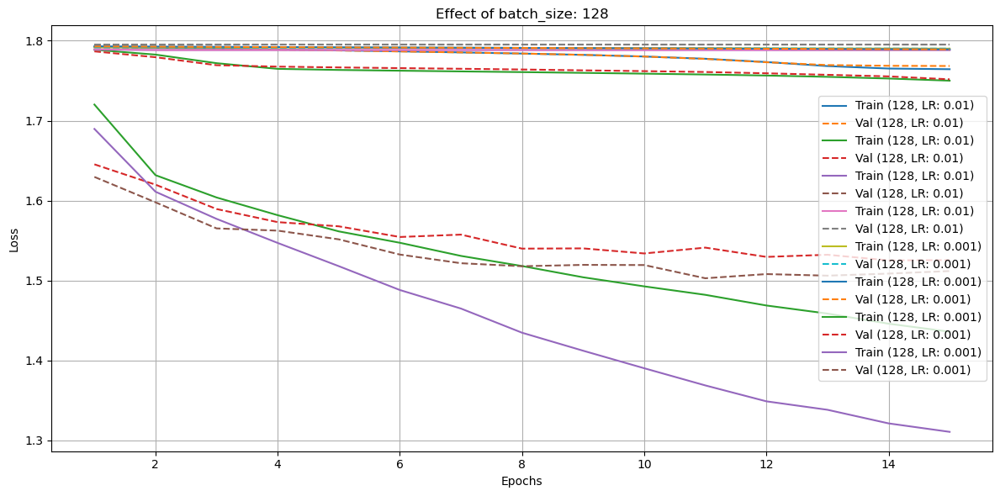

Analyzing the effect of lr...


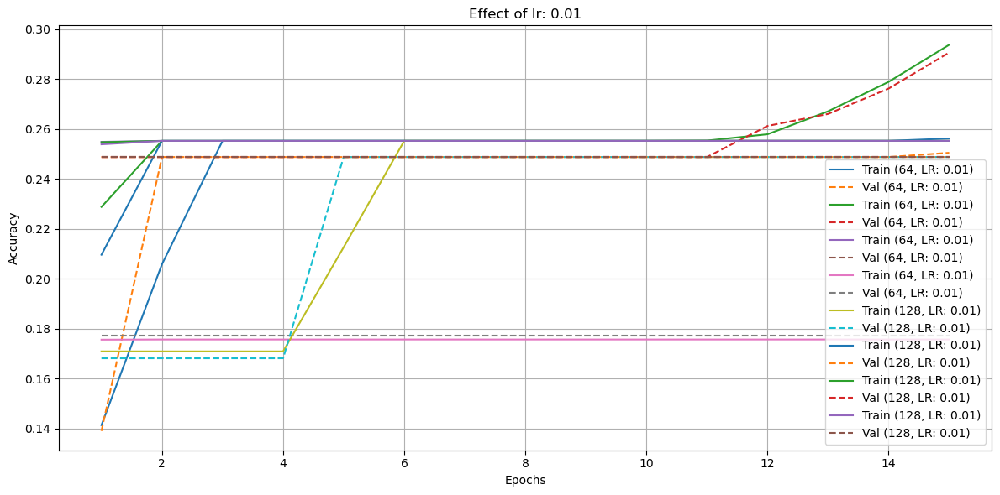

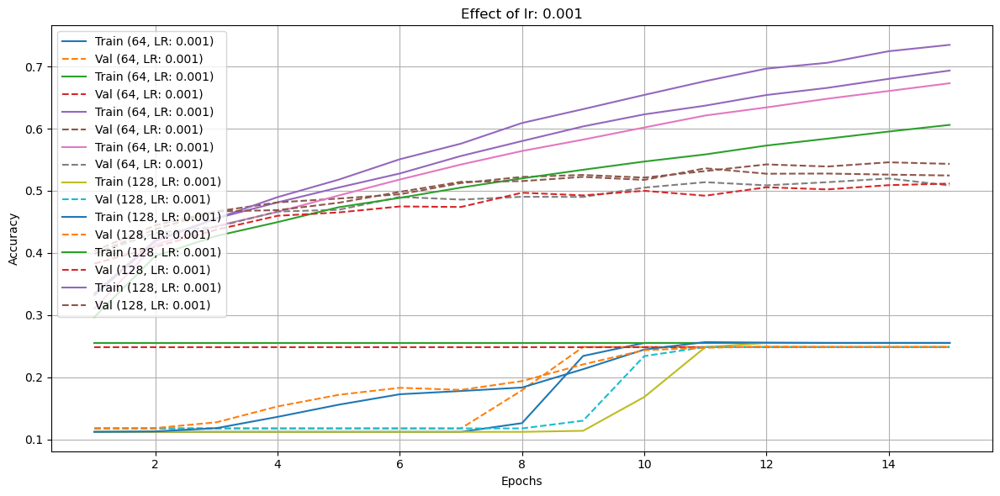

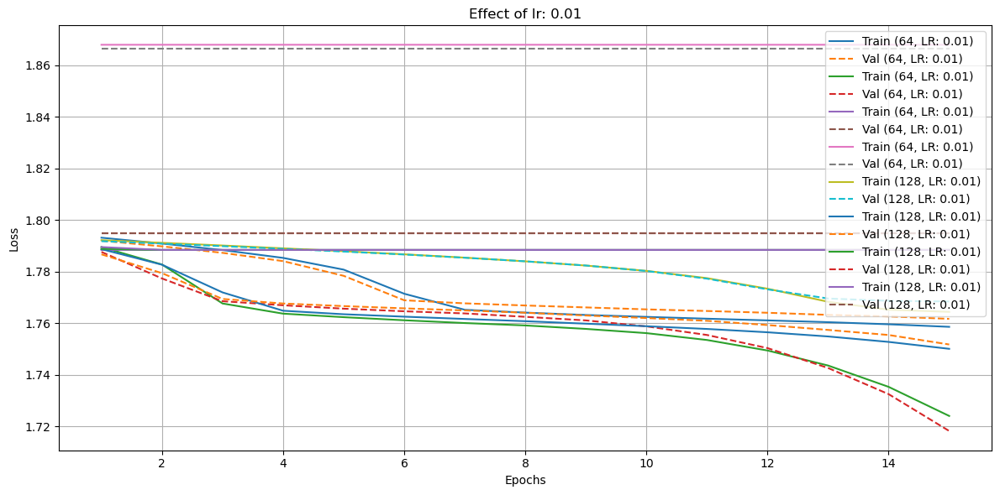

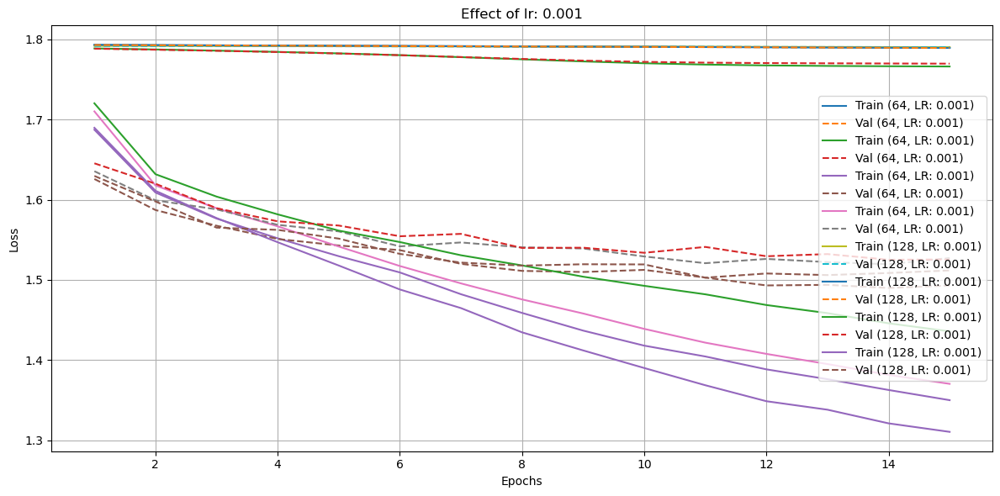

Analyzing the effect of optimizer...


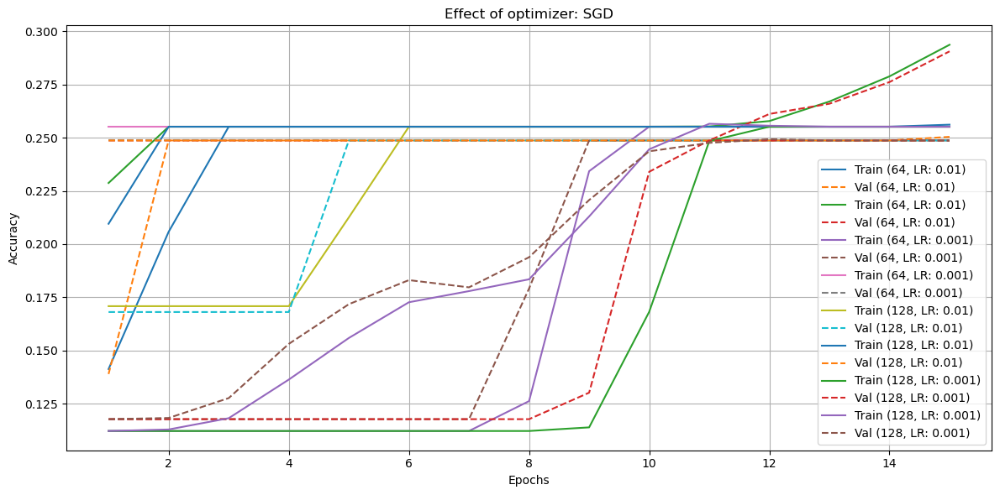

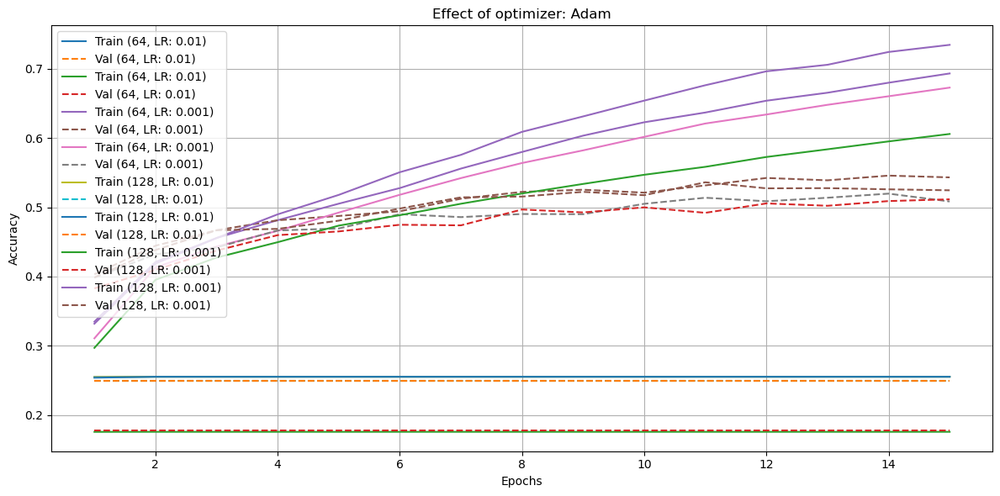

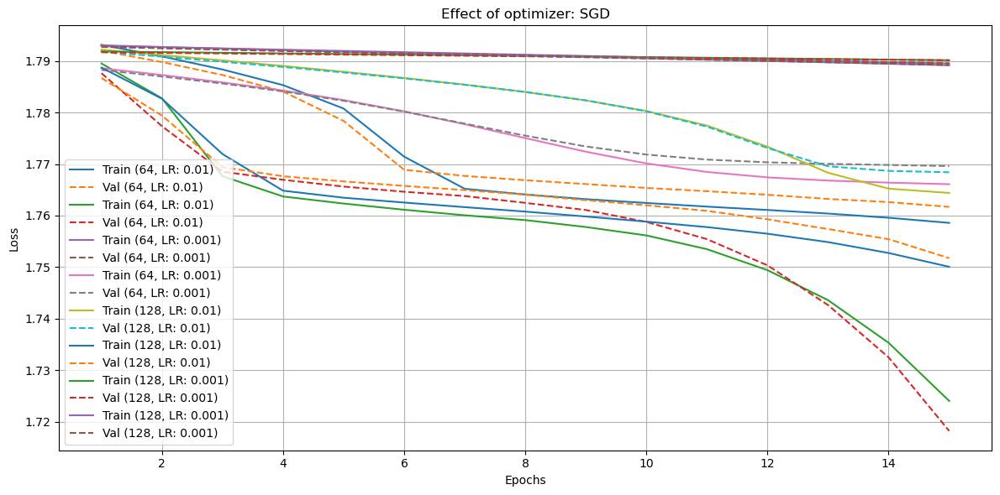

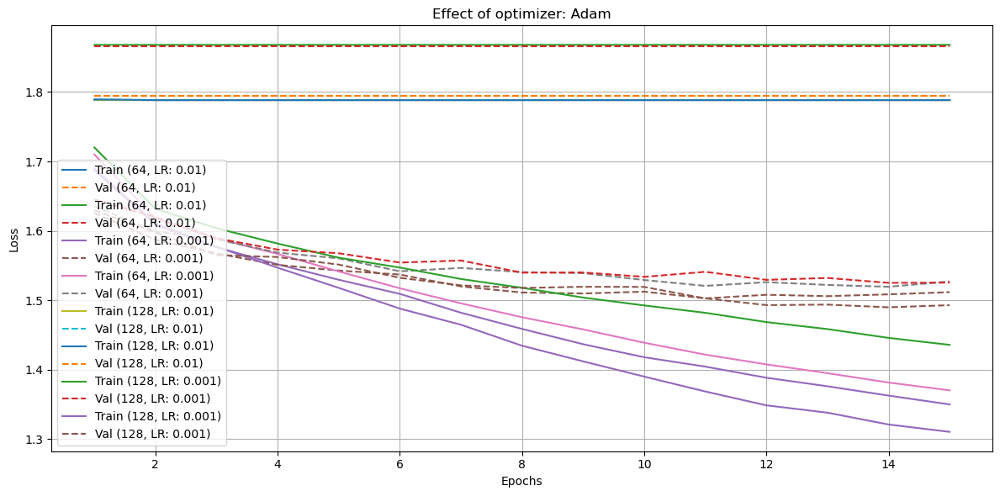

Analyzing the effect of conv_config...


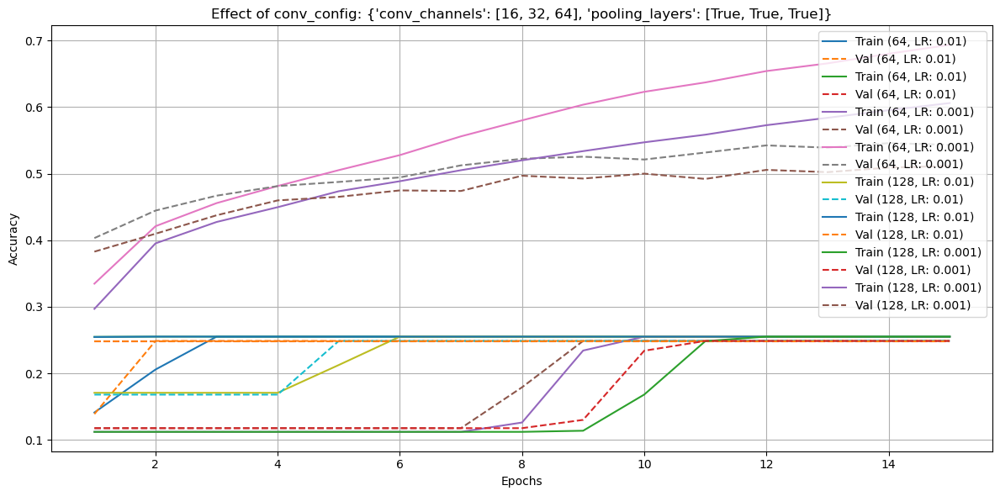

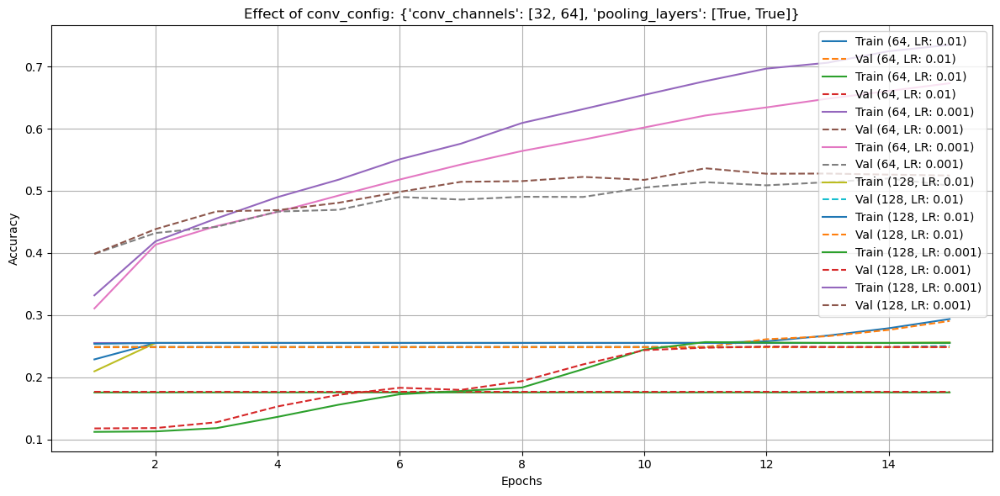

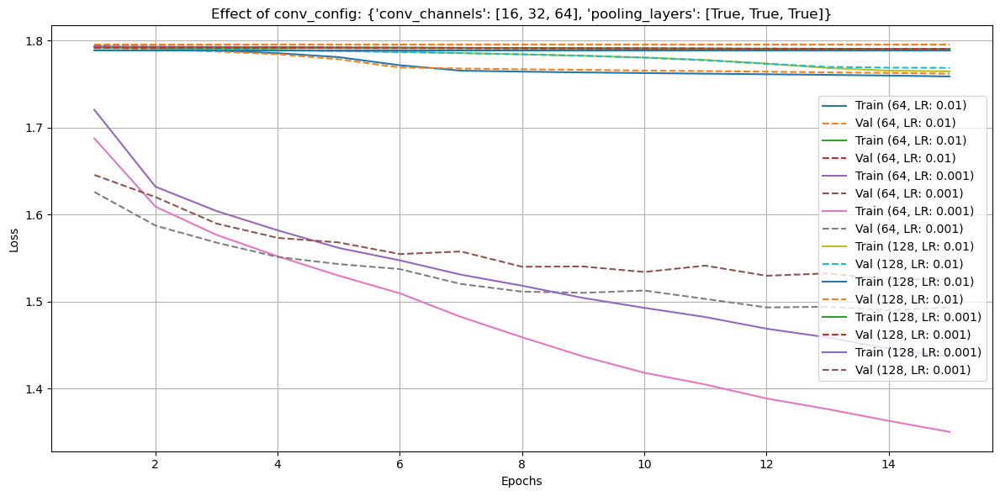

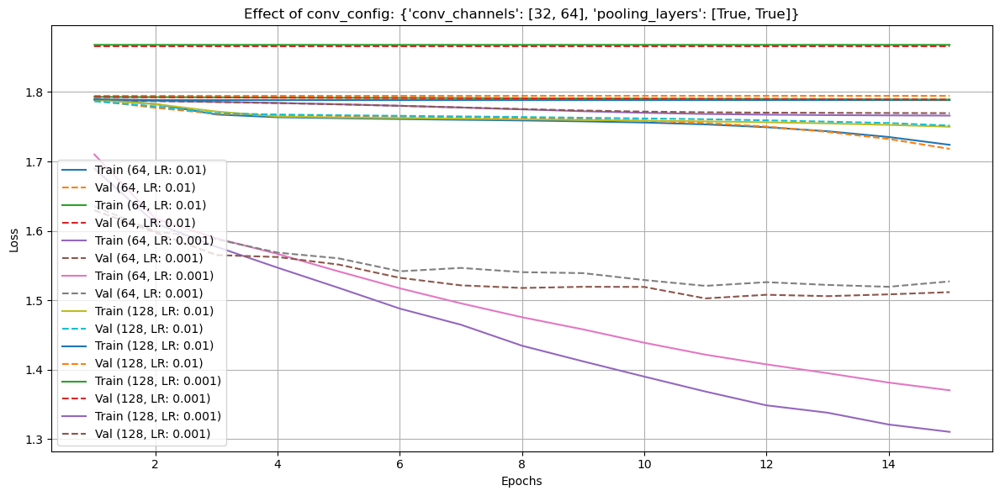

In [4]:
# Load the results from the JSON file
with open("./New Folder/cnn_results.json", "r") as f:
    results = json.load(f)

# Function to group results by a specific parameter
def group_by_parameter(results, parameter):
    grouped = {}
    for result in results:
        key = result[parameter]
        # Convert dictionaries to strings for hashing
        if isinstance(key, dict):
            key = str(key)
        if key not in grouped:
            grouped[key] = []
        grouped[key].append(result)
    return grouped

# Function to compare training/validation progress
def compare_learning_curves(grouped_results, parameter_name, metric="accuracy"):
    for group, scenarios in grouped_results.items():
        plt.figure(figsize=(12, 6))
        for scenario in scenarios:
            history = scenario["history"]
            epochs = range(1, len(history["train_loss"]) + 1)

            # Extract metric curves
            if metric == "accuracy":
                train_metric = history["train_acc"]
                val_metric = history["val_acc"]
                ylabel = "Accuracy"
            elif metric == "loss":
                train_metric = history["train_loss"]
                val_metric = history["val_loss"]
                ylabel = "Loss"

            # Plot training and validation progress
            plt.plot(epochs, train_metric, label=f"Train ({scenario['batch_size']}, LR: {scenario['lr']})")
            plt.plot(epochs, val_metric, label=f"Val ({scenario['batch_size']}, LR: {scenario['lr']})", linestyle="--")

        plt.title(f"Effect of {parameter_name}: {group}")
        plt.xlabel("Epochs")
        plt.ylabel(ylabel)
        plt.legend()
        plt.grid()
        plt.tight_layout()
        plt.show()

# Function to analyze the effect of one parameter while others are constant
def analyze_parameter_effect(results, parameter):
    # Group results by the chosen parameter
    grouped_results = group_by_parameter(results, parameter)

    print(f"Analyzing the effect of {parameter}...")
    compare_learning_curves(grouped_results, parameter, metric="accuracy")
    compare_learning_curves(grouped_results, parameter, metric="loss")

# Example 1: Analyzing the effect of batch size
analyze_parameter_effect(results, parameter="batch_size")

# Example 2: Analyzing the effect of learning rate
analyze_parameter_effect(results, parameter="lr")

# Example 3: Analyzing the effect of optimizer
analyze_parameter_effect(results, parameter="optimizer")

# Example 4: Analyzing the effect of model configuration
analyze_parameter_effect(results, parameter="conv_config")


In [6]:
# Load results from the JSON file
with open("./New Folder/cnn_results.json", "r") as f:
    results = json.load(f)

# Function to calculate class-wise accuracy from a confusion matrix
def calculate_class_accuracies(conf_matrix):
    class_accuracies = []
    for i in range(len(conf_matrix)):
        correct = conf_matrix[i][i]
        total = sum(conf_matrix[i])
        accuracy = correct / total if total > 0 else 0.0
        class_accuracies.append(accuracy)
    return class_accuracies

# Function to generate classification report from confusion matrix
def generate_classification_report(conf_matrix):
    y_true = []
    y_pred = []
    for i, row in enumerate(conf_matrix):
        for j, count in enumerate(row):
            y_true.extend([i] * count)  # Append `count` true labels of class `i`
            y_pred.extend([j] * count)  # Append `count` predicted labels of class `j`
    # Set `zero_division=0` to avoid warnings
    return classification_report(y_true, y_pred, output_dict=True, zero_division=0)

# Summarize performance for each model
performance_data = []

for result in results:
    # Model configuration
    title_suffix = (f"Optimizer: {result['optimizer']}, LR: {result['lr']}, "
                    f"Batch Size: {result['batch_size']}, Conv: {result['conv_config']}, FC: {result['fc_config']}")

    # Extract the last saved confusion matrix
    conf_matrices = result["history"]["confusion_matrices"]
    last_epoch = max(conf_matrices.keys())
    conf_matrix = np.array(conf_matrices[str(last_epoch)])  # Convert to numpy array

    # Calculate overall accuracy
    total_correct = np.trace(conf_matrix)
    total_samples = np.sum(conf_matrix)
    overall_acc = total_correct / total_samples if total_samples > 0 else 0.0

    # Class-wise accuracies and worst group accuracy
    class_accuracies = calculate_class_accuracies(conf_matrix)
    worst_group_acc = min(class_accuracies)

    # Classification report
    clf_report = generate_classification_report(conf_matrix)
    macro_avg = clf_report["macro avg"]

    # Append summary for this model
    performance_data.append({
        "Model Config": title_suffix,
        "Overall Accuracy": overall_acc,
        "Macro Recall": macro_avg["recall"],
        "Macro F1-Score": macro_avg["f1-score"],
        "Worst Group Accuracy": worst_group_acc,
    })

# Convert performance data to a DataFrame for better display
performance_df = pd.DataFrame(performance_data)

# Sort by Overall Accuracy for better visualization
performance_df = performance_df.sort_values(by="Overall Accuracy", ascending=False)

# Adjust display settings for Pandas
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', 1000)  # Increase width to avoid line wrapping
pd.set_option('display.max_colwidth', None)  # Show full content of each cell

# Display the table
print(performance_df)


                                                                                                                                              Model Config  Overall Accuracy  Macro Recall  Macro F1-Score  Worst Group Accuracy
6    Optimizer: Adam, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [16, 32, 64], 'pooling_layers': [True, True, True]}, FC: {'fc_widths': [128, 64]}          0.493915      0.458750        0.450578              0.117773
15            Optimizer: Adam, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}          0.488254      0.471933        0.478216              0.286290
7              Optimizer: Adam, LR: 0.001, Batch Size: 64, Conv: {'conv_channels': [32, 64], 'pooling_layers': [True, True]}, FC: {'fc_widths': [128, 64]}          0.467591      0.439972        0.423796              0.175403
14  Optimizer: Adam, LR: 0.001, Batch Size: 128, Conv: {'conv_channels': [16, 32, 64], 'pooling_laye

#### Analysis of Parameter Effects

##### 1. **Convolutional Layer Configuration**
   - **General Impact**: Convolutional layers extract hierarchical features from input images. More layers typically capture finer details but also increase computational cost and risk overfitting.
   - **Results Justification**:
     - The configuration with three convolutional layers (16, 32, 64 channels) consistently outperformed the simpler two-layer configuration (32, 64 channels) in overall accuracy. The additional layer likely helped capture deeper spatial features.
     - However, performance improvements in the worst-class accuracy were limited, indicating that even a deeper architecture may not adequately address class imbalances or hard-to-classify samples.

##### 2. **Pooling Layers**
   - **General Impact**: Pooling layers reduce spatial dimensions, improving computational efficiency and introducing translational invariance.
   - **Results Justification**:
     - Both configurations used pooling after each convolutional layer, leading to significant reductions in feature map size. While this reduced computational cost, it may have limited the network's ability to retain finer-grained features critical for some challenging classes.

##### 3. **Optimizer**
   - **General Impact**: The choice of optimizer affects convergence speed and stability.
     - **SGD** provides stable updates but requires carefully tuned learning rates, often converging more slowly.
     - **Adam**, with its adaptive learning rates, typically achieves faster convergence.
   - **Results Justification**:
     - Models trained with Adam outperformed those trained with SGD in terms of overall accuracy and macro F1-score. This is consistent with Adam's robustness in training deeper networks with complex gradients.
     - The poorest-performing configurations all involved SGD, particularly with higher learning rates, highlighting its sensitivity to hyperparameter tuning.

##### 4. **Learning Rate**
   - **General Impact**: The learning rate influences the size of the steps taken during optimization.
     - Higher rates (e.g., 0.01) risk overshooting optimal solutions, while lower rates (e.g., 0.001) ensure finer convergence at the cost of slower training.
   - **Results Justification**:
     - Models with a learning rate of 0.001 consistently outperformed those with 0.01. This suggests that the higher learning rate introduced instability, particularly in combination with SGD.

##### 5. **Batch Size**
   - **General Impact**: Batch size determines the number of samples used per gradient update.
     - Smaller batch sizes introduce noise, which can improve generalization but may slow convergence.
     - Larger batch sizes result in smoother updates, potentially at the cost of generalization.
   - **Results Justification**:
     - Batch size 64 often yielded better macro F1-scores and worst-class accuracy compared to batch size 128. The increased noise during optimization likely improved generalization, particularly for harder classes.

---

##### Summary

This study highlights the sensitivity of CNN performance to architectural and training hyperparameters:
- Deeper convolutional configurations generally improved overall accuracy but struggled with worst-class performance.
- Adam consistently outperformed SGD, particularly at lower learning rates.
- Smaller batch sizes improved worst-class accuracy, reflecting better generalization.


### Number of parameter for CNN and MLP

Let’s calculate the total number of learnable parameters based on the best MLP details:

- **Input size (\(n_{\text{input}}\))**: \(48 \times 48 = 2304\) (flattened 48x48 image).
- **Output size (\(n_{\text{output}}\))**: 6 (number of classes).
- **Hidden layers**: 3 layers with widths \([256, 128, 64]\).

#### 1. Input Layer to First Hidden Layer
$$
\text{Parameters} = (2304 \times 256) + 256
$$
$$
\text{Parameters} = 589,824 + 256 = 590,080
$$

#### 2. First Hidden Layer to Second Hidden Layer
$$
\text{Parameters} = (256 \times 128) + 128
$$
$$
\text{Parameters} = 32,768 + 128 = 32,896
$$

#### 3. Second Hidden Layer to Third Hidden Layer
$$
\text{Parameters} = (128 \times 64) + 64
$$
$$
\text{Parameters} = 8,192 + 64 = 8,256
$$

#### 4. Third Hidden Layer to Output Layer
$$
\text{Parameters} = (64 \times 6) + 6
$$
$$
\text{Parameters} = 384 + 6 = 390
$$

#### Total Parameters
Summing up all the parameters:
$$
\text{Total Parameters} = 590,080 + 32,896 + 8,256 + 390 = 631,622
$$

---

**The model has a total of 631,622 learnable parameters.**

#### best CNN Configuration
- **Convolutional Layers**:
  - **First Layer**: $3 \times 3$ kernel, 1 input channel, 16 output channels.
    $$
    \text{Params} = (3 \times 3 \times 1 \times 16) + 16 = 144 + 16 = 160
    $$
  - **Second Layer**: $3 \times 3$ kernel, 16 input channels, 32 output channels.
    $$
    \text{Params} = (3 \times 3 \times 16 \times 32) + 32 = 4608 + 32 = 4640
    $$
  - **Third Layer**: $3 \times 3$ kernel, 32 input channels, 64 output channels.
    $$
    \text{Params} = (3 \times 3 \times 32 \times 64) + 64 = 18432 + 64 = 18496
    $$

- **Fully Connected Layers**:
  - After convolutions, the input size is reduced by pooling:
    $$
    \text{Image Size after Pooling} = \frac{48}{2^3} \times \frac{48}{2^3} = 6 \times 6
    $$
    Flattened size: $6 \times 6 \times 64 = 2304$.
  - **First FC Layer**: 2304 inputs, 128 outputs.
    $$
    \text{Params} = (2304 \times 128) + 128 = 294912 + 128 = 295040
    $$
  - **Second FC Layer**: 128 inputs, 64 outputs.
    $$
    \text{Params} = (128 \times 64) + 64 = 8192 + 64 = 8256
    $$
  - **Output Layer**: 64 inputs, 6 outputs.
    $$
    \text{Params} = (64 \times 6) + 6 = 384 + 6 = 390
    $$

#### Total Parameters
$$
\text{Total Params} = 160 + 4640 + 18496 + 295040 + 8256 + 390 = 308982
$$

---

#### Comparison with MLP
- **CNN Parameters**: 308,982
- **MLP Parameters**: 631,622

The CNN uses significantly fewer parameters than the MLP, highlighting its efficiency in capturing spatial features with fewer computations. 

### drop out for CNN


In [ ]:
# Define the best model configuration
best_conv_config = {"conv_channels": [16, 32, 64], "pooling_layers": [True, True, True]}
best_fc_config = {"fc_widths": [128, 64]}
best_optimizer = optim.Adam
best_lr = 0.001
best_batch_size = 64
dropout_rates = [0.5, 0.5]  # Dropout rates for each fully connected layer
epochs = 15

# Prepare dataloaders
train_loader, val_loader, test_loader = prepare_dataloaders(
    train_data, val_data, test_data, batch_size=best_batch_size
)

# Create model with dropout
model_with_dropout = CustomCNN(
    input_shape=image_size,  # Assuming grayscale images of size 48x48
    num_classes=num_classes,
    conv_config=best_conv_config,
    fc_config=best_fc_config,
    dropout_rates=dropout_rates
)

# Define optimizer and criterion
optimizer = best_optimizer(model_with_dropout.parameters(), lr=best_lr)
criterion = nn.CrossEntropyLoss()

# Train the model
history_with_dropout = train_model(
    model_with_dropout,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    epochs=epochs,
    device=device,
    test_loader=test_loader
)

In [ ]:
# Function to serialize non-serializable objects
def serialize_history(history):
    def serialize_obj(obj):
        if isinstance(obj, np.ndarray):  # Convert NumPy arrays to lists
            return obj.tolist()
        elif isinstance(obj, torch.Tensor):  # Convert PyTorch tensors to lists
            return obj.cpu().tolist()
        elif isinstance(obj, dict):  # Recursively process dictionaries
            return {k: serialize_obj(v) for k, v in obj.items()}
        elif isinstance(obj, list):  # Recursively process lists
            return [serialize_obj(v) for v in obj]
        else:  # Return the object as is for other types
            return obj

    return serialize_obj(history)

# Serialize the history
serialized_history = serialize_history(history_with_dropout)

# Save to JSON
with open("cnn_results_with_dropout.json", "w") as f:
    json.dump(serialized_history, f)

print("Training with dropout completed and history saved.")

Visualizing Results


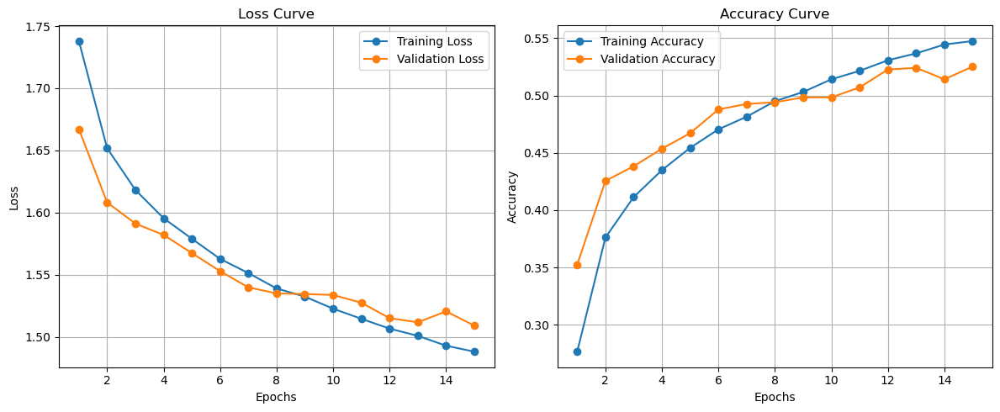

Confusion Matrix at Epoch 5


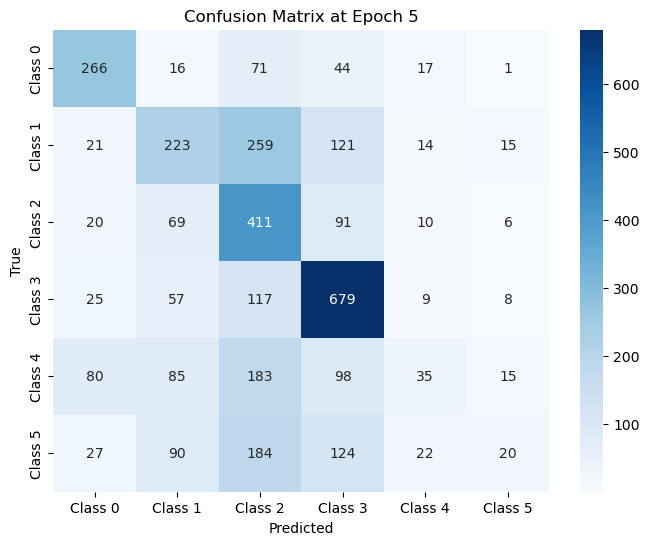

Confusion Matrix at Epoch 10


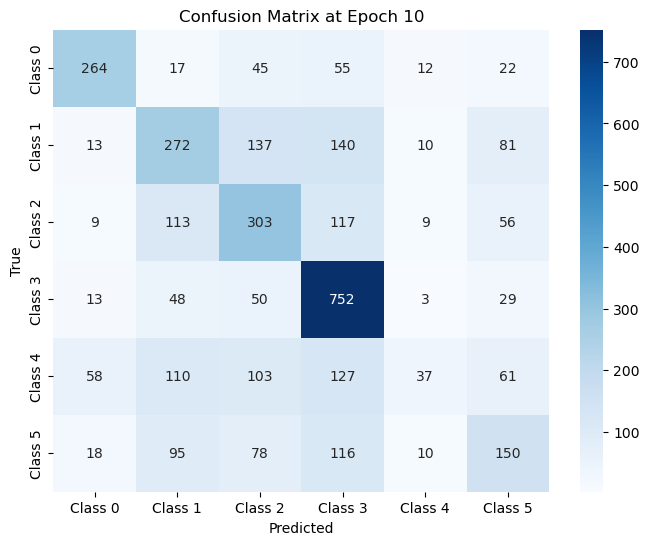

Confusion Matrix at Epoch 15


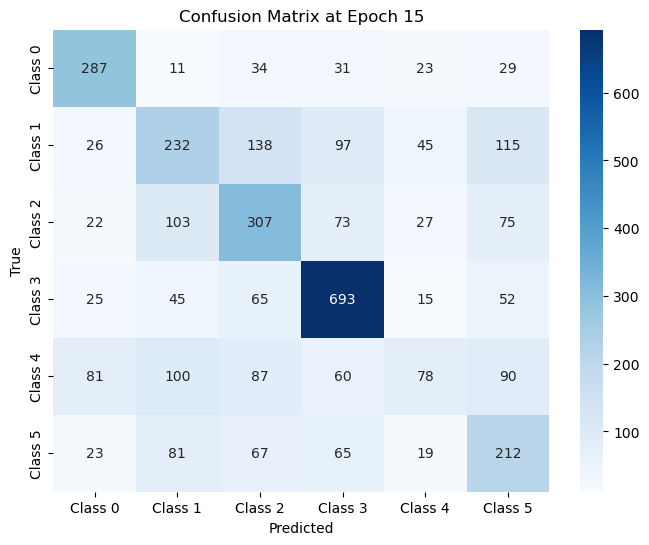

In [ ]:
import json
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the results from the JSON file
with open("./New Folder/cnn_results_with_dropout.json", "r") as f:
    results = json.load(f)

# Function to plot training history
def plot_training_history(history):
    epochs = range(1, len(history["train_loss"]) + 1)

    # Plot training and validation loss
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_loss"], label="Training Loss", marker='o')
    plt.plot(epochs, history["val_loss"], label="Validation Loss", marker='o')
    plt.title("Loss Curve")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid()

    # Plot training and validation accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_acc"], label="Training Accuracy", marker='o')
    plt.plot(epochs, history["val_acc"], label="Validation Accuracy", marker='o')
    plt.title("Accuracy Curve")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

# Function to plot confusion matrices
def plot_confusion_matrix(conf_matrix, epoch):
    classes = [f"Class {i}" for i in range(len(conf_matrix))]
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
    plt.title(f"Confusion Matrix at Epoch {epoch}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# Visualize the results
print("Visualizing Results")
plot_training_history(results)

# Plot confusion matrices at specific epochs
for epoch, conf_matrix in results["confusion_matrices"].items():
    print(f"Confusion Matrix at Epoch {epoch}")
    plot_confusion_matrix(np.array(conf_matrix), epoch)


#### Analysis of Dropout Implementation and Its Impact on Model Performance

To address the challenge of overfitting observed in the CNN training process, dropout layers were introduced to the fully connected sections of the network. Dropout is a regularization technique that randomly sets a fraction of neuron outputs to zero during training, thereby preventing the network from relying too heavily on specific neurons. This encourages the model to learn more generalized patterns in the data.

##### Observations
1. **Test Performance Stability:** The overall test performance metrics, including accuracy and F1-score, remained consistent compared to the earlier results without dropout. This confirms that the dropout implementation did not compromise the model's predictive capability on unseen data.
2. **Reduced Overfitting:** The training and validation loss curves showed a notable improvement in alignment. Without dropout, the training loss decreased rapidly, often diverging from the validation loss, indicating overfitting. With dropout, the gap between these curves narrowed, demonstrating better generalization to validation data.

##### Key Insights
- **Generalization:** By discouraging reliance on specific features or neurons, dropout forced the network to distribute its learning capacity more evenly across the parameters. This improved the model's ability to generalize from training data to validation and test sets.
- **Model Robustness:** The consistent performance across different configurations and datasets indicates that dropout enhanced the model's robustness without requiring additional computational complexity or hyperparameter tuning.

##### Conclusion
The integration of dropout effectively mitigated overfitting while preserving the model's performance on the test set. This adjustment underscores the importance of regularization techniques in deep learning, particularly when working with complex models and limited datasets. By enhancing generalization, dropout ensures the model's reliability in real-world applications where unseen data may vary significantly from the training distribution.